In [1]:
from general_tools.notebook.gpu_utils import setup_one_gpu
GPU = 0
setup_one_gpu(GPU)

Picking GPU 0


In [2]:
import sys
import time
import numpy as np
import os.path as osp
import tensorflow as tf
import matplotlib.pyplot as plt

from general_tools.notebook.tf import reset_tf_graph

import tf_lab.point_clouds.in_out as pio
from tf_lab.point_clouds.in_out import PointCloudDataSet, write_model_ids_of_datasets

from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder
from tf_lab.point_clouds.autoencoder import Configuration as Conf
import tf_lab.point_clouds.encoders_decoders as enc_dec

from tf_lab.autopredictors.scripts.helper import shape_net_category_to_synth_id

from tf_lab.autopredictors.plotting import plot_original_pclouds_vs_reconstructed, \
                                           plot_train_val_test_curves, plot_reconstructions_at_epoch

from tf_lab.autopredictors.evaluate import eval_model, read_saved_epochs

from tf_lab.autopredictors.exploration import latent_embedding_of_entire_dataset
                                                  
from general_tools.in_out.basics import create_dir, delete_files_in_directory, files_in_subdirs
from general_tools.simpletons import select_first_last_and_k

from geo_tool import Point_Cloud

from tf_lab.nips.data_sets.shape_net import pc_loader as sn_pc_loader
from tf_lab.point_clouds.raw_gan import RawGAN
from tf_lab.point_clouds.raw_gan_gp import RawGAN_GP
from tf_lab.point_clouds.latent_gan import LatentGAN
from tf_lab.point_clouds.point_net_ae import PointNetAutoEncoder


from tf_lab.nips.evaluate_gan import entropy_of_occupancy_grid, jensen_shannon_divergence, \
                                     sample_pclouds_distances

from tf_lab.point_clouds.gan import model_saver_id

from tf_lab.autopredictors.exploration import find_neighbors

from tf_lab.nips.helper import pclouds_centered_and_half_sphere

from tf_lab.point_clouds.generators_discriminators import latent_code_discriminator_two_layers, latent_code_generator_two_layers    

from tf_lab.icml.ae_farm_helper import relevant_class

In [3]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [4]:
n_pc_samples = 2048
do_training = True
do_plotting = True
ae_loss = 'emd'

save_synthetic_samples = True
save_model = True
saver_step = 10

class_name = raw_input('Give me the class type: ').lower()
ae_id = raw_input('Give me the AE/experiment ID: ').lower()
cmp_type = raw_input('Comparison Type ("best" epoch vs. "max_min" epoch): ').lower()

syn_id = shape_net_category_to_synth_id()[class_name]

experiment_name = '_'.join(['nb_wgan_gp_ae', ae_id, ae_loss, class_name, str(n_pc_samples), cmp_type, 'epoch'])

top_data_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/'
synthetic_data_out_dir = '/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/synthetic_point_clouds'

train_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/gan/nb_gan')
train_dir = osp.join(train_dir, experiment_name)
create_dir(train_dir);

Give me the class type: chair
Give me the AE/experiment ID: 15
Comparison Type ("best" epoch vs. "max_min" epoch): best


In [5]:
# Load Raw Point-Clouds of class
pclouds_path = osp.join(top_data_dir, 'Point_Clouds/Shape_Net/Core/from_manifold_meshes/centered/', str(n_pc_samples))
pclouds_path = osp.join(pclouds_path, syn_id)
file_names = pio.load_filenames_of_input_data(pclouds_path, '.ply')
pclouds, model_ids, syn_ids = pio.load_crude_point_clouds(file_names=file_names, n_threads=50, loader=sn_pc_loader)
print '%d files containing complete point clouds were found.' % (len(pclouds), )

6778 files containing complete point clouds were found.


In [6]:
ae_help = relevant_class(ae_loss)

In [7]:
# Load Auto-Encoder
ae_net_name = 'ae_farm_' + class_name + '_conv_arch_' + ae_id + '_2048pts_' + ae_loss
ae_net_dir = osp.join(top_data_dir, 'OUT/icml/nn_models/ae_farming', ae_net_name)
ae_conf = Conf.load(osp.join(ae_net_dir, 'configuration'))
reset_tf_graph()
ae = PointNetAutoEncoder(ae_net_name, ae_conf)
bneck = ae.bottleneck_size
assert(ae_help.experiment_id_to_bneck[int(ae_id)] == bneck) 

if cmp_type.startswith('best'):
    load_epoch, _ = ae_help.best_epochs[bneck]
    print load_epoch
elif cmp_type.startswith('max'):
    load_epoch, _ = ae_help.max_min_epochs[bneck]
else:
    assert(False)
    saved_epochs = read_saved_epochs(ae_conf.train_dir)
    load_epoch = saved_epochs[-1]

ae.restore_model(ae_conf.train_dir, load_epoch, verbose=True)

950
Model restored in epoch 950.


In [8]:
# Convert raw-data to latent codes.
raw_data = PointCloudDataSet(pclouds, init_shuffle=False)
_, latent_codes, _ = latent_embedding_of_entire_dataset(raw_data, ae, ae_conf)
training_data = PointCloudDataSet(latent_codes)

In [17]:
# reconstructed = ae.decode(latent_codes)
# save_dir = osp.join(top_data_dir, 'OUT/icml/ae_reconstructed_point_clouds')
# create_dir(save_dir)
# save_file = osp.join(save_dir, 'ae_' + ae_id + '_2048pts_' + ae_loss + '_' + cmp_type)
# np.savez(save_file, reconstructed)

In [9]:
# TODO : make GAN conf.
init_lr = 0.0001
batch_size = 50

noise_params = {'mu':0, 'sigma': 0.5}
noise_dim = ae.bottleneck_size
max_epochs = 1500

n_syn_samples = training_data.num_examples  # Same number as original GT data.
n_out = [ae.bottleneck_size]

lam = 10
beta = 0.5
disc_kwargs = {'b_norm': False}
reset_tf_graph()
gan = RawGAN_GP(experiment_name, init_lr, lam, n_out, noise_dim,\
                latent_code_discriminator_two_layers, latent_code_generator_two_layers,\
                beta=beta, disc_kwargs=disc_kwargs)


1 (-1.944576080529778, 2.3975575378647558)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1 is not in all_model_checkpoint_paths. Manually adding it.


/usr/lib/pymodules/python2.7/matplotlib/collections.py:548: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == 'face':


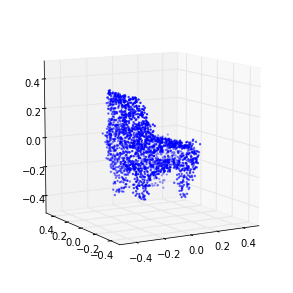

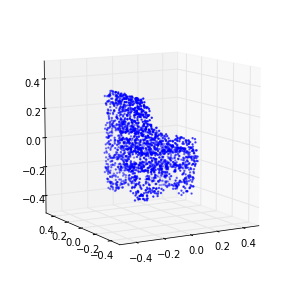

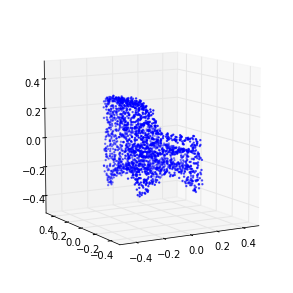

2 (-1.5825244435557613, 1.9075411293241713)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-2 is not in all_model_checkpoint_paths. Manually adding it.


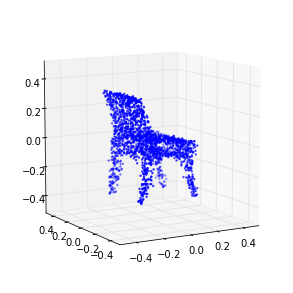

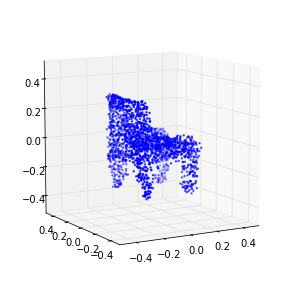

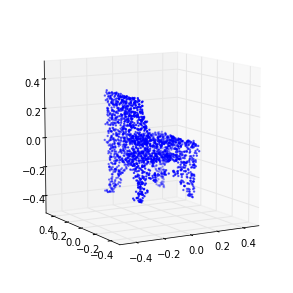

3 (-0.97297291534918329, 1.2190010812547472)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-3 is not in all_model_checkpoint_paths. Manually adding it.


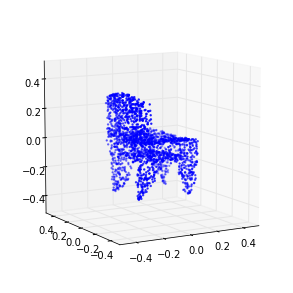

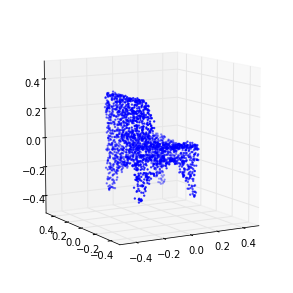

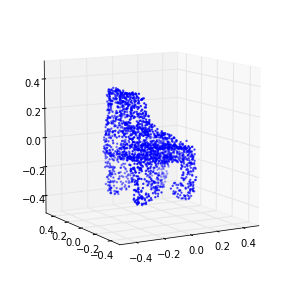

4 (-0.71656189494662814, 0.80914071533415055)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-4 is not in all_model_checkpoint_paths. Manually adding it.


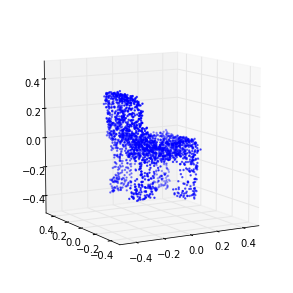

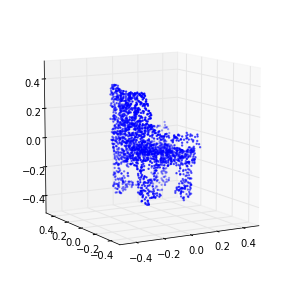

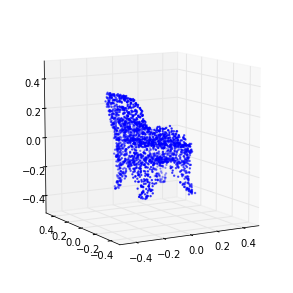

5 (-0.64157194561428499, 0.5410503115918901)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-5 is not in all_model_checkpoint_paths. Manually adding it.


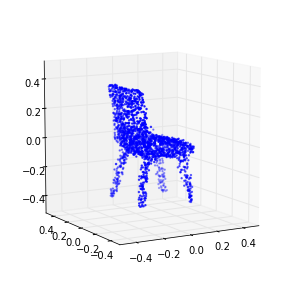

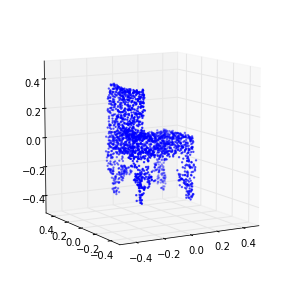

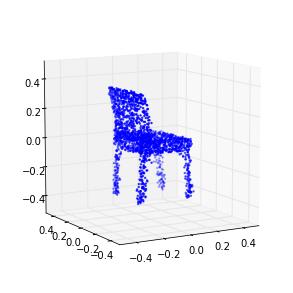

6 (-0.62203470689279061, 0.41351568036609226)
7 (-0.62016288969251843, 0.31703223232869748)
8 (-0.62692573600345192, 0.25881008472707534)
9 (-0.63515297969182327, 0.2233102156056298)
10 (-0.64097096610952309, 0.18003832852398907)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-10 is not in all_model_checkpoint_paths. Manually adding it.


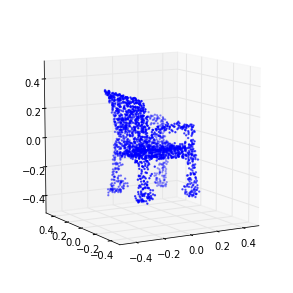

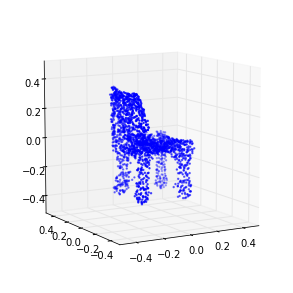

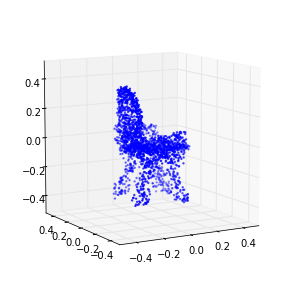

11 (-0.64378998897693773, 0.1606709830186985)
12 (-0.64449925864184343, 0.1414067116048601)
13 (-0.6445427148430436, 0.12647208902570936)
14 (-0.64268704299573542, 0.10969483162517901)
15 (-0.63925814672752668, 0.091475806302494467)
16 (-0.63588037049328838, 0.087501338372627899)
17 (-0.63187359615608496, 0.076964124761245867)
18 (-0.62873048252529573, 0.073527017539298092)
19 (-0.623747338630535, 0.061773640000157885)
20 (-0.61915557384490971, 0.063406565399081613)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-20 is not in all_model_checkpoint_paths. Manually adding it.


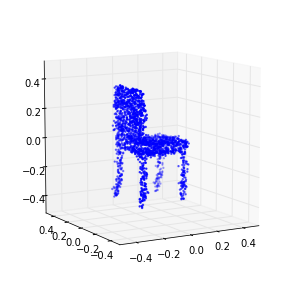

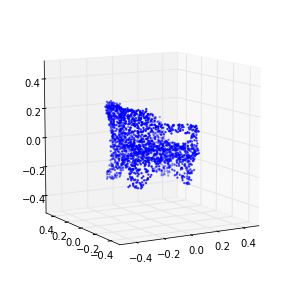

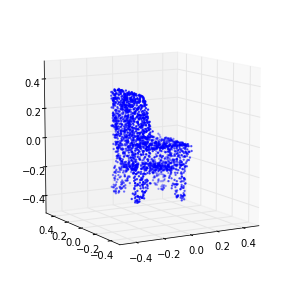

21 (-0.61692639324400156, 0.054033905957584026)
22 (-0.60936497140813761, 0.051742408631576434)
23 (-0.60736032680228902, 0.052188569472895727)
24 (-0.60198378651230422, 0.040477209621005587)
25 (-0.59991913504070704, 0.043405431874648286)
26 (-0.59664960702260339, 0.042565938982146757)
27 (-0.59375600108393911, 0.034566104243923396)
28 (-0.59116495097125021, 0.035296551952207531)
29 (-0.59166792586997707, 0.036087389621469707)
30 (-0.59356869017636338, 0.031924983727987168)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-30 is not in all_model_checkpoint_paths. Manually adding it.


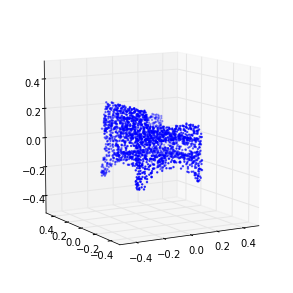

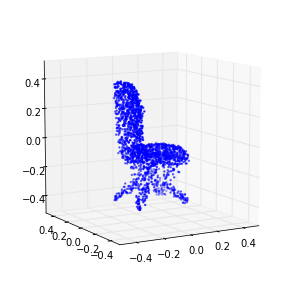

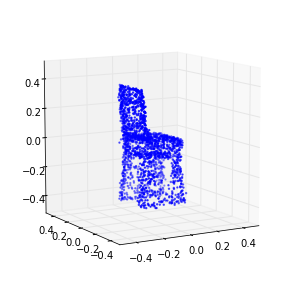

31 (-0.59350755258842747, 0.030324903506509685)
32 (-0.5899272353560836, 0.029134549493728963)
33 (-0.58707891481894037, 0.023990621052992839)
34 (-0.58262541029188364, 0.022001658333465457)
35 (-0.57895795945768003, 0.01569028389295218)
36 (-0.57477918995751276, -0.010207945765513513)
37 (-0.56894172827402756, -0.004415403137466422)
38 (-0.56306449130729397, -0.025689461578925449)
39 (-0.5576635590306035, -0.030845082459833334)
40 (-0.55108279740368882, -0.039322710906465851)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-40 is not in all_model_checkpoint_paths. Manually adding it.


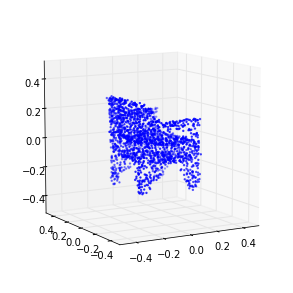

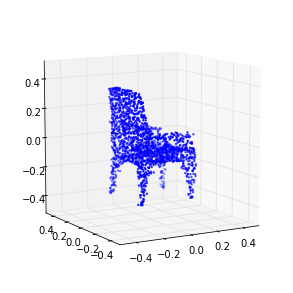

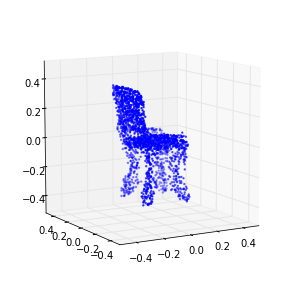

41 (-0.54429787706445765, -0.04943109883202447)
42 (-0.53294770982530382, -0.056049056282197987)
43 (-0.52598486697232283, -0.062118322829957363)
44 (-0.516184597324442, -0.078009052960960959)
45 (-0.50773321478455158, -0.08033400498054645)
46 (-0.49798030720816716, -0.068932447444509576)
47 (-0.4905696917463232, -0.10602330361251477)
48 (-0.48128305099628588, -0.091501263142735864)
49 (-0.47353889677259658, -0.11436730926787411)
50 (-0.46623317731751335, -0.11014015862235317)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-50 is not in all_model_checkpoint_paths. Manually adding it.


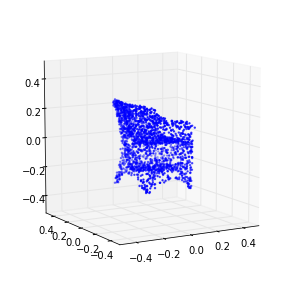

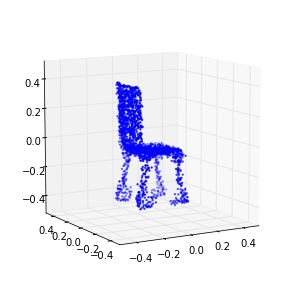

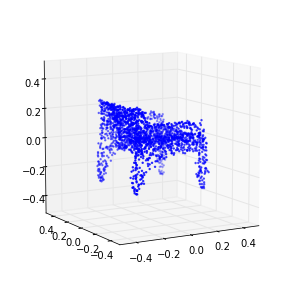

51 (-0.45997731266198333, -0.11945667476565749)
52 (-0.45492363550044873, -0.12840351103632539)
53 (-0.4494233915099391, -0.13532163368331063)
54 (-0.44502974726535655, -0.14777965760893291)
55 (-0.44156032866901823, -0.14223349949827901)
56 (-0.43850293976289256, -0.1696185960813805)
57 (-0.43456458449363711, -0.16830326009679725)
58 (-0.43192461486215944, -0.17985408559993463)
59 (-0.42742597858111064, -0.19080209621676691)
60 (-0.42259416624351787, -0.1986129140412366)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-60 is not in all_model_checkpoint_paths. Manually adding it.


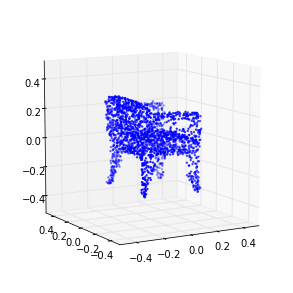

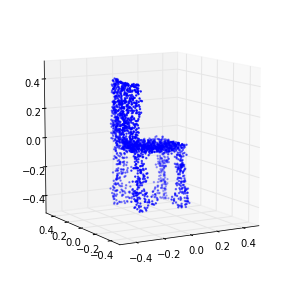

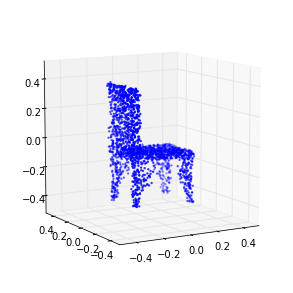

61 (-0.41880513562096489, -0.20976690340925147)
62 (-0.41108076020523354, -0.21717671111777978)
63 (-0.40528544916046988, -0.22003957960340711)
64 (-0.39874874000196103, -0.22861255760546084)
65 (-0.39184154779822739, -0.24474742677476671)
66 (-0.38233662909931609, -0.25022840389498957)
67 (-0.37687373227543303, -0.25424861576822066)
68 (-0.36884230419441505, -0.26510422373259507)
69 (-0.3617716528751232, -0.27613111888920822)
70 (-0.35433374886159541, -0.28699939228870253)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-70 is not in all_model_checkpoint_paths. Manually adding it.


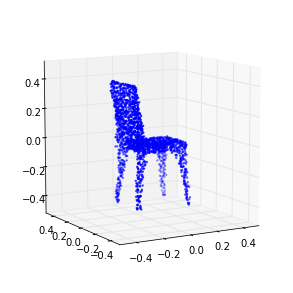

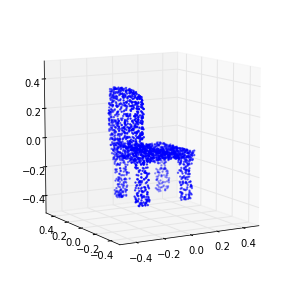

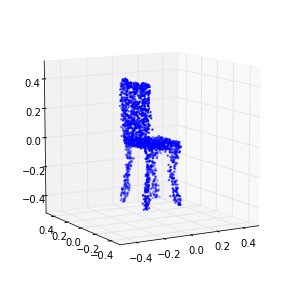

71 (-0.34844623252197549, -0.28382957092037908)
72 (-0.34156639024063395, -0.29815562234984505)
73 (-0.33522721065415279, -0.29761222887922217)
74 (-0.32822255668816741, -0.31449272124855604)
75 (-0.32150629780910633, -0.31986920149238024)
76 (-0.31647604527296841, -0.31415573204005204)
77 (-0.31029720350548073, -0.33513780986821212)
78 (-0.30450876178564851, -0.33619957168896991)
79 (-0.2990039770249967, -0.33782174521022373)
80 (-0.29380358612095869, -0.35628546829576846)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-80 is not in all_model_checkpoint_paths. Manually adding it.


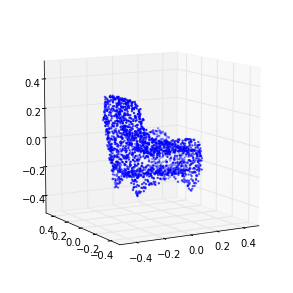

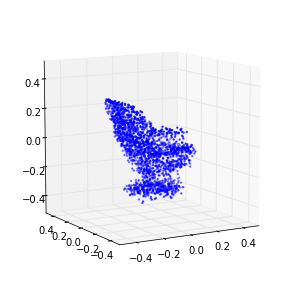

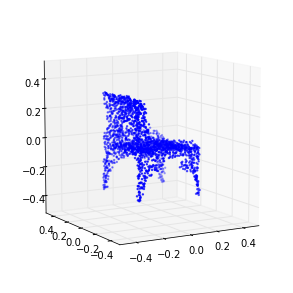

81 (-0.28824041375407466, -0.34899180686032333)
82 (-0.28148278958267636, -0.35513180715066417)
83 (-0.27681595031861905, -0.35855646265877616)
84 (-0.27305053593935791, -0.35801834309542618)
85 (-0.26790510162159248, -0.38394043622193513)
86 (-0.26129728301807686, -0.37032247693450365)
87 (-0.25713153492521357, -0.3804503215683831)
88 (-0.25194653239515091, -0.39089774312796416)
89 (-0.24820975462595621, -0.39456993782961808)
90 (-0.2414830066539623, -0.39681839059900353)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-90 is not in all_model_checkpoint_paths. Manually adding it.


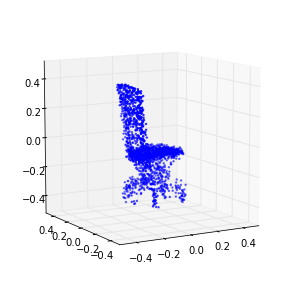

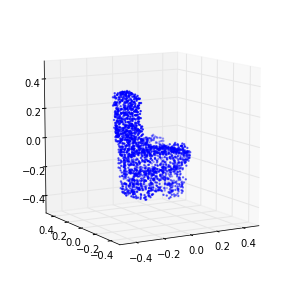

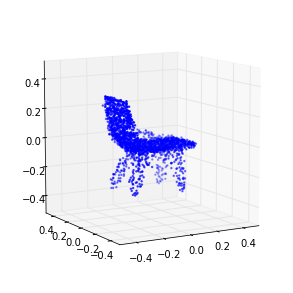

91 (-0.23677133321762084, -0.40035942196846008)
92 (-0.23279253520347454, -0.4102997459747173)
93 (-0.22872919307814704, -0.41177503378302965)
94 (-0.22308027380042605, -0.41233578324317932)
95 (-0.21711287498474122, -0.42858432619659986)
96 (-0.21392899100427273, -0.43313304693610583)
97 (-0.20951700618973484, -0.43395896311159488)
98 (-0.20626628796259563, -0.43556190088943197)
99 (-0.20035267880669347, -0.43988299480190984)
100 (-0.19793269038200378, -0.44110458978900202)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-100 is not in all_model_checkpoint_paths. Manually adding it.


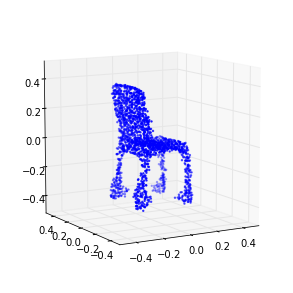

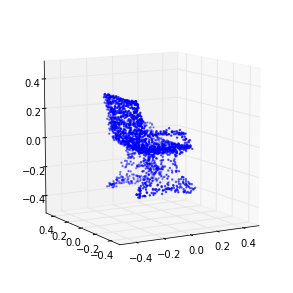

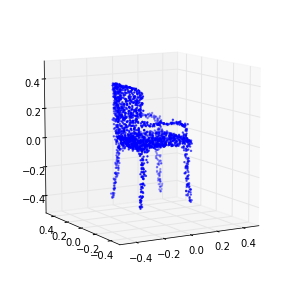

101 (-0.1929851558473375, -0.44979150427712333)
102 (-0.1892151164787787, -0.44747519493103027)
103 (-0.18482732706599767, -0.44670967923270333)
104 (-0.18115256285225903, -0.46097240183088517)
105 (-0.17936284829069066, -0.44785734128068994)
106 (-0.17493896583716076, -0.46401015917460126)
107 (-0.17204769662132971, -0.45986544865149037)
108 (-0.16958525213930342, -0.46560814314418369)
109 (-0.16824237406253814, -0.45752391550276017)
110 (-0.16443017511456101, -0.46670980365188036)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-110 is not in all_model_checkpoint_paths. Manually adding it.


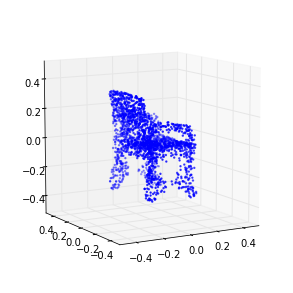

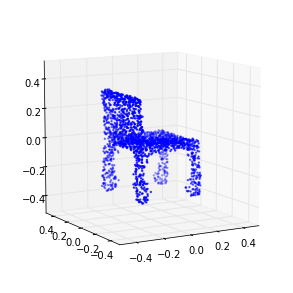

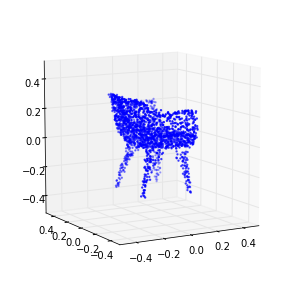

111 (-0.15951941774951087, -0.45350616949575917)
112 (-0.15891509045053412, -0.4637631387622268)
113 (-0.15500121094562389, -0.45938702313988294)
114 (-0.15355223378649466, -0.45765584265744247)
115 (-0.1522501187743964, -0.46555090723214326)
116 (-0.14907051937447655, -0.45827271651338647)
117 (-0.14873116579320694, -0.4508014365478798)
118 (-0.14667800824951244, -0.45037520925203961)
119 (-0.14226514156217929, -0.45346470121984128)
120 (-0.14204632584695462, -0.44185681254775439)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-120 is not in all_model_checkpoint_paths. Manually adding it.


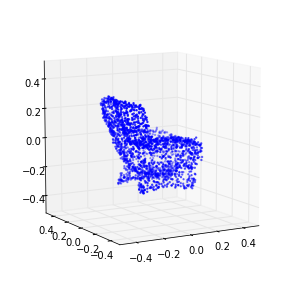

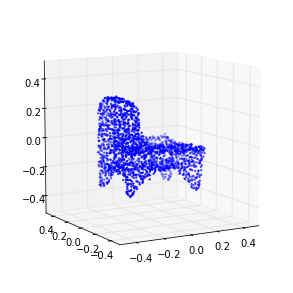

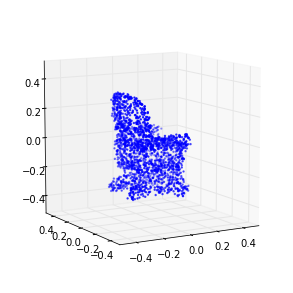

121 (-0.13995527718906051, -0.44297015225445785)
122 (-0.13791976311692486, -0.43949898635899581)
123 (-0.13795013996186078, -0.42135516360954001)
124 (-0.13799001867020572, -0.43367299216764943)
125 (-0.13520836145789536, -0.42991888191964889)
126 (-0.13431176217617813, -0.4183932873937819)
127 (-0.1334640974799792, -0.41370134883456761)
128 (-0.1326076188021236, -0.40283428518860426)
129 (-0.13162045042823861, -0.39178032234862997)
130 (-0.13223762854381843, -0.39084823484773989)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-130 is not in all_model_checkpoint_paths. Manually adding it.


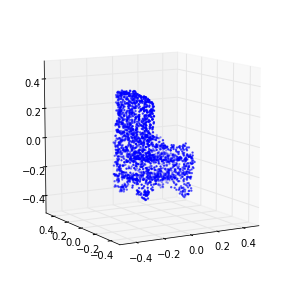

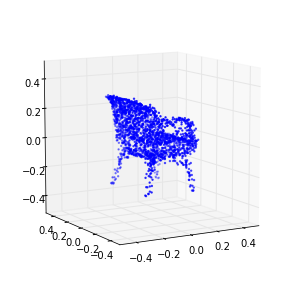

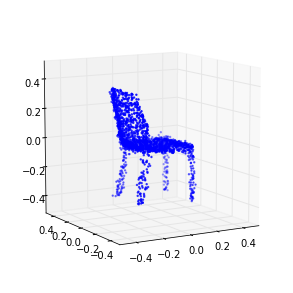

131 (-0.1310636239471259, -0.39288200382833127)
132 (-0.13078253837647261, -0.39085637419312086)
133 (-0.13040668119986851, -0.37068744058962222)
134 (-0.13227787945005628, -0.38120695948600769)
135 (-0.13093779357495131, -0.35679082296512743)
136 (-0.13020705818026154, -0.35483129708855238)
137 (-0.13188356321167063, -0.35073658272072122)
138 (-0.13247180702509703, -0.34608464991604843)
139 (-0.13245615131325192, -0.31812973596431593)
140 (-0.13438884582784441, -0.3282035191853841)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-140 is not in all_model_checkpoint_paths. Manually adding it.


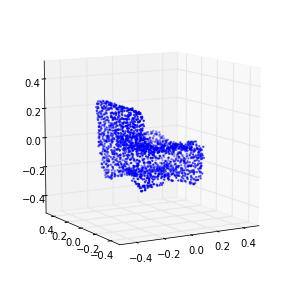

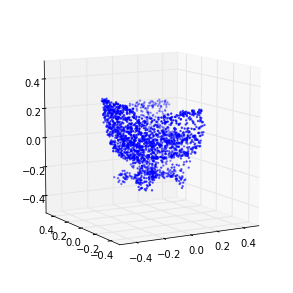

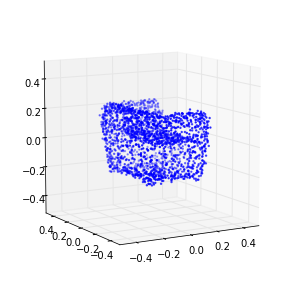

141 (-0.13364521176726729, -0.30310055282380843)
142 (-0.13366068413964025, -0.29750134547551471)
143 (-0.13521005307082776, -0.28370303412278491)
144 (-0.13570846230895431, -0.29793504156448225)
145 (-0.13523380243115954, -0.26673821166709616)
146 (-0.13935984919468561, -0.26461240814791787)
147 (-0.13924499987452119, -0.25996222816131731)
148 (-0.14004329161511528, -0.25385954203429045)
149 (-0.13938322453587143, -0.24632812650115402)
150 (-0.14327731182177861, -0.24955897088404055)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-150 is not in all_model_checkpoint_paths. Manually adding it.


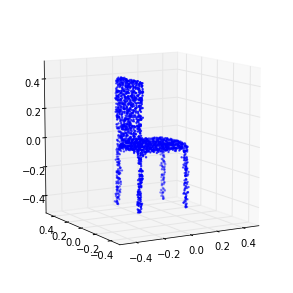

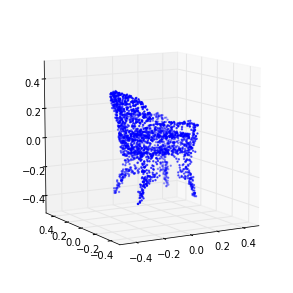

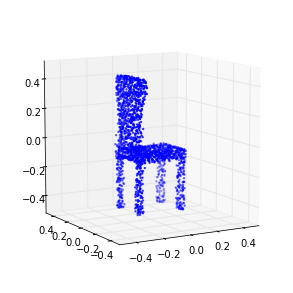

151 (-0.14194402457387359, -0.22911482331929384)
152 (-0.1406379450250555, -0.23124099715992255)
153 (-0.14248692862413548, -0.23183124484839263)
154 (-0.1433396229589427, -0.22986162371105617)
155 (-0.14190394332011541, -0.2196794698635737)
156 (-0.14381517436769273, -0.21883387808446531)
157 (-0.14404947597671439, -0.21056637554257004)
158 (-0.14477457967069413, -0.2142824955560543)
159 (-0.14607169136956885, -0.210032954260155)
160 (-0.14519770515185815, -0.21580483460867847)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-160 is not in all_model_checkpoint_paths. Manually adding it.


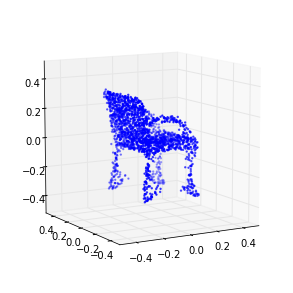

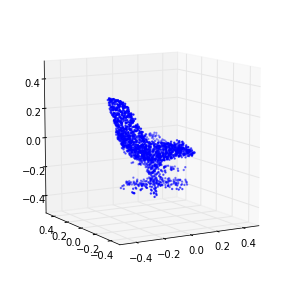

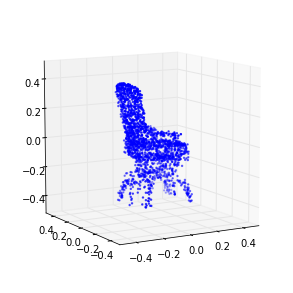

161 (-0.14759074013542245, -0.20264479793884135)
162 (-0.1478567173635518, -0.21338664878297736)
163 (-0.14771008370099245, -0.20099295234238659)
164 (-0.15063002192311817, -0.20141589255244643)
165 (-0.14901281302725827, -0.19079673952526516)
166 (-0.14958457389363536, -0.18756293919351366)
167 (-0.1485780127622463, -0.19068355803136472)
168 (-0.14972846303825024, -0.19177125780670731)
169 (-0.15133428165206203, -0.18092046291739852)
170 (-0.15101448231273226, -0.18403829965326521)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-170 is not in all_model_checkpoint_paths. Manually adding it.


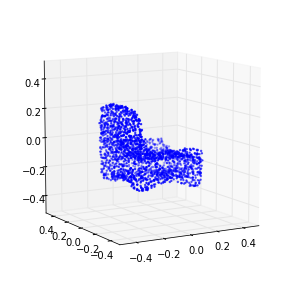

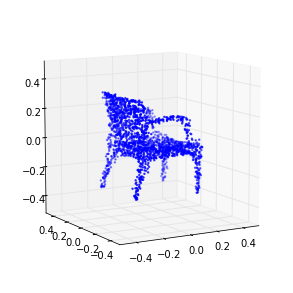

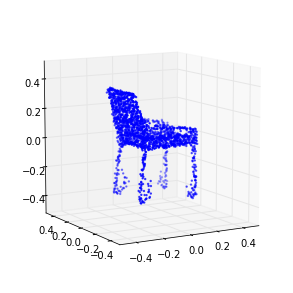

171 (-0.15045627747420912, -0.17970557897179215)
172 (-0.15177930946703311, -0.18496678272883096)
173 (-0.149822819950404, -0.18998962861520272)
174 (-0.15150348836625063, -0.18486930926640829)
175 (-0.15145558852840352, -0.17673469528003974)
176 (-0.15330361596964023, -0.17303918633196089)
177 (-0.15159672680828307, -0.17841082204271247)
178 (-0.1507845225709456, -0.16221789960507993)
179 (-0.15279118380060902, -0.17232948486451749)
180 (-0.15440150135093264, -0.17070145573880938)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-180 is not in all_model_checkpoint_paths. Manually adding it.


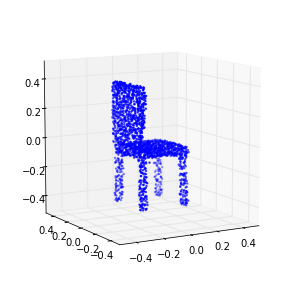

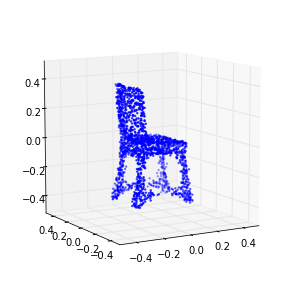

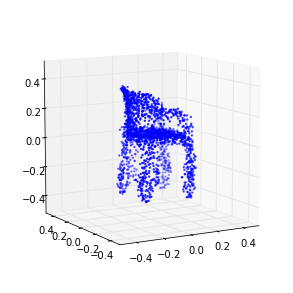

181 (-0.1553402265464818, -0.16461434877581066)
182 (-0.15606501610190779, -0.16151334124582786)
183 (-0.15471828270841528, -0.1588145124691504)
184 (-0.1565091699913696, -0.15069522874222863)
185 (-0.15778511365254719, -0.1484391509934708)
186 (-0.15664728162465272, -0.16041950191612597)
187 (-0.15750624940351204, -0.15044711557803331)
188 (-0.15800063775645362, -0.14575854937235513)
189 (-0.157108773291111, -0.14824749612145954)
190 (-0.15589638964997399, -0.13659344503173121)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-190 is not in all_model_checkpoint_paths. Manually adding it.


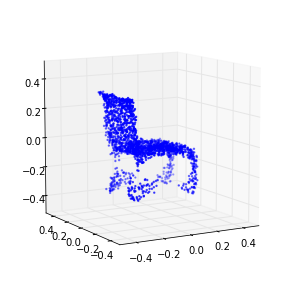

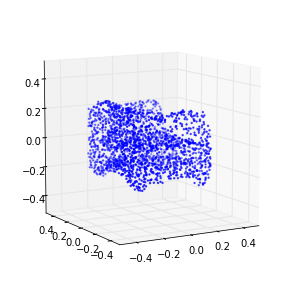

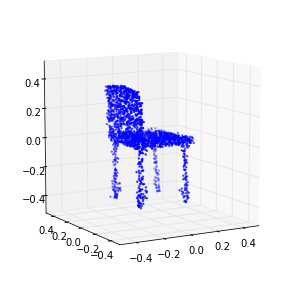

191 (-0.15854261098084627, -0.14286195569568211)
192 (-0.15920929450679708, -0.14485246881290717)
193 (-0.16011859868411665, -0.15068087423289264)
194 (-0.16073554285146571, -0.12812113458359684)
195 (-0.15929252952337264, -0.1294966690518238)
196 (-0.15899746738098286, -0.1299843454250583)
197 (-0.16043881906403434, -0.13814145961293467)
198 (-0.16189116178839294, -0.13624392339476832)
199 (-0.15827804527900838, -0.12457121246390873)
200 (-0.1611345671945148, -0.13038972682423061)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-200 is not in all_model_checkpoint_paths. Manually adding it.


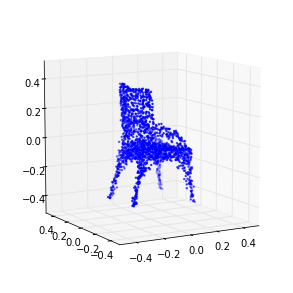

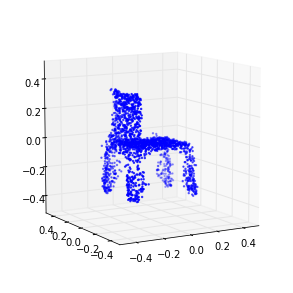

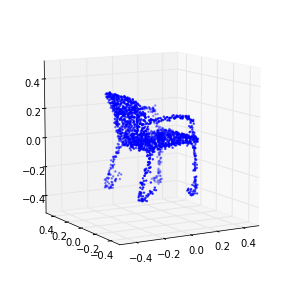

201 (-0.1615766351973569, -0.13079888097665929)
202 (-0.15897499990684014, -0.12018269907545161)
203 (-0.16029647003721309, -0.12454074759174276)
204 (-0.16042366629397428, -0.11074567006693946)
205 (-0.16172494777926691, -0.12112700332094122)
206 (-0.15892393699398746, -0.1287769145435757)
207 (-0.16182473715808657, -0.11227234687518191)
208 (-0.15802904880709118, -0.12218251217294622)
209 (-0.16095153628676026, -0.11705144798314129)
210 (-0.16064659086642441, -0.11604093677467769)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-210 is not in all_model_checkpoint_paths. Manually adding it.


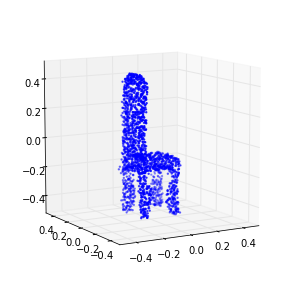

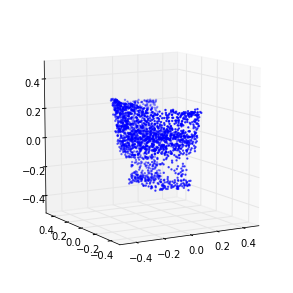

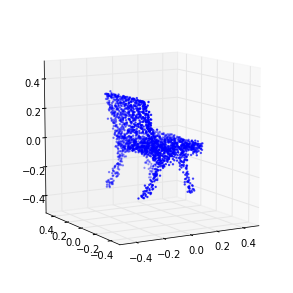

211 (-0.15873687510137205, -0.11973386506239574)
212 (-0.15985630149090732, -0.10175653146924796)
213 (-0.15866313118625569, -0.11328872238044385)
214 (-0.16014071272479163, -0.11344655354817708)
215 (-0.1607016706356296, -0.10432021071513493)
216 (-0.15914088956735753, -0.11279294695015307)
217 (-0.16005413085222245, -0.11188410526072537)
218 (-0.16081611072575605, -0.1069849459109483)
219 (-0.16340315226051544, -0.10017090042432149)
220 (-0.16176754274853952, -0.10058506219475358)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-220 is not in all_model_checkpoint_paths. Manually adding it.


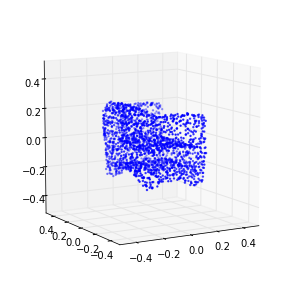

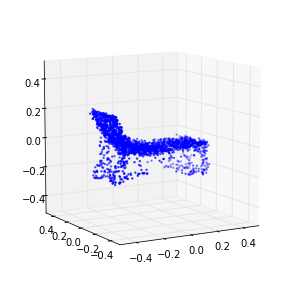

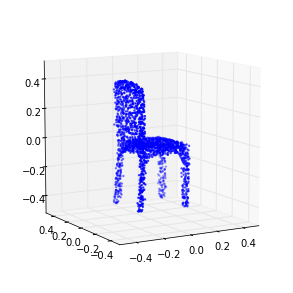

221 (-0.16163488935541223, -0.10740548648216107)
222 (-0.16077885042738033, -0.10465041685987402)
223 (-0.16207016325659221, -0.098384376615285873)
224 (-0.16248079792216971, -0.095267186010325397)
225 (-0.16267888203815178, -0.10026356936604888)
226 (-0.16158937651801991, -0.092588908004539991)
227 (-0.16328898894566077, -0.094126526128362725)
228 (-0.16383410311407512, -0.082453844861851797)
229 (-0.16007076104482015, -0.10308419719890312)
230 (-0.16274422335403937, -0.091873715045275514)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-230 is not in all_model_checkpoint_paths. Manually adding it.


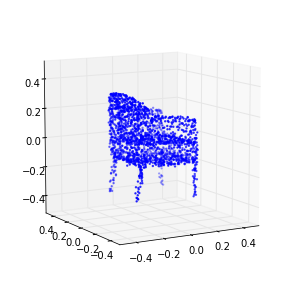

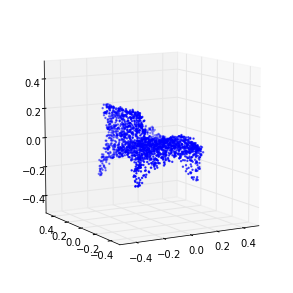

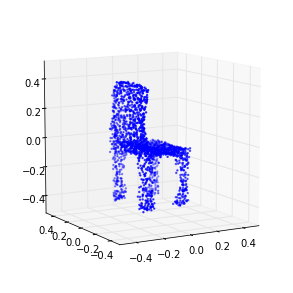

231 (-0.16282986054817836, -0.096510919707792783)
232 (-0.16381271365616057, -0.090255062199301184)
233 (-0.1633696860185376, -0.085937091045909464)
234 (-0.16240236516352052, -0.076878662048666571)
235 (-0.16205130936922851, -0.082566594911946192)
236 (-0.16447785695393879, -0.082921720489307682)
237 (-0.16469742081783437, -0.086684065422526116)
238 (-0.1627783829967181, -0.07217425094158561)
239 (-0.16594877011246151, -0.08610187332939219)
240 (-0.16204068704887672, -0.07472398904738603)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-240 is not in all_model_checkpoint_paths. Manually adding it.


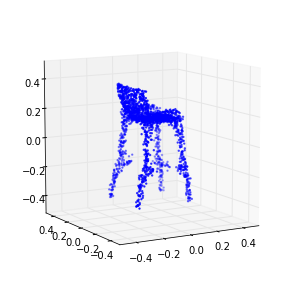

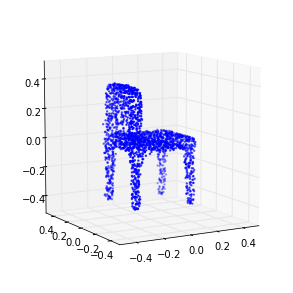

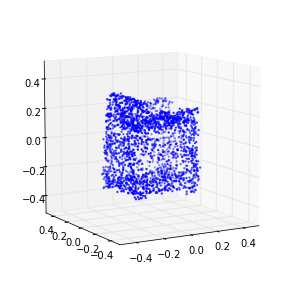

241 (-0.16811792420016394, -0.078891216328850503)
242 (-0.16569288395069265, -0.075837656510648901)
243 (-0.16395417760919642, -0.075342782945544626)
244 (-0.16330452489632147, -0.073323551565408707)
245 (-0.1648261884296382, -0.065086399446483006)
246 (-0.16436807143467444, -0.076800259589045142)
247 (-0.16440628364130302, -0.074917583450399061)
248 (-0.16538625409205754, -0.070498731815152704)
249 (-0.16568459984329012, -0.068499199080246473)
250 (-0.1645599827170372, -0.067035787911326791)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-250 is not in all_model_checkpoint_paths. Manually adding it.


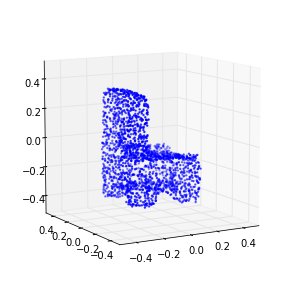

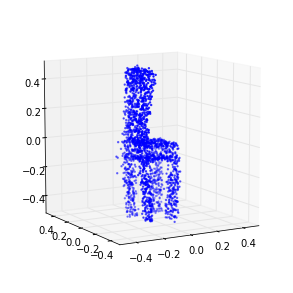

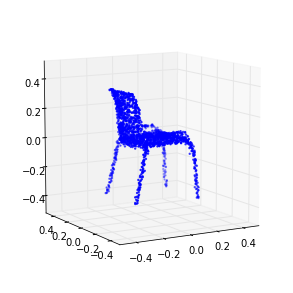

251 (-0.16445217894183264, -0.069000566102288385)
252 (-0.167412699703817, -0.073514895444666897)
253 (-0.16638519835692864, -0.071394207714884375)
254 (-0.16565960060667109, -0.0788127403292391)
255 (-0.1668511856485296, -0.066252071824338704)
256 (-0.16791234148873224, -0.067687836096242626)
257 (-0.16658622876361565, -0.061010732953609141)
258 (-0.16494254916906356, -0.064162276478277311)
259 (-0.16650794567885221, -0.069284378447466433)
260 (-0.16779375396392965, -0.057338198750383325)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-260 is not in all_model_checkpoint_paths. Manually adding it.


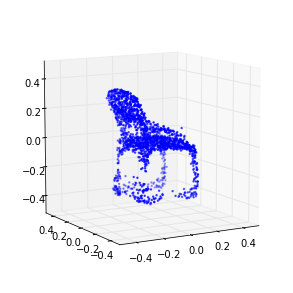

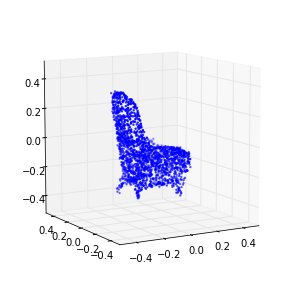

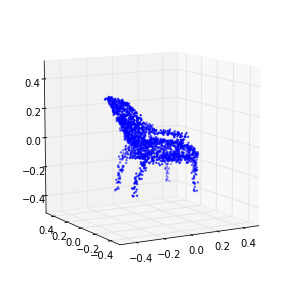

261 (-0.16594503726120349, -0.062820482447191517)
262 (-0.16659282760487662, -0.064115075118563791)
263 (-0.16691139886776607, -0.061416453992327057)
264 (-0.16553514986126511, -0.062889384588709588)
265 (-0.1654036776335151, -0.055048304713434644)
266 (-0.16680871038525194, -0.055460561584267348)
267 (-0.16881246986212553, -0.049929156830465352)
268 (-0.16694053383889021, -0.052462923237019114)
269 (-0.16805646402968299, -0.058138042446915748)
270 (-0.16792309576714481, -0.045560243918939876)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-270 is not in all_model_checkpoint_paths. Manually adding it.


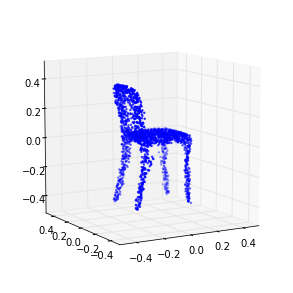

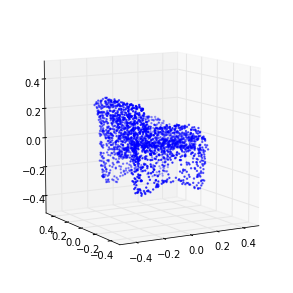

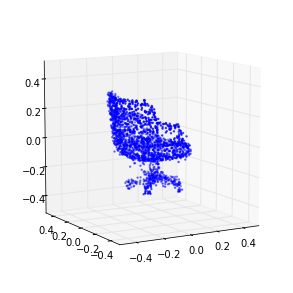

271 (-0.16794231776837951, -0.05493369733017904)
272 (-0.16573969467922492, -0.057384311945901975)
273 (-0.16588444891903137, -0.059372247714135379)
274 (-0.16772556133844235, -0.053161568905192393)
275 (-0.16709894416508853, -0.049296049332177197)
276 (-0.1668332521562223, -0.045914315825535193)
277 (-0.17009272503632086, -0.059538537567412411)
278 (-0.16742911990042086, -0.052667654705820258)
279 (-0.16620917513414665, -0.047625928220373613)
280 (-0.16814146825560816, -0.044137663483895639)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-280 is not in all_model_checkpoint_paths. Manually adding it.


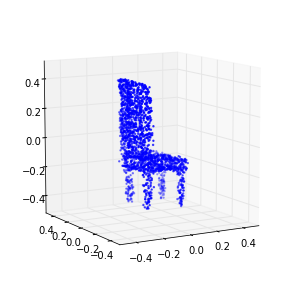

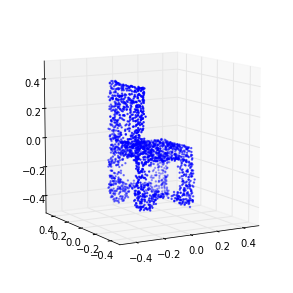

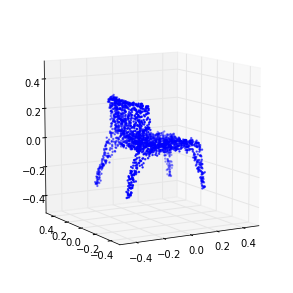

281 (-0.16648742666950933, -0.050727804363877686)
282 (-0.16918673388384006, -0.05303770421003854)
283 (-0.16780989650222991, -0.041081602271232337)
284 (-0.16522949249656113, -0.039205867797136307)
285 (-0.16545698074279008, -0.060313952051930957)
286 (-0.16797356500669761, -0.04321850763840808)
287 (-0.16790969857463131, -0.055303350918822818)
288 (-0.16754221861009244, -0.05206354079699075)
289 (-0.1684987852970759, -0.039217806378103515)
290 (-0.16900093632715721, -0.04801577191661905)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-290 is not in all_model_checkpoint_paths. Manually adding it.


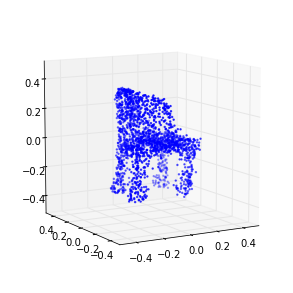

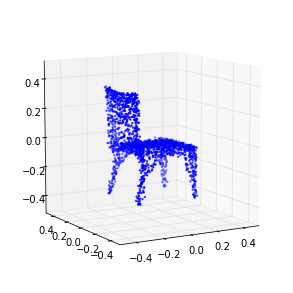

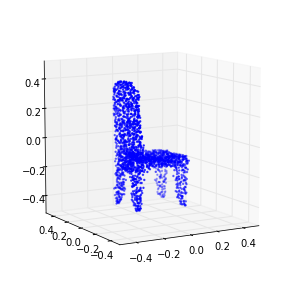

291 (-0.16769688427448273, -0.052442330936038936)
292 (-0.16682719753848183, -0.055411061323765248)
293 (-0.16724899565732038, -0.05444457409558473)
294 (-0.17016515505534632, -0.050091661650825431)
295 (-0.16731431037187577, -0.043197499243197615)
296 (-0.1681196004152298, -0.050189635061003546)
297 (-0.1671406873398357, -0.048111377628865068)
298 (-0.16925023705871017, -0.047212721503995081)
299 (-0.16844704940363212, -0.04506505339371937)
300 (-0.16911346928940879, -0.050117685701008198)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-300 is not in all_model_checkpoint_paths. Manually adding it.


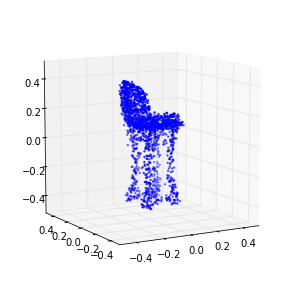

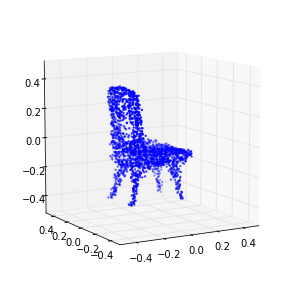

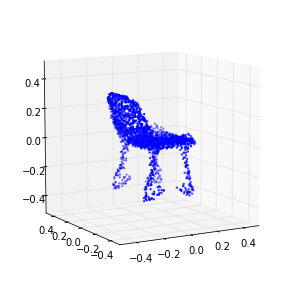

301 (-0.16903563964146154, -0.052867970532841153)
302 (-0.17081492874357435, -0.048411025148299008)
303 (-0.16790805061658223, -0.0417523713161548)
304 (-0.16948222286171383, -0.049952801454950263)
305 (-0.16804770694838631, -0.042320142845036809)
306 (-0.17097895918069062, -0.050533526059654027)
307 (-0.17056816794254162, -0.037622479652916943)
308 (-0.16950724814777021, -0.040679135290836846)
309 (-0.17017845290678518, -0.052362983494445133)
310 (-0.167728520543487, -0.042114609136694563)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-310 is not in all_model_checkpoint_paths. Manually adding it.


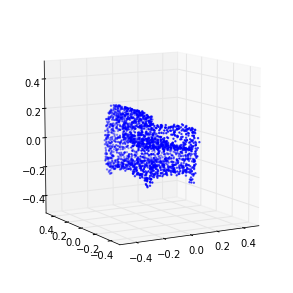

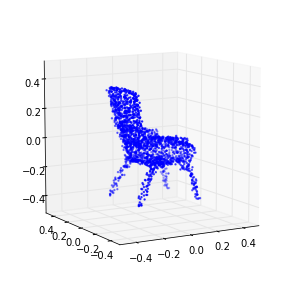

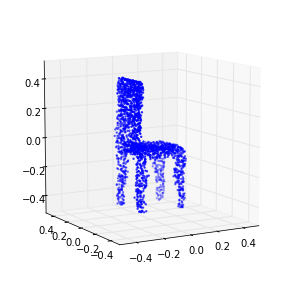

311 (-0.17128967035699774, -0.045082013260711123)
312 (-0.17021391513171019, -0.039961679303949629)
313 (-0.16881505151589712, -0.041241749948649493)
314 (-0.17161941440017134, -0.043961019979582891)
315 (-0.16764549469506299, -0.034762394028129404)
316 (-0.17116328913856435, -0.040257088719280784)
317 (-0.16955452892515394, -0.040154182248645358)
318 (-0.16785898258288701, -0.034224275637556006)
319 (-0.16966353257497152, -0.0383180621838956)
320 (-0.16987571688713851, -0.026220831433656038)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-320 is not in all_model_checkpoint_paths. Manually adding it.


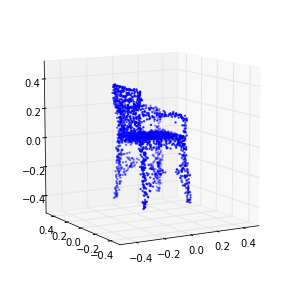

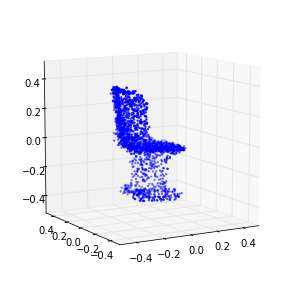

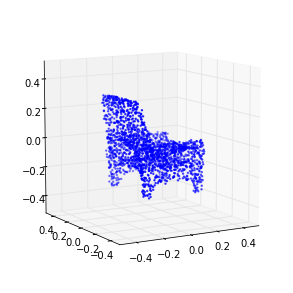

321 (-0.1709623940564968, -0.029261650707296753)
322 (-0.167749307277026, -0.029666947200894356)
323 (-0.17022443071559623, -0.035177818965166807)
324 (-0.17151490637549646, -0.033400738680804218)
325 (-0.17121947518101446, -0.029502339005746222)
326 (-0.16926543988563397, -0.02966560371634033)
327 (-0.17099277724822362, -0.02163503967501499)
328 (-0.17140657559589104, -0.019370541028264496)
329 (-0.17032378062053963, -0.026841467556854088)
330 (-0.16833409865697224, -0.028863574895593856)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-330 is not in all_model_checkpoint_paths. Manually adding it.


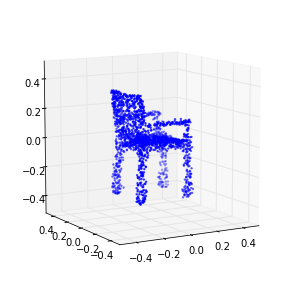

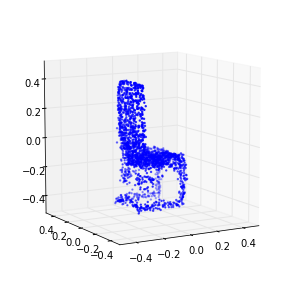

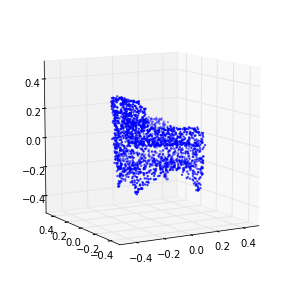

331 (-0.16977246745868965, -0.022513975376366742)
332 (-0.17045826084083981, -0.022744846469895157)
333 (-0.16966817671502077, -0.026365722270889416)
334 (-0.1701379070127452, -0.021530603886478476)
335 (-0.17014014770587285, -0.026656933042600198)
336 (-0.17085605749377497, -0.023774761120202364)
337 (-0.17027884627933856, -0.024956613192679705)
338 (-0.16992512472249843, -0.016630335271151528)
339 (-0.16881559480119634, -0.018929928748144045)
340 (-0.17028611020909415, -0.017509816645610111)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-340 is not in all_model_checkpoint_paths. Manually adding it.


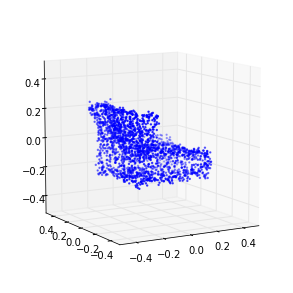

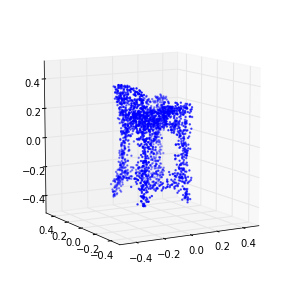

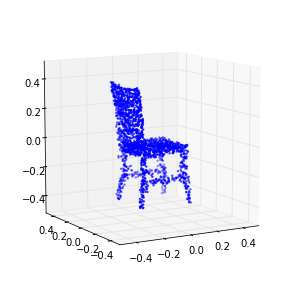

341 (-0.16962572181666338, -0.016697615014251183)
342 (-0.16994347743414068, -0.019102123229660921)
343 (-0.16944173397841278, -0.017568588593146868)
344 (-0.1695689348159013, -0.024882258528291627)
345 (-0.1702292963862419, -0.01868855046039378)
346 (-0.17212673933417708, -0.015588431049966149)
347 (-0.17028792086574768, -0.01568256020201025)
348 (-0.16816625992457071, -0.0080004538133464486)
349 (-0.1696542070971595, -0.014540946180069889)
350 (-0.1698192008667522, -0.0075837583970968367)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-350 is not in all_model_checkpoint_paths. Manually adding it.


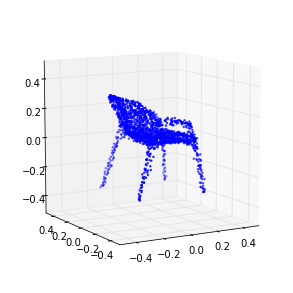

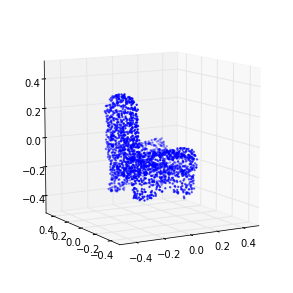

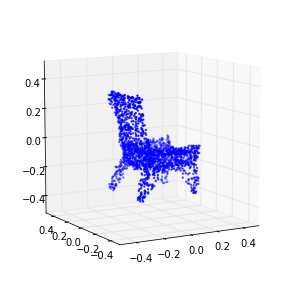

351 (-0.17044704324669308, -0.0020558780869813979)
352 (-0.16932619225095819, -0.0059695363096478916)
353 (-0.17019163419802982, -0.0075372869355811011)
354 (-0.16993843239766579, -0.0081788575431952868)
355 (-0.17066831798465162, -0.011648453340900165)
356 (-0.17241277992725373, -0.017513838596642017)
357 (-0.16918912596172755, -0.0087296146968448597)
358 (-0.17204343069482733, -0.011119290893138558)
359 (-0.16973312309494726, -0.011833781238507342)
360 (-0.16908982572732148, -0.00950361107027641)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-360 is not in all_model_checkpoint_paths. Manually adding it.


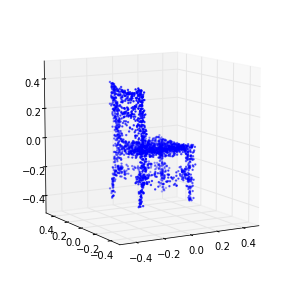

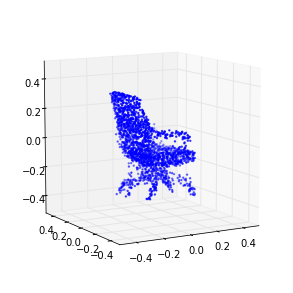

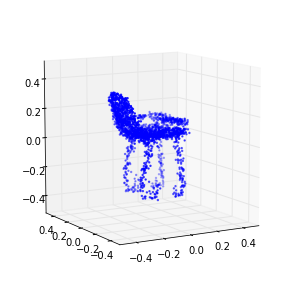

361 (-0.17153061219939478, -0.014614537280673781)
362 (-0.17122657779190276, -0.0078191877584214559)
363 (-0.17228292221272434, -0.014807697178588973)
364 (-0.17056012655849809, -0.0067002548215289908)
365 (-0.17143550658667528, -0.0087464678497916025)
366 (-0.16911320024066501, -0.0056590907689597868)
367 (-0.17167307403352525, -0.010425278675500993)
368 (-0.17245490738639124, -0.0022771945050745097)
369 (-0.17098778993995101, -0.0073482964222353914)
370 (-0.17148388110929066, -0.0076031376073067937)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-370 is not in all_model_checkpoint_paths. Manually adding it.


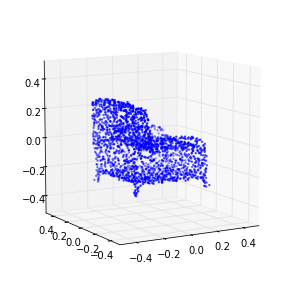

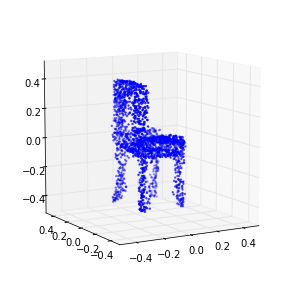

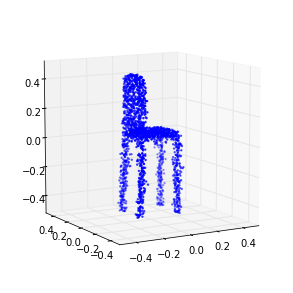

371 (-0.17271198729674023, -0.0058417665961853884)
372 (-0.17092446596534164, -0.013410785157854358)
373 (-0.17128005805942748, -0.01192889956291765)
374 (-0.16825418593706909, -0.0015951273272986764)
375 (-0.17052136041499949, -0.012396714822561652)
376 (-0.17271987216340171, -0.0048389712917721933)
377 (-0.17169909256475943, -0.0055754973932548805)
378 (-0.17238530229639124, -0.0060824117519789273)
379 (-0.17193842226708378, 0.007776364632364776)
380 (-0.17129612267017363, 0.0024536349207024883)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-380 is not in all_model_checkpoint_paths. Manually adding it.


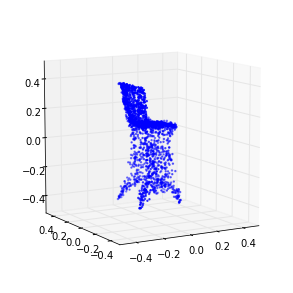

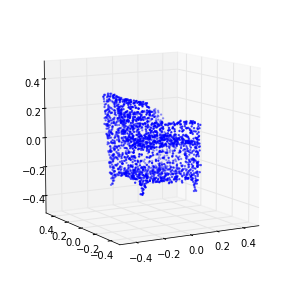

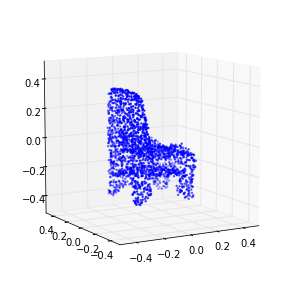

381 (-0.17129868964354197, -0.004689417484095665)
382 (-0.17200074041331256, -0.0045887100320585348)
383 (-0.17154435272570009, 0.0055948404457282141)
384 (-0.17137626453682228, 0.0046792148345115563)
385 (-0.1722067927872693, 0.0021720349193654126)
386 (-0.17151900430520375, -0.0010697711604060951)
387 (-0.16996929005340294, -0.0033761092496139033)
388 (-0.17113740974002414, -0.0028896941285994318)
389 (-0.17150725755426618, 0.0021035602592207768)
390 (-0.17130353831582598, -0.0020827007204018257)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-390 is not in all_model_checkpoint_paths. Manually adding it.


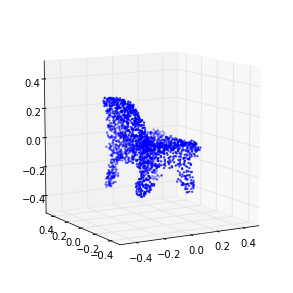

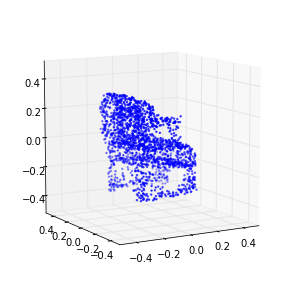

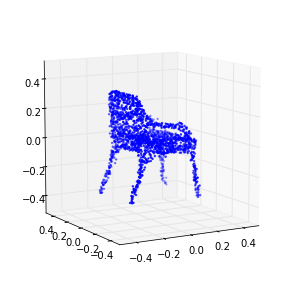

391 (-0.17062421529381364, -0.0073556616100379163)
392 (-0.17172944369139495, -0.0038029214505244185)
393 (-0.17127496544961576, -0.0064930428871540005)
394 (-0.17193139923943412, -0.0058422841183427311)
395 (-0.17119064386244173, 0.0014482101046100811)
396 (-0.1723883761851876, -0.0093689192759080064)
397 (-0.17028276484321664, 0.011720833868754131)
398 (-0.17269103714713344, 0.009178055527930459)
399 (-0.17077096386088264, -0.0035420742265328212)
400 (-0.17151887234714297, 0.0067622195239420294)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-400 is not in all_model_checkpoint_paths. Manually adding it.


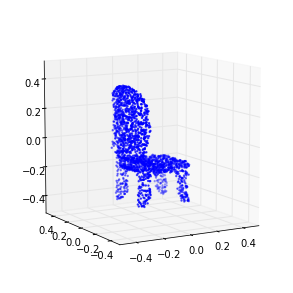

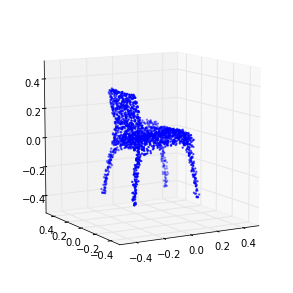

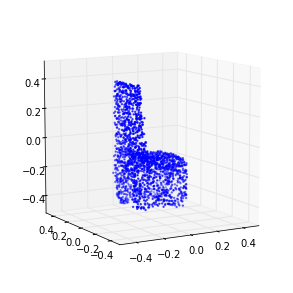

401 (-0.17034449919506356, 0.015295076235714886)
402 (-0.16930458358040562, 0.0033518032481273017)
403 (-0.1720151428271223, 0.0096876814064604262)
404 (-0.17132667247895841, 0.0040174257096455054)
405 (-0.17158063589422792, 0.0083232116885483265)
406 (-0.17248689449495738, -0.0010655676359655681)
407 (-0.17219713650367879, 0.010356272855359647)
408 (-0.17056629138964194, 0.010611573665368336)
409 (-0.1746245402428839, 0.002433959808614519)
410 (-0.1711079485990383, 0.0069548503530246237)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-410 is not in all_model_checkpoint_paths. Manually adding it.


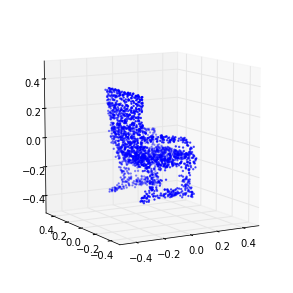

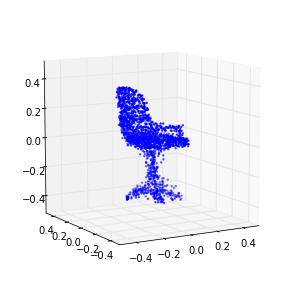

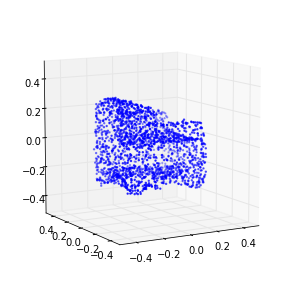

411 (-0.17312502287052295, 0.0059180752788152956)
412 (-0.17229819579256905, 0.0061848390226562815)
413 (-0.17146461997871046, -0.00088627360054050332)
414 (-0.17059779674918563, 0.015010883841939547)
415 (-0.17246294816335042, 0.0076307728239852525)
416 (-0.17274239780726255, 0.0095038844479454886)
417 (-0.17112513052092659, 0.010276031551054783)
418 (-0.17183533636508164, 0.010297605431535177)
419 (-0.17260650666775526, 0.011653699722416975)
420 (-0.17195852084292307, 0.0063940277236893221)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-420 is not in all_model_checkpoint_paths. Manually adding it.


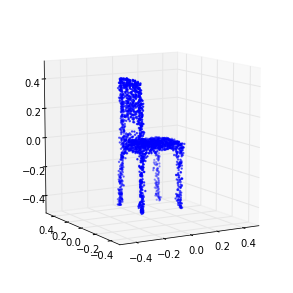

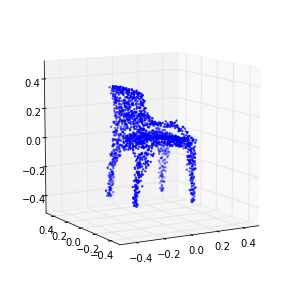

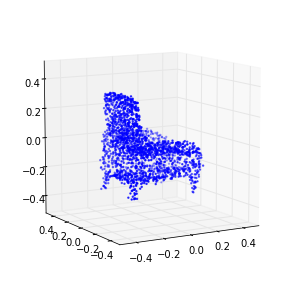

421 (-0.17186188775080222, 0.0096924381149518825)
422 (-0.17107019093301562, 0.0133755496720335)
423 (-0.17233167169270691, 0.013245621678867826)
424 (-0.17249641595063386, 0.016005140703378454)
425 (-0.17168164021439022, 0.0097761643895258512)
426 (-0.17260395674793808, 0.0098810415904693038)
427 (-0.17229494943662926, 0.022219597180891369)
428 (-0.17248164591965853, 0.010958780017164018)
429 (-0.17272757876802375, 0.017979746011810169)
430 (-0.17188894682460362, 0.01491656806319952)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-430 is not in all_model_checkpoint_paths. Manually adding it.


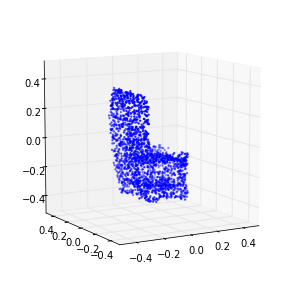

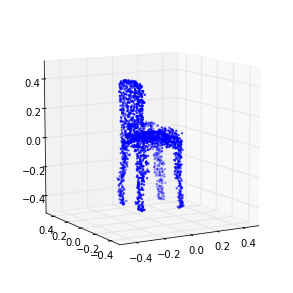

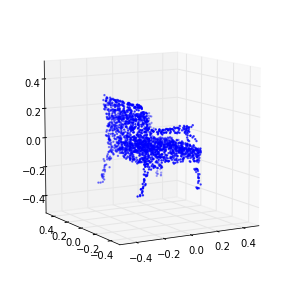

431 (-0.1722056993179851, 0.019128774706688192)
432 (-0.1709944870184969, 0.017070919482244387)
433 (-0.17335340099202262, 0.013917692255711666)
434 (-0.17143663465976716, 0.012357831277229168)
435 (-0.17296366272149263, 0.017285838921519893)
436 (-0.17219986076708194, 0.020350463446919567)
437 (-0.17070007544976692, 0.014598804952887198)
438 (-0.17177128129535252, 0.017637367817331797)
439 (-0.1744082138494209, 0.015449465942327623)
440 (-0.17394697114273353, 0.0088242254978804675)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-440 is not in all_model_checkpoint_paths. Manually adding it.


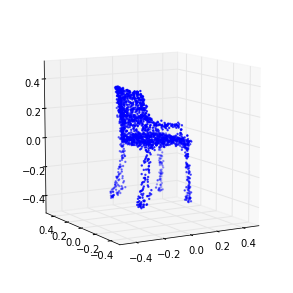

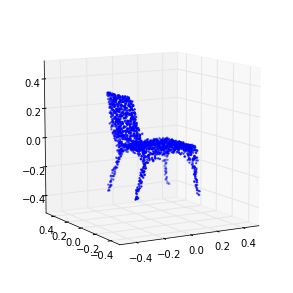

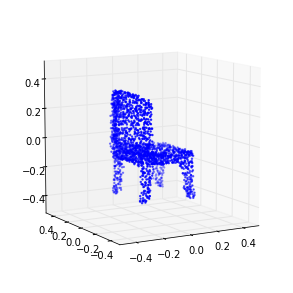

441 (-0.17441680332024892, 0.017367551172221149)
442 (-0.17265085125410998, 0.016994676018064772)
443 (-0.17142116350156289, 0.021505833215390641)
444 (-0.17243676693351181, 0.01306092695126103)
445 (-0.17366443221215849, 0.01722047317566143)
446 (-0.17106342646810743, 0.011310816345805372)
447 (-0.17263320629243498, 0.018901187253908977)
448 (-0.17167382681811297, 0.022463995480427035)
449 (-0.17129439816430764, 0.01432340722789781)
450 (-0.17383000878272234, 0.014088971773162484)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-450 is not in all_model_checkpoint_paths. Manually adding it.


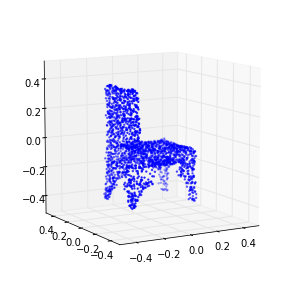

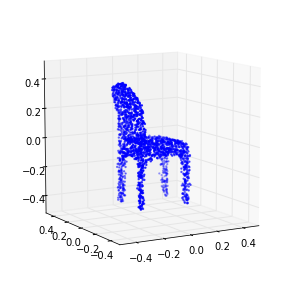

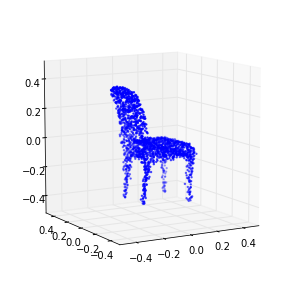

451 (-0.1727409957183732, 0.022415312007069588)
452 (-0.17296318980278791, 0.022711090174400143)
453 (-0.17317821361400462, 0.018090093922283914)
454 (-0.17102491932886618, 0.023949907497606344)
455 (-0.17367381563893072, 0.017527926057853079)
456 (-0.17320918694690421, 0.019249444379022828)
457 (-0.17290262182553609, 0.025056002368391665)
458 (-0.17415718243077949, 0.013074734817362495)
459 (-0.1748041899667846, 0.022515753491057292)
460 (-0.17142322366988216, 0.021277901932114252)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-460 is not in all_model_checkpoint_paths. Manually adding it.


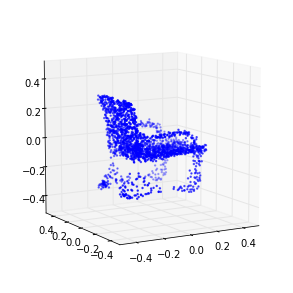

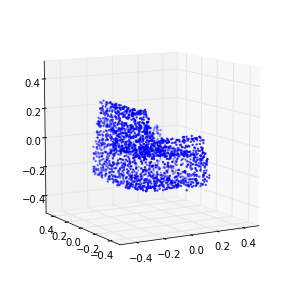

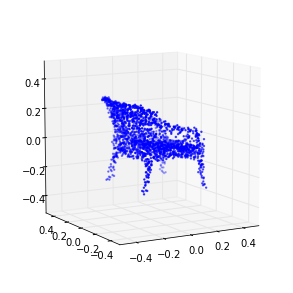

461 (-0.17233601179387834, 0.027642618968254991)
462 (-0.17306171766033879, 0.024739185555113688)
463 (-0.17222744049849334, 0.020443723468040978)
464 (-0.17332670749337584, 0.021370243419099738)
465 (-0.17145839068624708, 0.014743292130771335)
466 (-0.17248347346429471, 0.022595827588466583)
467 (-0.17196327017413246, 0.028426316118350736)
468 (-0.17245370171688221, 0.019990317833920319)
469 (-0.17119274878943408, 0.015598012496613793)
470 (-0.17406517355530352, 0.023894630269043975)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-470 is not in all_model_checkpoint_paths. Manually adding it.


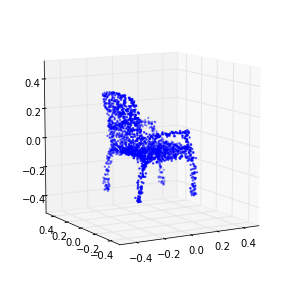

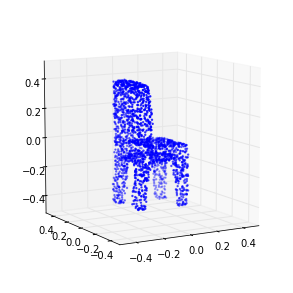

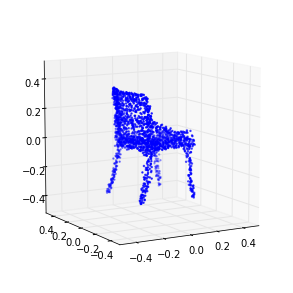

471 (-0.17267093967508387, 0.016623896068065531)
472 (-0.17027553021907807, 0.023131633418853634)
473 (-0.17253419701699857, 0.027025999803165043)
474 (-0.1729276074303521, 0.022519818386407913)
475 (-0.17233140567938487, 0.03304397532095512)
476 (-0.17291522335123133, 0.028975736418807949)
477 (-0.17340271859257309, 0.023655035929685389)
478 (-0.17262297609338054, 0.029629096423310262)
479 (-0.17313945315502308, 0.025372833944857121)
480 (-0.1728411744038264, 0.025176965424584016)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-480 is not in all_model_checkpoint_paths. Manually adding it.


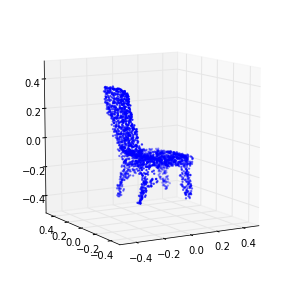

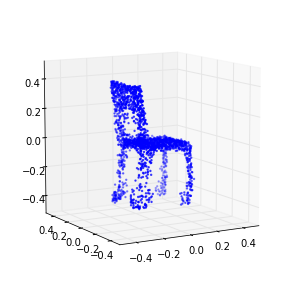

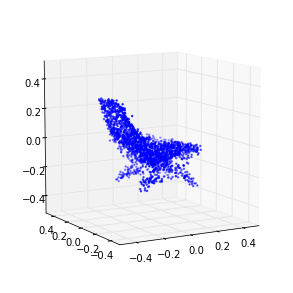

481 (-0.17380480324780501, 0.032849996471432621)
482 (-0.17193338451562104, 0.031586341559886932)
483 (-0.17383913077689983, 0.025631906602669646)
484 (-0.17367290953795114, 0.024822967247692524)
485 (-0.17372437803833574, 0.030119103603754884)
486 (-0.17169741452844053, 0.030614540153355511)
487 (-0.17286051776674058, 0.030890459457791789)
488 (-0.17390197051895989, 0.031150178052484989)
489 (-0.17472432675185026, 0.042295911038915314)
490 (-0.17492986796078858, 0.035796727467742234)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-490 is not in all_model_checkpoint_paths. Manually adding it.


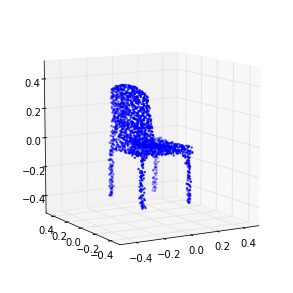

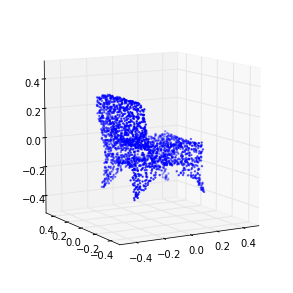

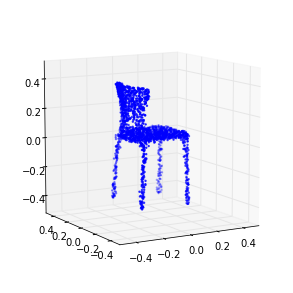

491 (-0.17350883428697234, 0.034247086124701634)
492 (-0.17217282906726555, 0.027721029827026306)
493 (-0.17293952880082308, 0.034499873234717933)
494 (-0.17475047674443986, 0.02923977797575019)
495 (-0.17325909088055294, 0.031844580839215604)
496 (-0.17376873713952523, 0.039626340795722276)
497 (-0.17497728842276114, 0.037110889416739894)
498 (-0.17349085874027675, 0.040569641213450164)
499 (-0.17285712813889539, 0.031574560432798333)
500 (-0.17498266619664651, 0.029586799020223594)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.


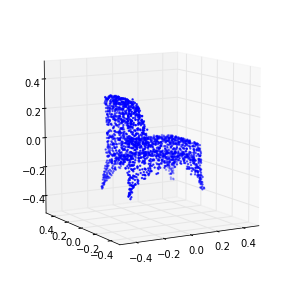

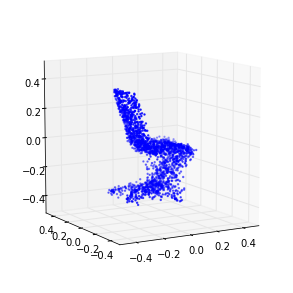

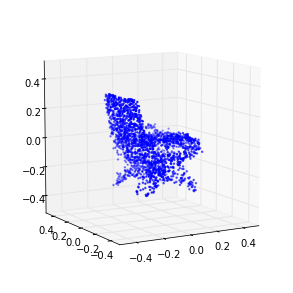

501 (-0.17357597516642675, 0.045349135994911194)
502 (-0.1728665226035648, 0.04228070771528615)
503 (-0.17483121543018906, 0.047997788974532378)
504 (-0.17095837383358567, 0.035535154053596432)
505 (-0.17364971637725829, 0.039484826183912379)
506 (-0.1722604771455129, 0.033218299538862926)
507 (-0.17295662230915493, 0.039059196667814697)
508 (-0.17093476675174854, 0.040250624719731232)
509 (-0.17291021622993327, 0.045860676922731929)
510 (-0.17420122419242506, 0.044553588178974611)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-510 is not in all_model_checkpoint_paths. Manually adding it.


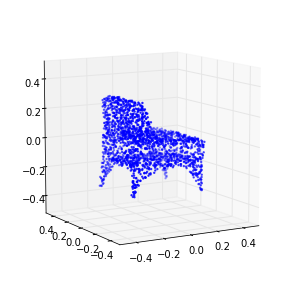

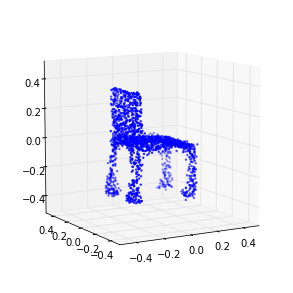

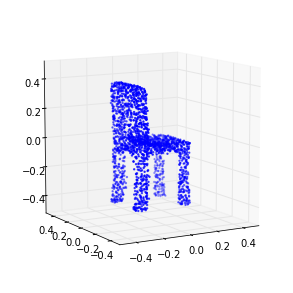

511 (-0.17424400934466608, 0.049553889263835221)
512 (-0.17409301344995146, 0.042987906063596405)
513 (-0.17320031258794996, 0.053171786445158499)
514 (-0.17216917408837212, 0.052611332593692675)
515 (-0.17509793418425101, 0.052625317747394242)
516 (-0.17330927721880102, 0.042632233282482182)
517 (-0.1737395339541965, 0.047936920904450946)
518 (-0.172244597474734, 0.050197119169213156)
519 (-0.1714318358235889, 0.05009634432348388)
520 (-0.1729649755689833, 0.057126528686947294)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-520 is not in all_model_checkpoint_paths. Manually adding it.


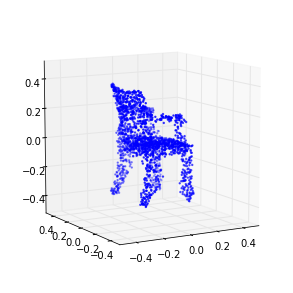

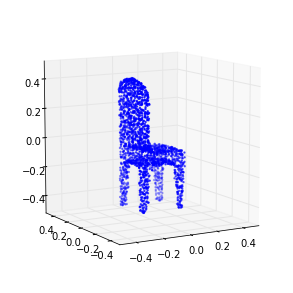

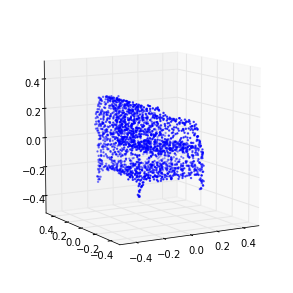

521 (-0.17372785696276913, 0.055256986231715592)
522 (-0.17366029526348467, 0.048746359569055063)
523 (-0.17333165727279803, 0.053706119388893796)
524 (-0.17343132242008491, 0.052591864433553487)
525 (-0.17349954942862192, 0.060420601249293042)
526 (-0.17325237569985566, 0.056391058213732859)
527 (-0.17327201565106709, 0.042698662314150065)
528 (-0.17558441614663159, 0.050547234024162647)
529 (-0.17303809998212039, 0.053825289700870159)
530 (-0.17235262404989313, 0.051353256252628786)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-530 is not in all_model_checkpoint_paths. Manually adding it.


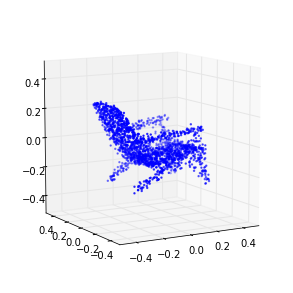

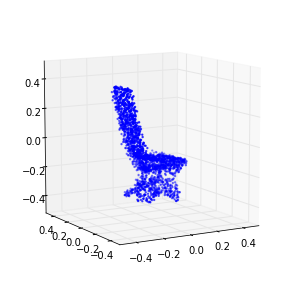

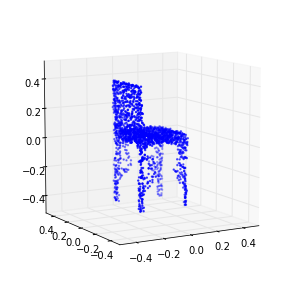

531 (-0.1716392460796568, 0.059697907418012619)
532 (-0.17437986654263957, 0.055061443950291035)
533 (-0.17366083595487808, 0.055027998638925726)
534 (-0.17419756772341552, 0.053049935993772966)
535 (-0.17413911212373662, 0.056086601275536746)
536 (-0.17371636375232979, 0.05644033276648433)
537 (-0.17423290356441781, 0.054700707602832049)
538 (-0.17399775584538776, 0.057129422478653769)
539 (-0.171104328389521, 0.05581035202852002)
540 (-0.17400916483667161, 0.05122491393100332)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-540 is not in all_model_checkpoint_paths. Manually adding it.


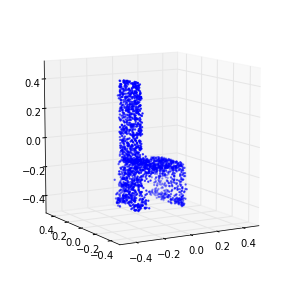

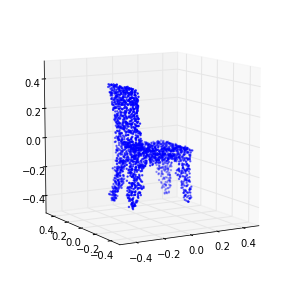

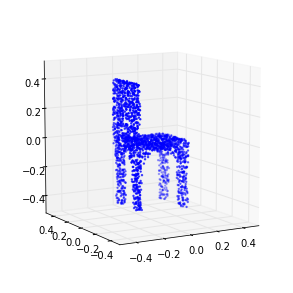

541 (-0.17360758648978339, 0.051308761040369667)
542 (-0.1738525006506178, 0.056210806006910627)
543 (-0.17240416242016687, 0.053900984909247468)
544 (-0.17517659840760408, 0.065229173473737856)
545 (-0.17267971403068966, 0.061658635597538064)
546 (-0.17303218322771566, 0.05914299700547148)
547 (-0.17285527277875828, 0.057463272440212744)
548 (-0.17290910283724467, 0.05344695280547495)
549 (-0.17288727418140129, 0.060906474788983665)
550 (-0.17224586252812987, 0.058659993801955822)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-550 is not in all_model_checkpoint_paths. Manually adding it.


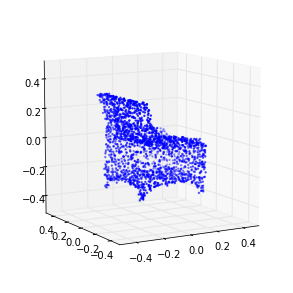

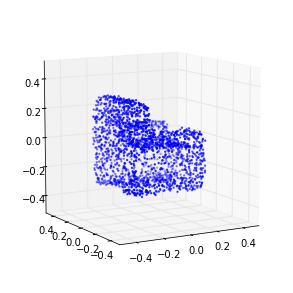

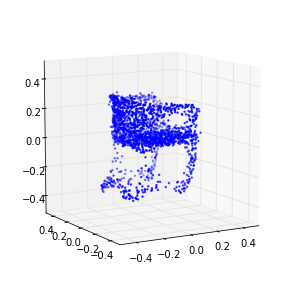

551 (-0.1751786595141446, 0.060281926972998515)
552 (-0.17422701865434648, 0.067231336401568517)
553 (-0.17314259972837237, 0.061830720967716642)
554 (-0.17324417045822851, 0.061441439307398267)
555 (-0.17507686427345984, 0.061976617685070741)
556 (-0.17243011825614504, 0.058541649469622863)
557 (-0.17334462017924698, 0.066316126535336181)
558 (-0.17409170623178835, 0.056761934525436826)
559 (-0.17276319232251908, 0.065587948731802126)
560 (-0.17280931053338228, 0.068909974285849815)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-560 is not in all_model_checkpoint_paths. Manually adding it.


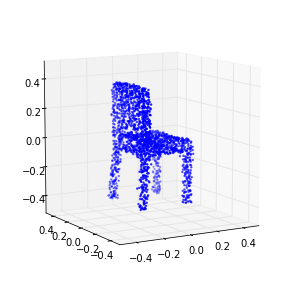

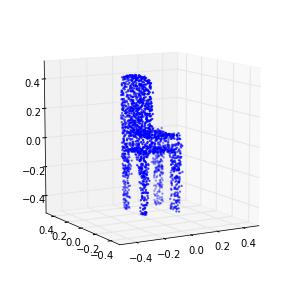

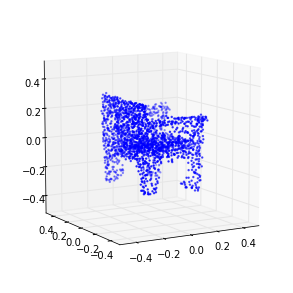

561 (-0.17311648947221261, 0.064988119458710705)
562 (-0.17400582278216326, 0.05899685717843197)
563 (-0.17288919576892145, 0.058134506422060507)
564 (-0.17322255930414907, 0.062909646994537771)
565 (-0.17402183672896138, 0.069046395382395501)
566 (-0.17259480898027066, 0.065897614591651499)
567 (-0.17459275159570906, 0.067510953380001917)
568 (-0.17172663874096342, 0.062288091552478296)
569 (-0.17368686596552532, 0.068869551574742352)
570 (-0.1731529395889353, 0.076103004178515191)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-570 is not in all_model_checkpoint_paths. Manually adding it.


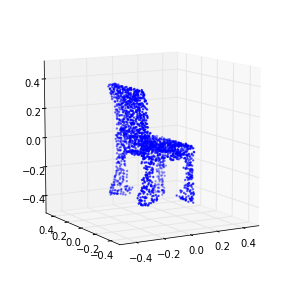

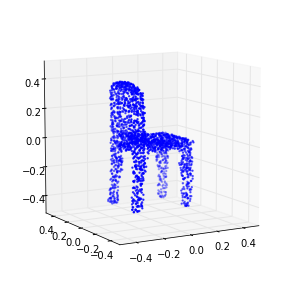

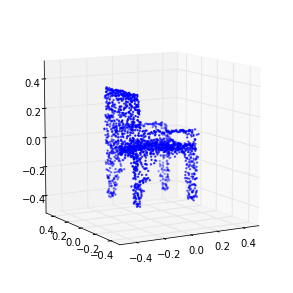

571 (-0.17309358743605791, 0.071234403936951254)
572 (-0.17147874302334257, 0.058353015118175082)
573 (-0.17469156594188126, 0.071353352732128561)
574 (-0.17127416321524866, 0.072861553894148931)
575 (-0.17295800210149201, 0.065426405657220771)
576 (-0.17404040054038719, 0.068518571141693324)
577 (-0.17214605742030673, 0.065374769684341222)
578 (-0.17365142945890075, 0.061630094630850688)
579 (-0.17300280332565307, 0.067969277777053694)
580 (-0.17367510917010132, 0.070333462760404308)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-580 is not in all_model_checkpoint_paths. Manually adding it.


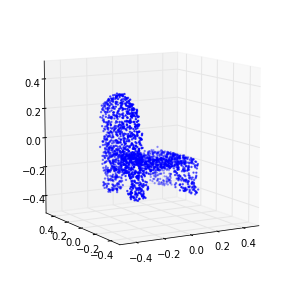

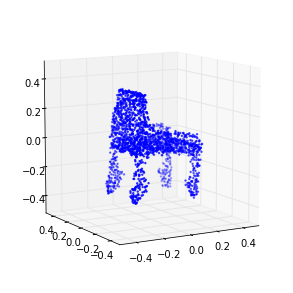

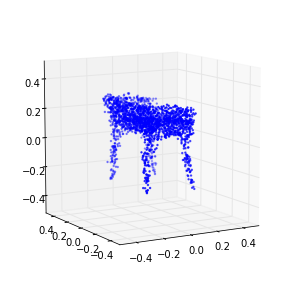

581 (-0.17352604523853019, 0.069595961521069213)
582 (-0.17229658012036925, 0.075831316411495209)
583 (-0.17143796389853513, 0.069670297343421866)
584 (-0.17367372104415188, 0.070040787397711371)
585 (-0.17260262348033764, 0.076000745097796127)
586 (-0.17398385841537406, 0.073972880288406651)
587 (-0.17461667127079433, 0.075795047261096815)
588 (-0.17364020706326874, 0.067454593876997634)
589 (-0.17325271655012059, 0.073086774045670475)
590 (-0.17527161058452395, 0.076287807275851563)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-590 is not in all_model_checkpoint_paths. Manually adding it.


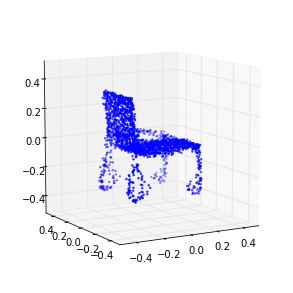

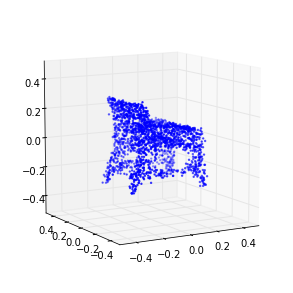

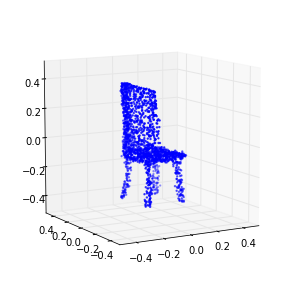

591 (-0.17334247838567804, 0.068579246738442665)
592 (-0.17281152892995763, 0.076979589545064508)
593 (-0.17169634423874042, 0.077587064631559233)
594 (-0.17220183842711978, 0.072488347137415851)
595 (-0.17307169829253796, 0.076278915697777713)
596 (-0.17310849902806458, 0.081097369944607769)
597 (-0.17388104244514749, 0.074047434109228635)
598 (-0.17353075190826697, 0.073155926333533391)
599 (-0.17333278479399505, 0.078243228158465142)
600 (-0.17309902531129343, 0.072572682328798155)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-600 is not in all_model_checkpoint_paths. Manually adding it.


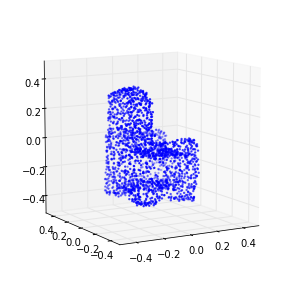

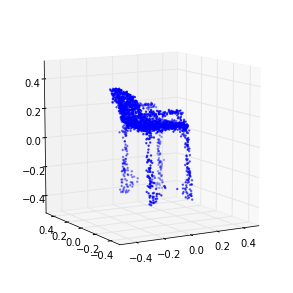

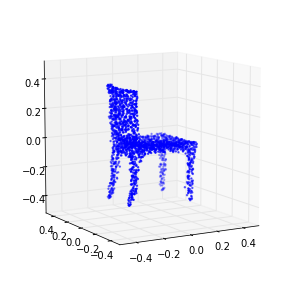

601 (-0.17132062503585108, 0.081199642270803452)
602 (-0.17325835399053716, 0.075252702528679813)
603 (-0.17380955208230903, 0.077157786736885711)
604 (-0.17276730062784973, 0.076263176898161575)
605 (-0.17345439300492957, 0.072639034854041204)
606 (-0.17267688523840022, 0.082820721936446642)
607 (-0.17338837506594482, 0.07378942547021089)
608 (-0.1728343493408627, 0.0754377890240263)
609 (-0.17273154987229242, 0.076830072949330017)
610 (-0.17252210080623626, 0.078944781312236076)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-610 is not in all_model_checkpoint_paths. Manually adding it.


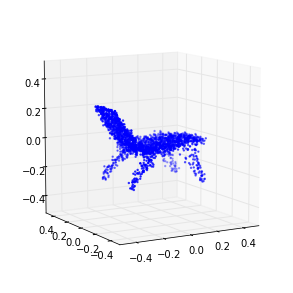

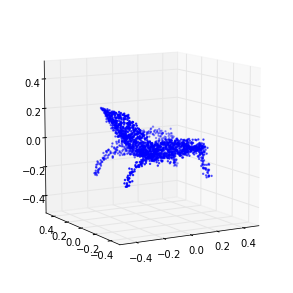

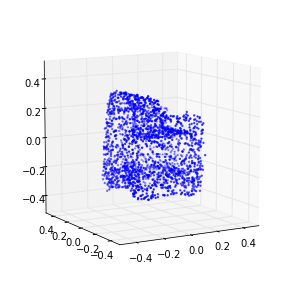

611 (-0.17267570534238108, 0.083577105706488644)
612 (-0.17311257521311443, 0.082912772342010777)
613 (-0.17249155419844167, 0.078196271012226745)
614 (-0.17239403492874569, 0.078532930049631328)
615 (-0.17521259828850075, 0.083249940778370252)
616 (-0.17386100413622679, 0.084254341820875808)
617 (-0.17153857747713724, 0.081503238115045756)
618 (-0.17210741352151943, 0.085726842560150007)
619 (-0.17345453004042308, 0.082440484315156937)
620 (-0.17322148371625828, 0.077766256337916409)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-620 is not in all_model_checkpoint_paths. Manually adding it.


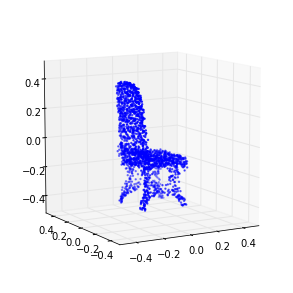

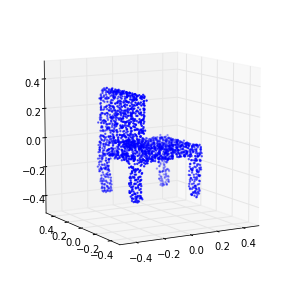

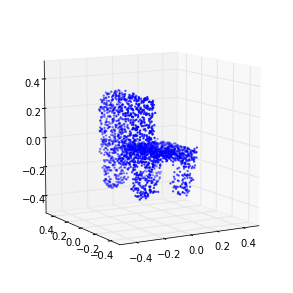

621 (-0.17222340747162149, 0.093877930194139481)
622 (-0.17420518530739679, 0.086223122146394521)
623 (-0.17445717884434594, 0.089510852126059706)
624 (-0.17096440322973111, 0.083419558074739247)
625 (-0.17446545207941974, 0.086729597162317346)
626 (-0.17302926690490159, 0.084090541082399869)
627 (-0.17204860393647795, 0.086090181160856177)
628 (-0.17201259941966446, 0.082621788675034488)
629 (-0.17364244538324849, 0.087728694357253889)
630 (-0.17141424323673601, 0.090872833298312292)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-630 is not in all_model_checkpoint_paths. Manually adding it.


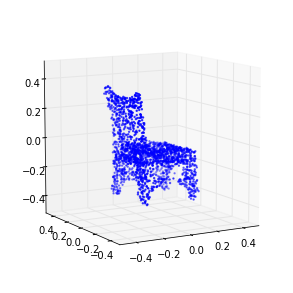

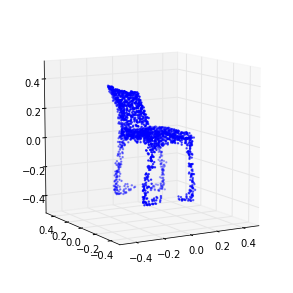

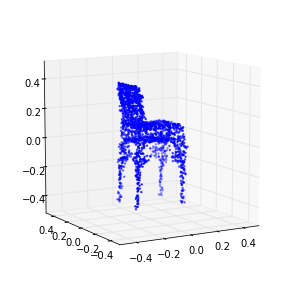

631 (-0.17374638594962932, 0.089246741737480512)
632 (-0.17231833598128071, 0.086529847096513818)
633 (-0.17252943835876605, 0.083838028212388352)
634 (-0.17417168186770546, 0.091487402993219877)
635 (-0.17337484558423361, 0.082394333349333868)
636 (-0.17324913375907475, 0.088872280661706576)
637 (-0.17298990184510196, 0.084108909523045575)
638 (-0.17289832753163797, 0.092795550133343091)
639 (-0.17253520985444387, 0.091872584212709357)
640 (-0.17222738784772379, 0.087942062014782871)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-640 is not in all_model_checkpoint_paths. Manually adding it.


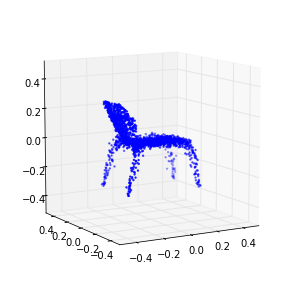

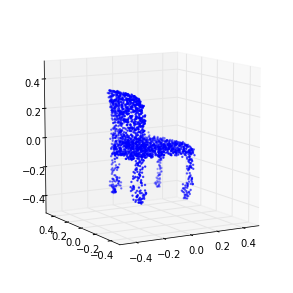

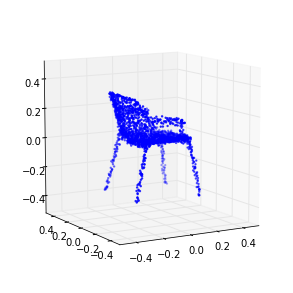

641 (-0.17190109469272472, 0.088812407106161118)
642 (-0.17129372424549527, 0.088911055828686109)
643 (-0.17219644845635804, 0.084589195334249079)
644 (-0.17304375856011003, 0.087698194715711802)
645 (-0.17318062550491756, 0.089494810612113382)
646 (-0.17300054585492169, 0.091043125424120158)
647 (-0.17266276357350527, 0.095532847085484748)
648 (-0.17252702039700968, 0.09725637057865108)
649 (-0.17391122623726174, 0.096719531135426626)
650 (-0.17380654535911702, 0.088431755977648283)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-650 is not in all_model_checkpoint_paths. Manually adding it.


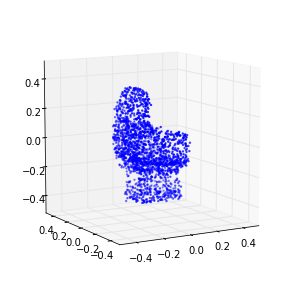

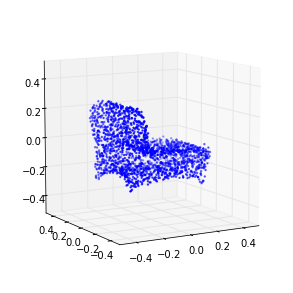

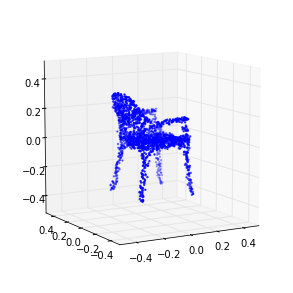

651 (-0.17194051924679016, 0.097126228389916594)
652 (-0.17142995435882497, 0.091329582863383829)
653 (-0.17192579949343645, 0.090562258605603824)
654 (-0.17287634544902378, 0.093026146292686462)
655 (-0.17235827793677647, 0.08643946575897711)
656 (-0.17123549437081373, 0.10537441185227146)
657 (-0.17422943501560775, 0.09980263616199847)
658 (-0.17174733027263925, 0.0927478722124188)
659 (-0.17227157541999111, 0.097667532938498045)
660 (-0.17243813960640519, 0.096146348725866387)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-660 is not in all_model_checkpoint_paths. Manually adding it.


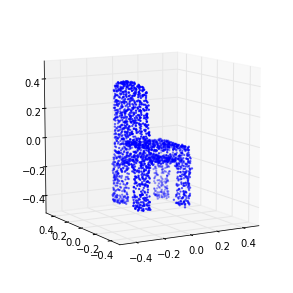

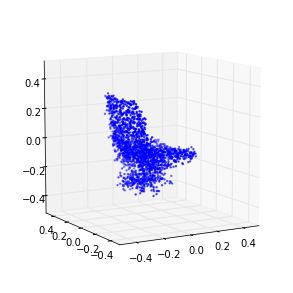

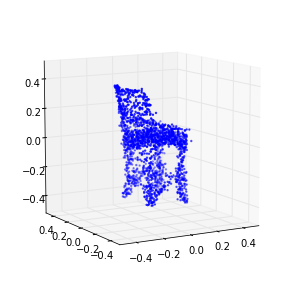

661 (-0.17198689546849993, 0.099444164998001516)
662 (-0.17159020205338796, 0.099569230167954062)
663 (-0.17302242550585006, 0.098418327945250059)
664 (-0.17288121823911315, 0.099253918837617944)
665 (-0.17050131537296154, 0.10118159458593086)
666 (-0.17269902737052353, 0.10499991752483227)
667 (-0.17138919957258084, 0.09873034004811887)
668 (-0.17208810371381264, 0.099035310248533889)
669 (-0.17187120108692736, 0.098316936581223105)
670 (-0.17359862912584234, 0.10150006441054521)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-670 is not in all_model_checkpoint_paths. Manually adding it.


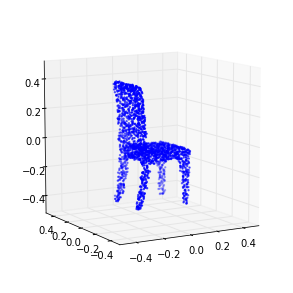

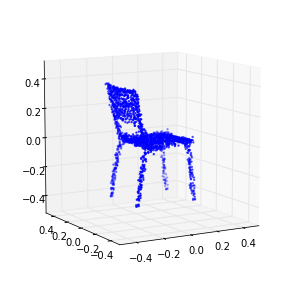

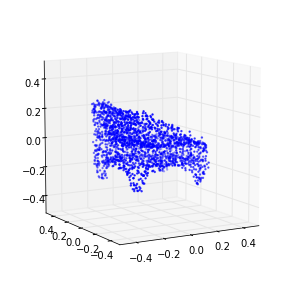

671 (-0.17295557006641671, 0.099390241282957578)
672 (-0.17182346289908446, 0.10611850382001312)
673 (-0.1726380956393701, 0.10398977718971393)
674 (-0.17266382591591942, 0.098078511103435795)
675 (-0.17293876398492741, 0.097359967728455857)
676 (-0.17332725833963464, 0.099242348361898353)
677 (-0.17260131416497407, 0.10636725635440261)
678 (-0.17386233078108893, 0.10172361273456502)
679 (-0.1719369920315566, 0.10265805130755459)
680 (-0.17091828121079339, 0.10549653404288822)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-680 is not in all_model_checkpoint_paths. Manually adding it.


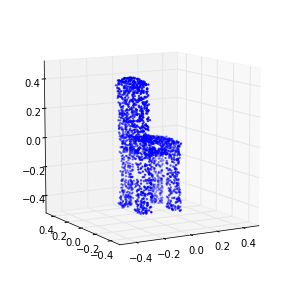

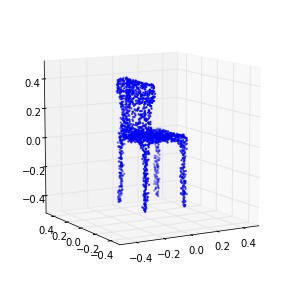

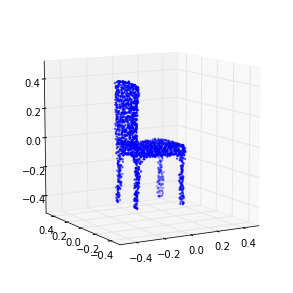

681 (-0.17446036316730357, 0.106363486636568)
682 (-0.17180197763222235, 0.09953970931194446)
683 (-0.17464490676367725, 0.11522164195775986)
684 (-0.17161714854063811, 0.10584929309509418)
685 (-0.1724806319784235, 0.10640318112240897)
686 (-0.17228509143546775, 0.1053616972985091)
687 (-0.17290831975362919, 0.10363100496707139)
688 (-0.17311296440936902, 0.10471464610762066)
689 (-0.17257828866993941, 0.11002611920789436)
690 (-0.17095246955200477, 0.10588139295578003)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-690 is not in all_model_checkpoint_paths. Manually adding it.


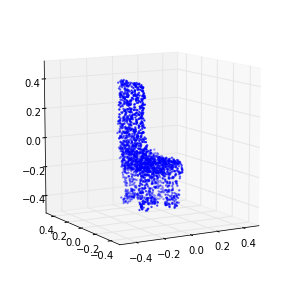

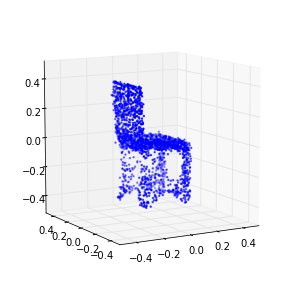

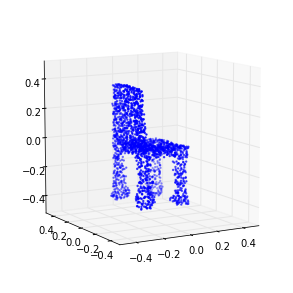

691 (-0.1710727698273129, 0.097856303607975995)
692 (-0.17133336884004099, 0.10519948684506947)
693 (-0.17361191191055156, 0.10563649319940144)
694 (-0.17242826769749323, 0.1049787766403622)
695 (-0.17098656826549105, 0.10189057279516149)
696 (-0.17273445692327288, 0.10680827139704316)
697 (-0.17305208996490196, 0.1023806874398832)
698 (-0.17335147029823728, 0.10973992143516187)
699 (-0.1734145885264432, 0.1103469196844984)
700 (-0.17365959706129852, 0.10333722112355409)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-700 is not in all_model_checkpoint_paths. Manually adding it.


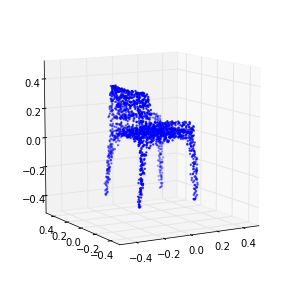

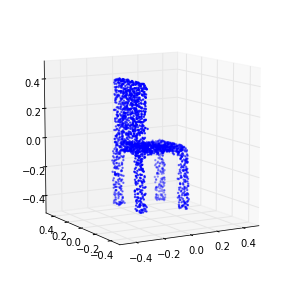

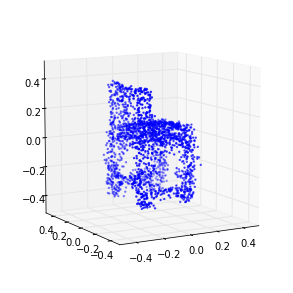

701 (-0.17336296571625603, 0.10820846839083566)
702 (-0.17207528821848056, 0.10896360763797054)
703 (-0.17309444778495364, 0.10161682728815961)
704 (-0.172078130752952, 0.10965477564820537)
705 (-0.17254858138384643, 0.10782151172558467)
706 (-0.17239857547812992, 0.10740152332517836)
707 (-0.17238714926772647, 0.10462296009063721)
708 (-0.17232378677085594, 0.1068488069706493)
709 (-0.17200065531112529, 0.11128488155426802)
710 (-0.17305719333666342, 0.10289984334398199)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-710 is not in all_model_checkpoint_paths. Manually adding it.


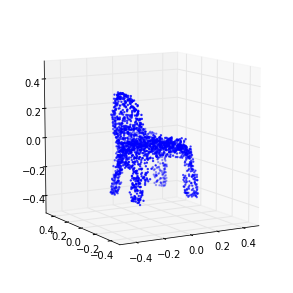

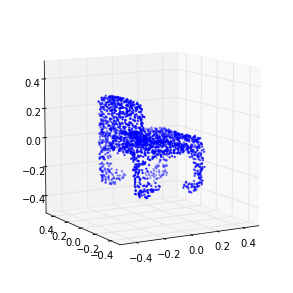

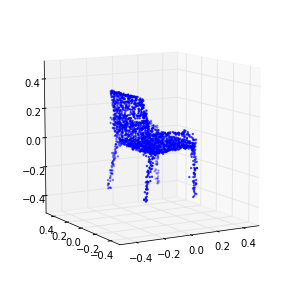

711 (-0.17198795587928206, 0.10889189690351486)
712 (-0.17206952196580391, 0.11086698952648374)
713 (-0.17170572998347106, 0.10695775156771695)
714 (-0.17202486031585271, 0.10085402097966936)
715 (-0.17281010669690591, 0.11222658251170758)
716 (-0.17175169498832138, 0.10035739949455967)
717 (-0.17161104590804488, 0.10573150990185914)
718 (-0.17141759417675159, 0.098722723347169375)
719 (-0.1721889521236773, 0.10671880841255188)
720 (-0.17344235844082304, 0.10989013121083931)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-720 is not in all_model_checkpoint_paths. Manually adding it.


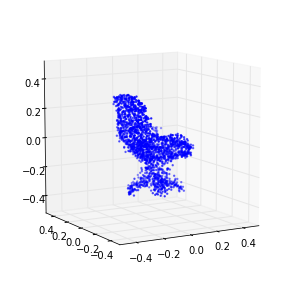

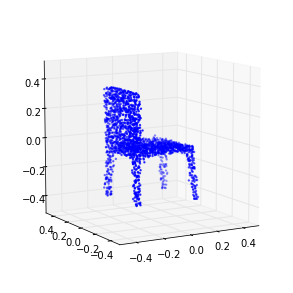

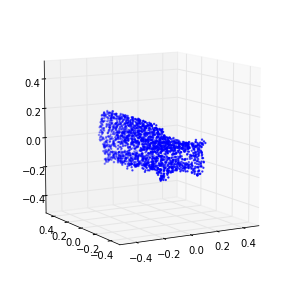

721 (-0.17328096286014275, 0.10581842175236454)
722 (-0.17057916786935595, 0.10332324217866969)
723 (-0.17103856526039266, 0.1196976105372111)
724 (-0.17221178898104914, 0.10609059035778046)
725 (-0.17207926644219293, 0.10991242748719675)
726 (-0.1732126979916184, 0.10725020010162283)
727 (-0.17284980355589477, 0.11207489034643879)
728 (-0.17269393029036345, 0.11472527379239048)
729 (-0.17312195621154927, 0.11118862005295577)
730 (-0.17295455336570739, 0.11743964834345712)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-730 is not in all_model_checkpoint_paths. Manually adding it.


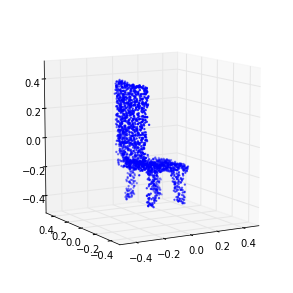

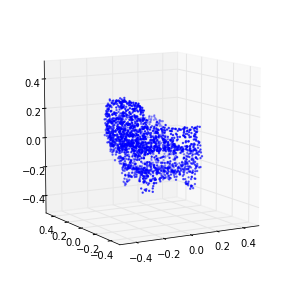

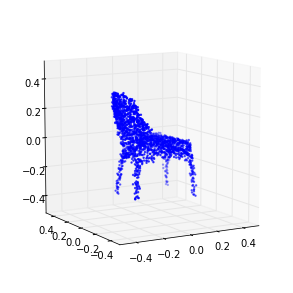

731 (-0.17144735289944543, 0.11480041013823615)
732 (-0.17309491987581607, 0.11036461646910067)
733 (-0.1709553763822273, 0.10859870745076074)
734 (-0.17293331612039495, 0.11355740383819297)
735 (-0.17039658493465848, 0.10699337582897257)
736 (-0.17044584933254453, 0.10765812049309413)
737 (-0.17120124912924237, 0.10993796724964071)
738 (-0.17408199619363857, 0.10988821006483501)
739 (-0.17199716115439379, 0.11160483542415831)
740 (-0.17308285788253502, 0.11758872480304153)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-740 is not in all_model_checkpoint_paths. Manually adding it.


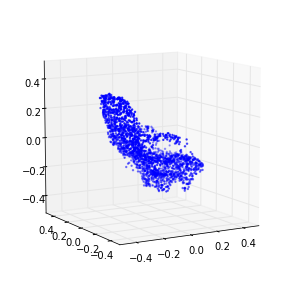

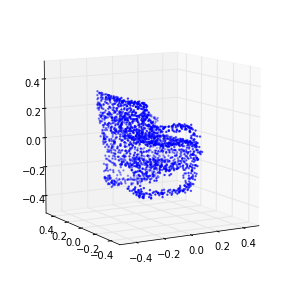

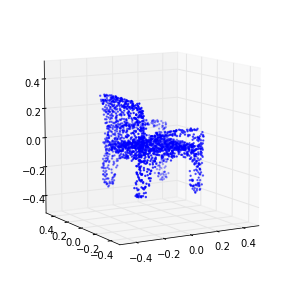

741 (-0.17094239493211111, 0.11083933462699254)
742 (-0.17109178597176516, 0.11502731343110402)
743 (-0.17315145697858597, 0.10967972350341303)
744 (-0.17142482786266891, 0.10674460618584244)
745 (-0.1713860010659253, 0.10733307787665615)
746 (-0.17152581181791093, 0.1121698107432436)
747 (-0.17103446159097885, 0.10439540087072938)
748 (-0.16995997881447827, 0.11094489528073205)
749 (-0.16996041779164914, 0.11013428425347363)
750 (-0.17074527718402721, 0.11199910607602862)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-750 is not in all_model_checkpoint_paths. Manually adding it.


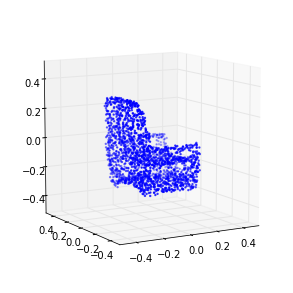

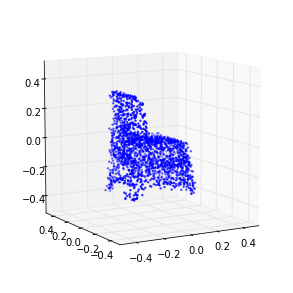

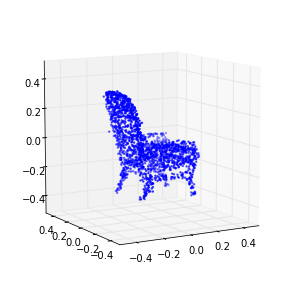

751 (-0.1717784152538688, 0.10559761993311069)
752 (-0.16849382177547173, 0.10592333006638067)
753 (-0.17019744945896997, 0.11037558979458278)
754 (-0.17260123568552513, 0.10783072698999334)
755 (-0.17131090473245691, 0.10928360759108155)
756 (-0.17255935663426364, 0.10925350724546998)
757 (-0.17171812046457219, 0.11254690339167912)
758 (-0.17293788492679596, 0.11599464548958673)
759 (-0.17204785970626055, 0.10945474715144546)
760 (-0.17423510374846282, 0.10533318254682753)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-760 is not in all_model_checkpoint_paths. Manually adding it.


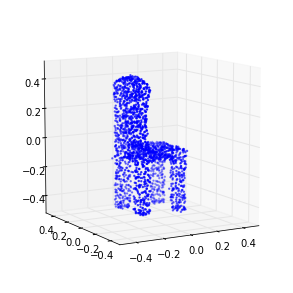

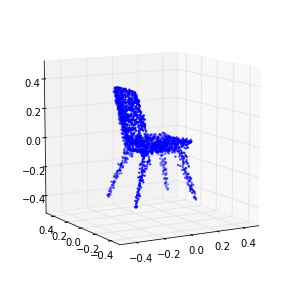

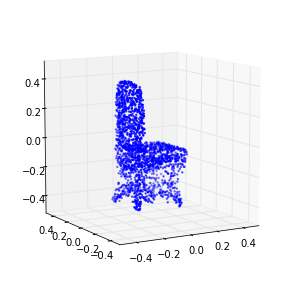

761 (-0.17120326900923694, 0.11223555411453601)
762 (-0.17351198439244872, 0.11467315229000868)
763 (-0.17127858201662699, 0.11645915442042881)
764 (-0.17209226919545068, 0.11539264547604101)
765 (-0.17159918027895468, 0.10988665206564797)
766 (-0.17214154380339164, 0.11175736564177054)
767 (-0.17232058517358922, 0.11232560873031616)
768 (-0.17301982067249438, 0.11263032643883317)
769 (-0.17096758407575113, 0.11356669278056533)
770 (-0.17180219678967087, 0.11444331236459591)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-770 is not in all_model_checkpoint_paths. Manually adding it.


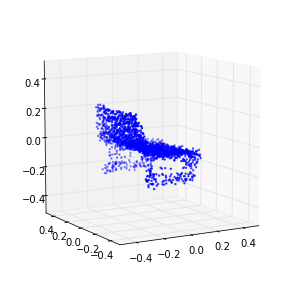

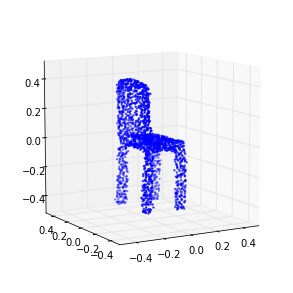

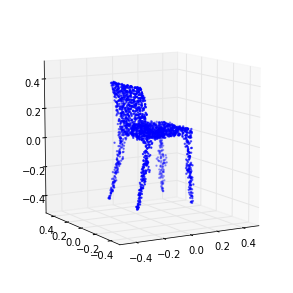

771 (-0.17232789369644941, 0.11386964718500774)
772 (-0.17148800293604533, 0.10719486919266207)
773 (-0.17124287475038458, 0.1180791093243493)
774 (-0.17382110368322443, 0.11021613357243715)
775 (-0.17303464335423929, 0.11544548996068814)
776 (-0.17169205253874814, 0.1100831037318265)
777 (-0.17306699885262383, 0.11292967393442437)
778 (-0.1728449378852491, 0.11189456201261944)
779 (-0.17349366192464474, 0.11449573796104502)
780 (-0.1729281073367154, 0.11114607089095646)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-780 is not in all_model_checkpoint_paths. Manually adding it.


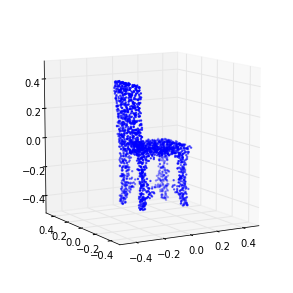

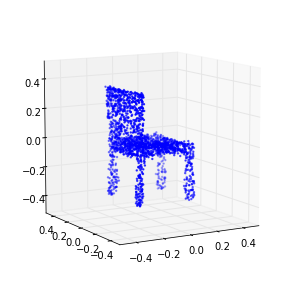

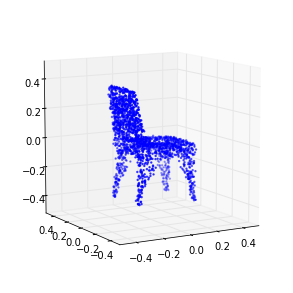

781 (-0.17345651079107213, 0.1070674655062181)
782 (-0.1732837106342669, 0.11696867755165806)
783 (-0.17472268067024371, 0.10761790612229595)
784 (-0.17037345662161155, 0.11031489046635451)
785 (-0.17315222830684096, 0.11553785536024305)
786 (-0.17355095975928836, 0.10944639808601803)
787 (-0.17363975677225324, 0.11140715275649671)
788 (-0.17312745606457747, 0.11232486201657189)
789 (-0.17275863521628909, 0.11630533028531957)
790 (-0.17113462222947015, 0.11732711367033145)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-790 is not in all_model_checkpoint_paths. Manually adding it.


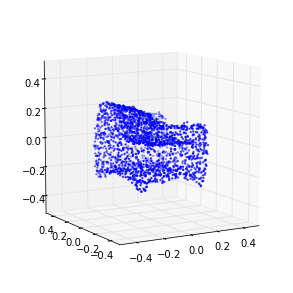

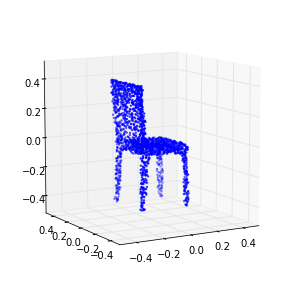

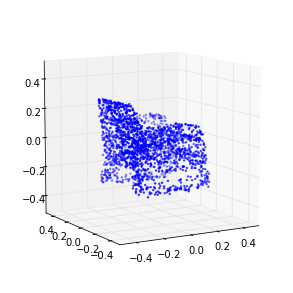

791 (-0.17243417435222202, 0.11423073239900448)
792 (-0.1720015925389749, 0.11285513363502643)
793 (-0.17291847346005618, 0.1194704012186439)
794 (-0.17387111606421293, 0.11180579082833396)
795 (-0.17228197687202029, 0.11532384295154501)
796 (-0.1725861089097129, 0.10985772146119012)
797 (-0.17287385552017778, 0.11974705038247285)
798 (-0.1728974786069658, 0.11556673905363789)
799 (-0.17141216253792799, 0.12594315520039312)
800 (-0.17327434398509839, 0.1189602130541095)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-800 is not in all_model_checkpoint_paths. Manually adding it.


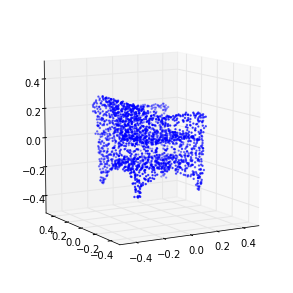

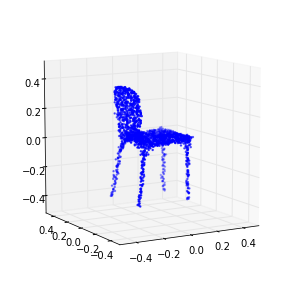

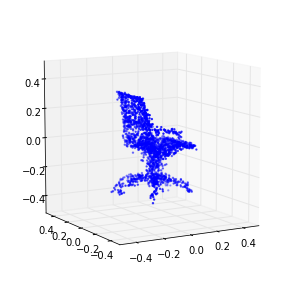

801 (-0.1724468814002143, 0.11302075038353603)
802 (-0.17318644512582709, 0.1145122484476478)
803 (-0.17257330461784645, 0.11875228583812714)
804 (-0.17164723409546745, 0.11376108532702481)
805 (-0.17344487497100122, 0.11691840903626548)
806 (-0.17253811646390843, 0.11959644186275976)
807 (-0.17414819123568359, 0.11834290237338455)
808 (-0.17288288109832339, 0.11813969882550063)
809 (-0.172172095157482, 0.12212718802469748)
810 (-0.1713297223603284, 0.1118374941525636)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-810 is not in all_model_checkpoint_paths. Manually adding it.


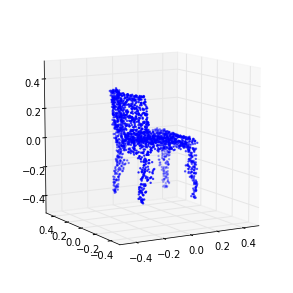

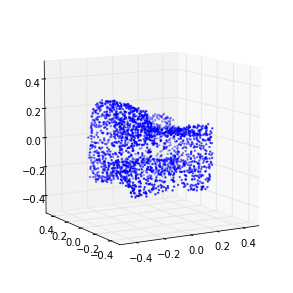

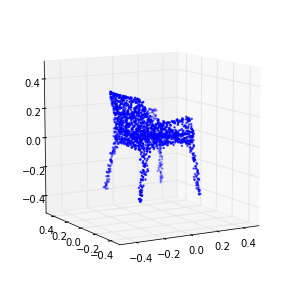

811 (-0.1731146585058283, 0.12161860063120171)
812 (-0.17140271487059416, 0.11252944530160339)
813 (-0.17168813701029176, 0.11560503227843179)
814 (-0.1725677012293427, 0.11468512868439709)
815 (-0.1727341592311859, 0.12127596001934123)
816 (-0.17266512954676594, 0.11428322918989041)
817 (-0.17234555593243353, 0.11598461038536495)
818 (-0.17278384621496554, 0.1136419356421188)
819 (-0.1714187236847701, 0.12751043560328307)
820 (-0.17364059112690114, 0.11712398490420094)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-820 is not in all_model_checkpoint_paths. Manually adding it.


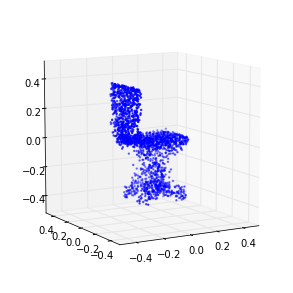

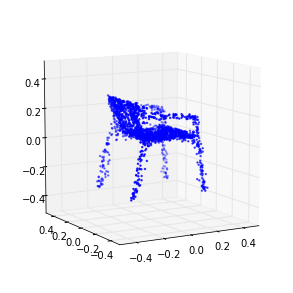

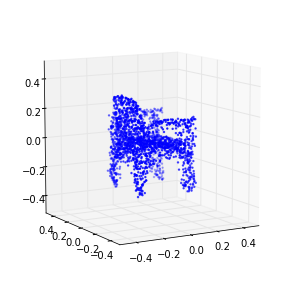

821 (-0.17250972092151642, 0.10964754003065603)
822 (-0.17087274353813242, 0.11127481278445986)
823 (-0.17294227370509394, 0.11617946238429458)
824 (-0.17193534164517013, 0.11284496000519505)
825 (-0.17034339231473428, 0.11776297291119893)
826 (-0.17184090669508334, 0.11506521619028515)
827 (-0.17200566508151865, 0.11846485789175387)
828 (-0.17168966200616625, 0.11249332626660664)
829 (-0.17169870557608427, 0.11420982579390208)
830 (-0.17063167470472831, 0.12347074736047674)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-830 is not in all_model_checkpoint_paths. Manually adding it.


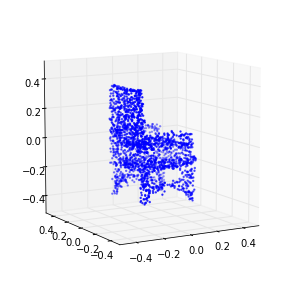

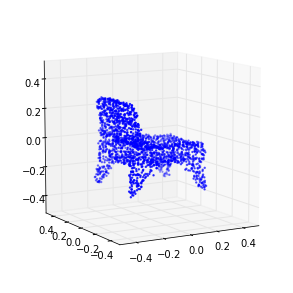

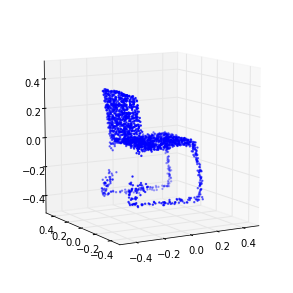

831 (-0.17044585534819851, 0.1216239595302829)
832 (-0.17201276576077495, 0.1223808154463768)
833 (-0.1718363959480215, 0.11589199746096576)
834 (-0.17183608688690044, 0.11007866815284446)
835 (-0.17205517380325883, 0.11169857531785965)
836 (-0.17157503421659823, 0.12164903680483501)
837 (-0.17127825772320782, 0.11866849854036614)
838 (-0.17219130672790386, 0.12332786564473752)
839 (-0.171334876064901, 0.1178621224783085)
840 (-0.1702985257462219, 0.11819082995255788)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-840 is not in all_model_checkpoint_paths. Manually adding it.


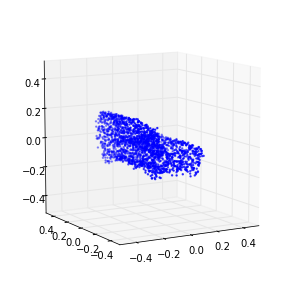

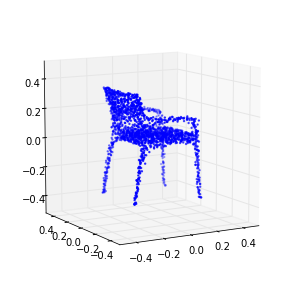

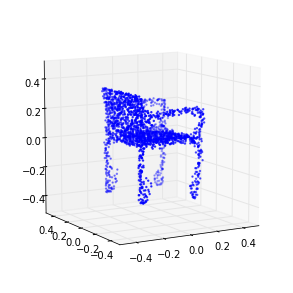

841 (-0.17094331885929462, 0.11984981844822566)
842 (-0.1705514269846457, 0.11810467502585163)
843 (-0.17076462010542551, 0.11578065598452533)
844 (-0.17294897326716671, 0.11506316534898899)
845 (-0.17142853251209966, 0.11835767383928653)
846 (-0.17039524471318279, 0.11975487183641505)
847 (-0.1706051090249309, 0.12307177235682805)
848 (-0.17215262618329791, 0.11593899461958143)
849 (-0.1725922570184425, 0.11653479409438593)
850 (-0.17041562585918993, 0.11536124431424671)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-850 is not in all_model_checkpoint_paths. Manually adding it.


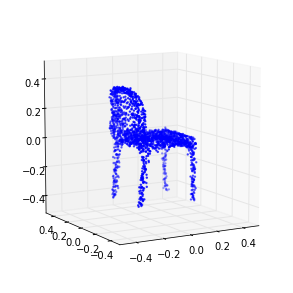

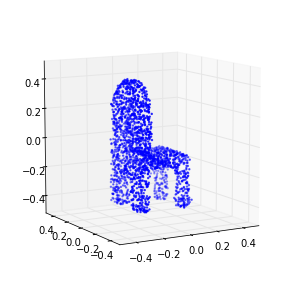

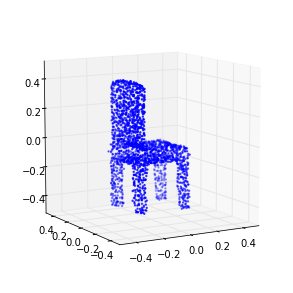

851 (-0.17095915332988457, 0.11632768506253208)
852 (-0.17188227949319063, 0.1203691170171455)
853 (-0.17066806963196507, 0.11246259344948663)
854 (-0.17193293990912262, 0.12653261202353019)
855 (-0.17257850225324983, 0.12081327868832482)
856 (-0.17079010627887867, 0.1160006296855432)
857 (-0.17226584123240576, 0.1262800461716122)
858 (-0.17172445665906977, 0.11273162480857638)
859 (-0.17063308998390481, 0.13221480090309073)
860 (-0.17085524598757426, 0.12027406802883854)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-860 is not in all_model_checkpoint_paths. Manually adding it.


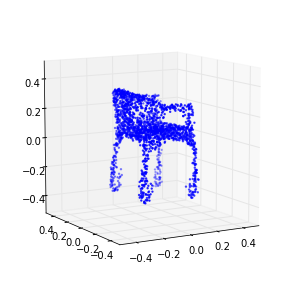

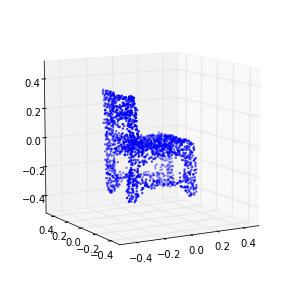

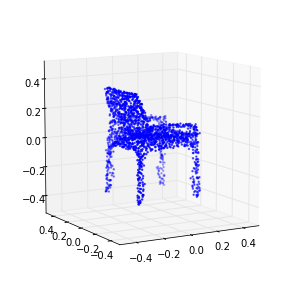

861 (-0.17234749098618826, 0.12350717987175341)
862 (-0.17041324310832554, 0.12526453755520009)
863 (-0.17126691506968605, 0.12593945529725817)
864 (-0.1717626929283142, 0.12402178071163318)
865 (-0.17031184931596119, 0.1243367788416368)
866 (-0.17180235496273746, 0.12583728686526971)
867 (-0.17204194609765652, 0.12463365522799669)
868 (-0.17060321525291161, 0.12454450516789048)
869 (-0.17246442271603479, 0.12535742008023792)
870 (-0.17199880248970456, 0.12334049603453388)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-870 is not in all_model_checkpoint_paths. Manually adding it.


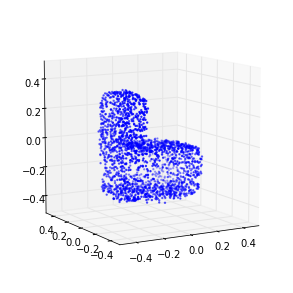

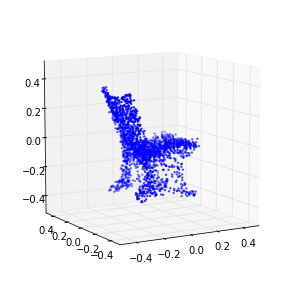

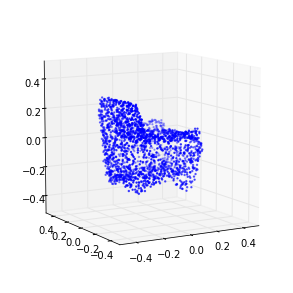

871 (-0.17228424593254371, 0.12526395006312263)
872 (-0.17291671247393997, 0.12061510097097468)
873 (-0.17126373251279195, 0.13342631056352897)
874 (-0.17298801320570487, 0.12962240753350435)
875 (-0.17259379437676184, 0.12368267112308079)
876 (-0.17222034290984825, 0.12930776951489625)
877 (-0.17180861433347067, 0.12424850463867188)
878 (-0.17180096231125019, 0.12929678377177981)
879 (-0.17291225382575282, 0.12123406126543328)
880 (-0.1717652878275624, 0.13375912303173984)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-880 is not in all_model_checkpoint_paths. Manually adding it.


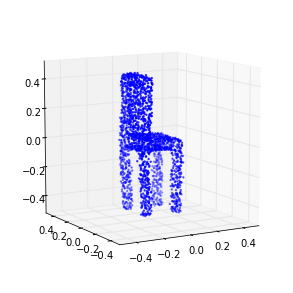

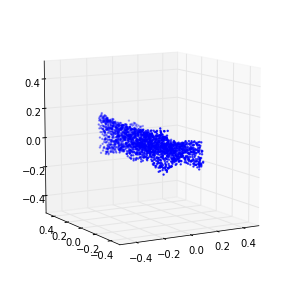

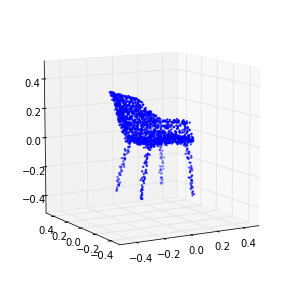

881 (-0.17144124331297697, 0.12587283303340277)
882 (-0.17110509773095448, 0.127892655354959)
883 (-0.171973729023227, 0.12463660483007077)
884 (-0.17189919860274702, 0.12204487842542154)
885 (-0.17330766259520142, 0.12694838836237235)
886 (-0.17359548608462017, 0.12570353073102455)
887 (-0.17249114436131938, 0.12581713000933328)
888 (-0.17129749159018198, 0.12175803355596683)
889 (-0.17109894774578235, 0.11808556759798969)
890 (-0.17056467235088349, 0.12439672179796078)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-890 is not in all_model_checkpoint_paths. Manually adding it.


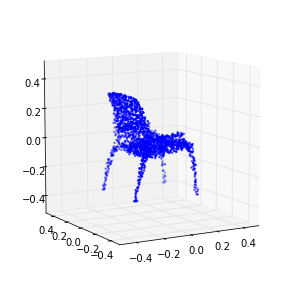

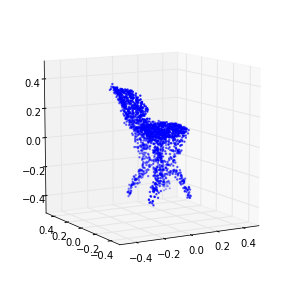

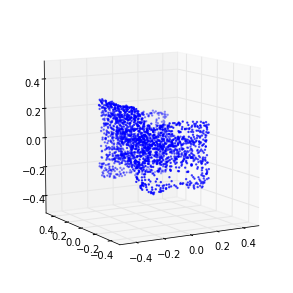

891 (-0.17275380999953657, 0.12490750711273264)
892 (-0.17025380719591071, 0.12825171594266538)
893 (-0.17163185267536729, 0.12725982980595696)
894 (-0.17099815706411997, 0.12396034239618867)
895 (-0.17099366629565205, 0.13158017700469052)
896 (-0.17214603115011146, 0.12828413369479003)
897 (-0.17231000816380537, 0.12241587235971733)
898 (-0.17147384263851023, 0.12177493616386696)
899 (-0.17303430973379699, 0.12647257331344816)
900 (-0.1720385409063763, 0.1254712227318022)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-900 is not in all_model_checkpoint_paths. Manually adding it.


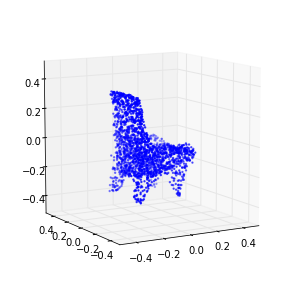

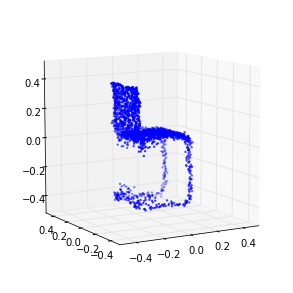

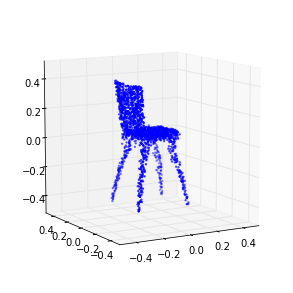

901 (-0.17301003943990778, 0.12736606404737191)
902 (-0.17199671378842107, 0.12686562455362743)
903 (-0.17185395106121346, 0.1264044432728379)
904 (-0.17128716199486343, 0.13170767106391765)
905 (-0.1714994748433431, 0.12969734685288536)
906 (-0.17160663196334133, 0.12420042714586964)
907 (-0.17234480524504625, 0.12644324175737523)
908 (-0.17231020000245836, 0.12880349104051236)
909 (-0.17256097683200131, 0.12788778101956402)
910 (-0.17391347708525481, 0.131712741597935)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-910 is not in all_model_checkpoint_paths. Manually adding it.


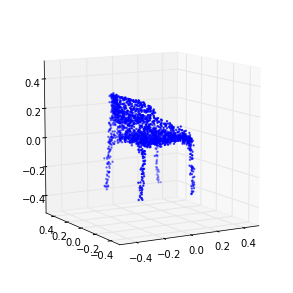

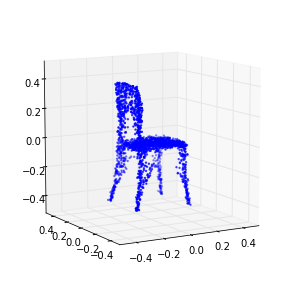

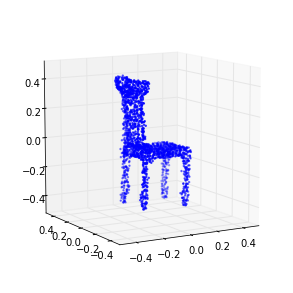

911 (-0.17015185565860183, 0.12287895215882196)
912 (-0.17253588289022445, 0.12624416058814084)
913 (-0.17084722066367114, 0.12664141450767163)
914 (-0.17172677881187862, 0.12205981352814922)
915 (-0.17174024239734367, 0.12615233576960033)
916 (-0.17156899759063013, 0.12710974144714851)
917 (-0.17084431284003787, 0.12381667091890618)
918 (-0.17190622102331232, 0.12546286511200447)
919 (-0.17121947198002427, 0.12373443361785677)
920 (-0.17101163886211537, 0.12573211888472238)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-920 is not in all_model_checkpoint_paths. Manually adding it.


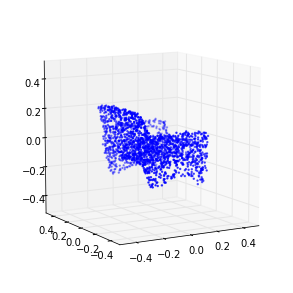

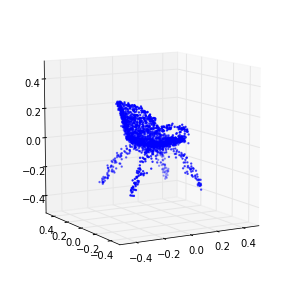

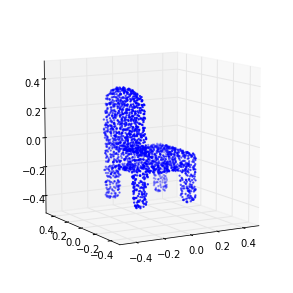

921 (-0.17076964720531745, 0.13172806468274859)
922 (-0.17222661497416319, 0.12533670194722987)
923 (-0.1721317265872602, 0.13351670376680516)
924 (-0.17290389559887073, 0.13099211481986223)
925 (-0.17319872898084146, 0.11883745480466772)
926 (-0.17284753344677112, 0.13093133822635369)
927 (-0.17281603868360873, 0.12576296152891936)
928 (-0.17087780656637969, 0.12214077429638968)
929 (-0.17297436606000971, 0.1254619119895829)
930 (-0.17143038500238347, 0.13145561461095456)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-930 is not in all_model_checkpoint_paths. Manually adding it.


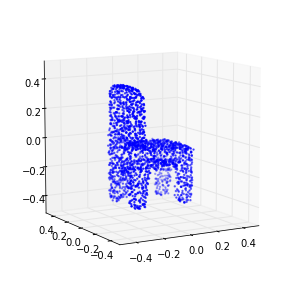

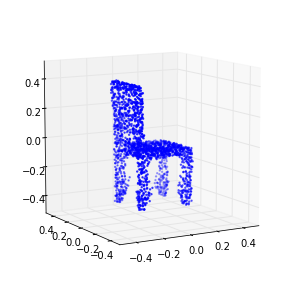

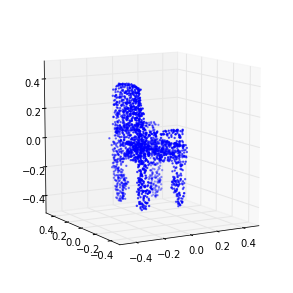

931 (-0.17207877061985158, 0.1291927366896912)
932 (-0.17182219999807852, 0.12658489357542108)
933 (-0.17173323068353866, 0.1322704534287806)
934 (-0.17339928724147655, 0.13284983734289804)
935 (-0.17266701581301513, 0.12038590786633668)
936 (-0.17496560182836321, 0.12911433009085832)
937 (-0.17295807776627717, 0.12948707546348925)
938 (-0.17171664878174112, 0.13426694522301355)
939 (-0.17119960332358325, 0.12514784711378593)
940 (-0.17397116952472264, 0.12217389930177618)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-940 is not in all_model_checkpoint_paths. Manually adding it.


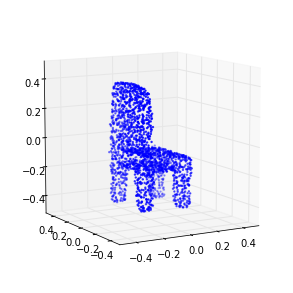

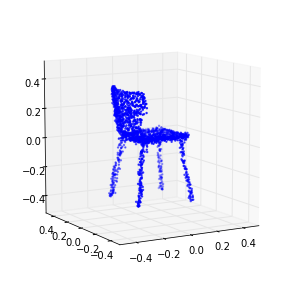

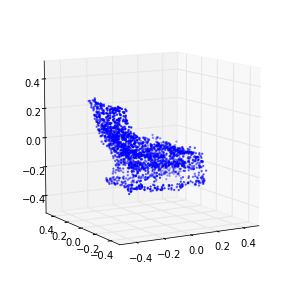

941 (-0.17248345050546859, 0.12904710708944886)
942 (-0.17132208325244763, 0.13057012055759076)
943 (-0.17137754912729616, 0.13246383490385832)
944 (-0.17319430521240942, 0.12389284096382282)
945 (-0.17341020112788236, 0.12460216052002376)
946 (-0.17338860840709122, 0.13412503291059424)
947 (-0.17155027996610711, 0.13111354714190518)
948 (-0.1720615827374988, 0.12638203109856005)
949 (-0.17318643585399346, 0.13240867687596214)
950 (-0.17218404942088658, 0.13183827808609716)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-950 is not in all_model_checkpoint_paths. Manually adding it.


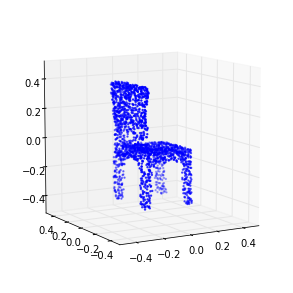

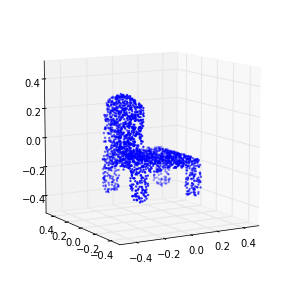

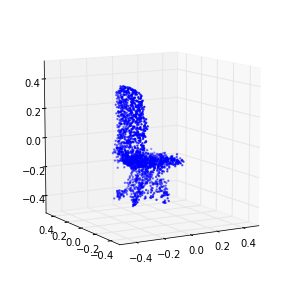

951 (-0.17231972140294535, 0.12144546486713269)
952 (-0.17145698997709485, 0.13057829301666329)
953 (-0.17266362949653907, 0.12969363122074692)
954 (-0.17133234871758354, 0.12280398690038258)
955 (-0.17282196206075173, 0.13027288488767766)
956 (-0.17390234271685281, 0.11995981440499977)
957 (-0.17226280161628016, 0.13256431729705245)
958 (-0.17156865994135539, 0.12702008447161428)
959 (-0.17415176795588599, 0.12821213652690253)
960 (-0.17347071435716416, 0.1294616107587461)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-960 is not in all_model_checkpoint_paths. Manually adding it.


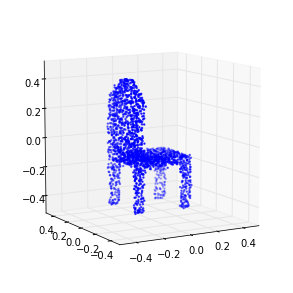

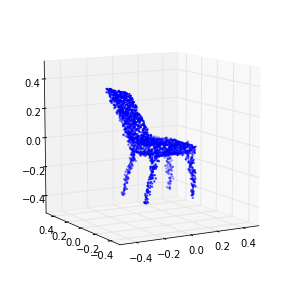

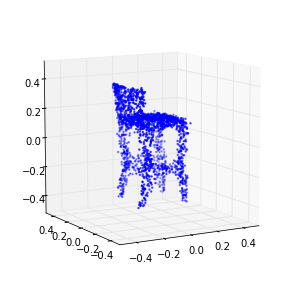

961 (-0.17243516610728371, 0.12289515634377797)
962 (-0.17182622872017048, 0.13571532760505323)
963 (-0.17318167487780253, 0.12277187655369441)
964 (-0.1734394821855757, 0.13393574566752822)
965 (-0.17370469415629353, 0.12201737805649086)
966 (-0.17297189997302162, 0.12693000060540657)
967 (-0.17292112708091736, 0.12798116852839789)
968 (-0.17328155614711621, 0.12753434534426089)
969 (-0.17291848681591176, 0.13110653807719549)
970 (-0.17279339112617351, 0.1228213737960215)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-970 is not in all_model_checkpoint_paths. Manually adding it.


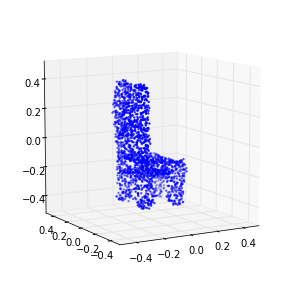

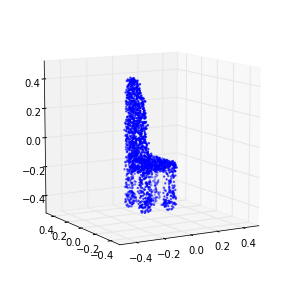

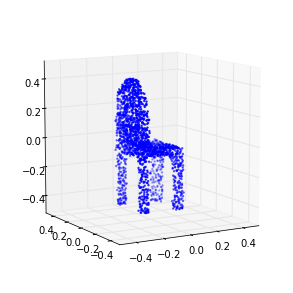

971 (-0.17422419135217312, 0.13258898782509346)
972 (-0.17518726532106046, 0.12458732669000272)
973 (-0.17367528202357116, 0.13031461062254729)
974 (-0.17445776848881334, 0.12671784504696174)
975 (-0.17502678136030833, 0.12439184525498638)
976 (-0.17221397536772268, 0.13140618276816826)
977 (-0.17356010289103896, 0.13074889861875111)
978 (-0.17450568609767489, 0.12252797075995693)
979 (-0.17303112149238586, 0.12819118218289483)
980 (-0.17328131557614715, 0.12423585824392459)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-980 is not in all_model_checkpoint_paths. Manually adding it.


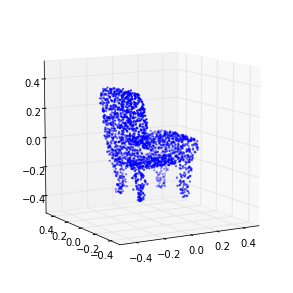

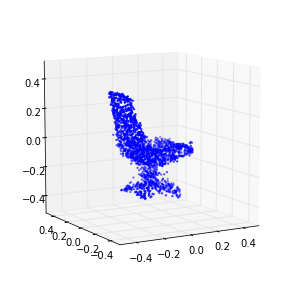

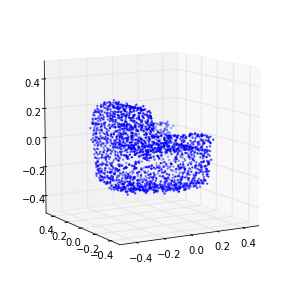

981 (-0.17403081230543277, 0.12808146244949764)
982 (-0.17348207809306956, 0.11970096854148088)
983 (-0.17401119580975286, 0.12854705309426342)
984 (-0.17293450324623674, 0.13001974699673829)
985 (-0.17339694522045276, 0.1270442552588604)
986 (-0.17380090333797313, 0.12750858951497962)
987 (-0.17343721671236886, 0.12951513131459555)
988 (-0.17495414206275234, 0.1330699548125267)
989 (-0.17356237095815163, 0.13235184412311624)
990 (-0.17285110354423522, 0.12486310027263782)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-990 is not in all_model_checkpoint_paths. Manually adding it.


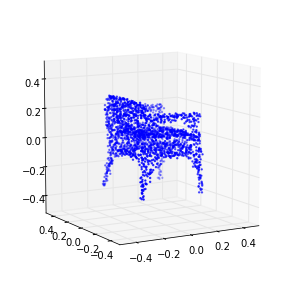

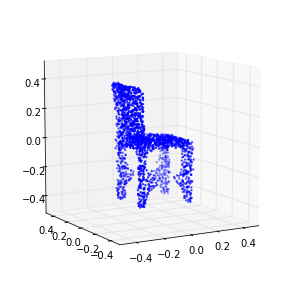

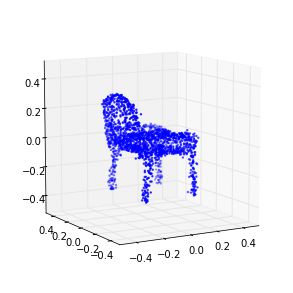

991 (-0.17313478522830539, 0.13313267159241218)
992 (-0.17315305681140333, 0.1296902801151629)
993 (-0.17394116631260625, 0.13516111809898307)
994 (-0.17424470418029361, 0.12743532988760206)
995 (-0.17254203723536599, 0.12329408664394308)
996 (-0.17444947792424095, 0.13523557037115097)
997 (-0.17520325912369622, 0.12848070346646839)
998 (-0.17460827871605203, 0.12863832684578719)
999 (-0.17429928812715742, 0.12497046451877665)
1000 (-0.17366650954440788, 0.12484237330931204)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1000 is not in all_model_checkpoint_paths. Manually adding it.


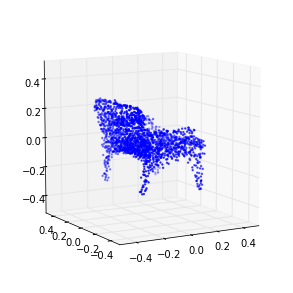

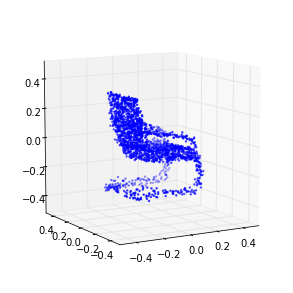

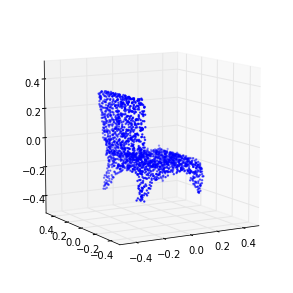

1001 (-0.17535795127903975, 0.12464770509137048)
1002 (-0.17302847780563213, 0.13019459777408177)
1003 (-0.17442296114232805, 0.11797669088398968)
1004 (-0.17370382050673167, 0.12453000882157574)
1005 (-0.17359370523028902, 0.12702610702426345)
1006 (-0.17288260945567377, 0.12796708361970055)
1007 (-0.17298326128058963, 0.1285094130370352)
1008 (-0.1723760939306683, 0.13228699509744291)
1009 (-0.17518925997945997, 0.1342105793732184)
1010 (-0.17338029300725019, 0.12254317160005923)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1010 is not in all_model_checkpoint_paths. Manually adding it.


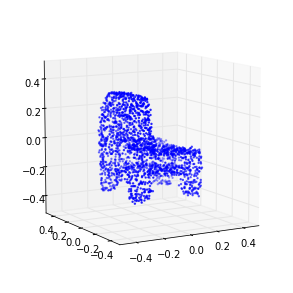

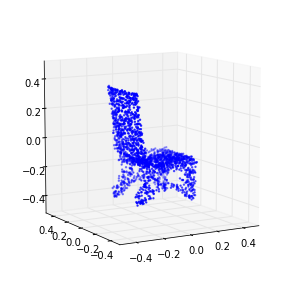

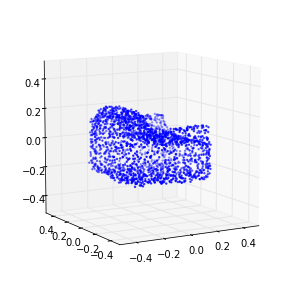

1011 (-0.17464888912660104, 0.12503812848417847)
1012 (-0.17377572523223028, 0.1254971769672853)
1013 (-0.17292976125522896, 0.13316315522900335)
1014 (-0.17341392327238012, 0.12602128971506049)
1015 (-0.17130402525266011, 0.12755415864564754)
1016 (-0.1746470816709377, 0.11804265556512056)
1017 (-0.17336367181053869, 0.11943369000046342)
1018 (-0.17440025949919666, 0.12380753843872636)
1019 (-0.17251926009301785, 0.12478494506191325)
1020 (-0.17494106060928769, 0.12709465843659859)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1020 is not in all_model_checkpoint_paths. Manually adding it.


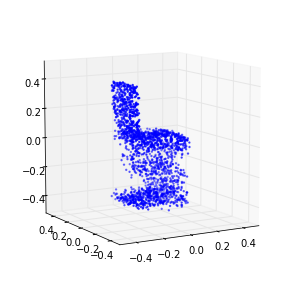

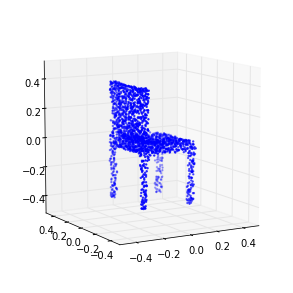

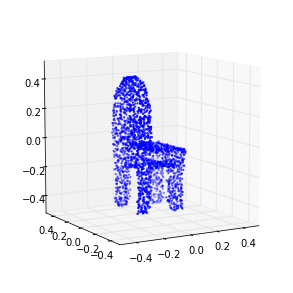

1021 (-0.17259132453688869, 0.12666322428871085)
1022 (-0.17270794102439174, 0.12921463449796042)
1023 (-0.17245918490268566, 0.12671549728623144)
1024 (-0.17352264048876587, 0.13086472230928917)
1025 (-0.17362078185434696, 0.1306347637264817)
1026 (-0.17452916745786315, 0.12342984394894706)
1027 (-0.17202949557039474, 0.12876750611596638)
1028 (-0.17411132134773114, 0.13001964379239966)
1029 (-0.17362169005252698, 0.1261680026849111)
1030 (-0.17397336518322981, 0.12346878261477859)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1030 is not in all_model_checkpoint_paths. Manually adding it.


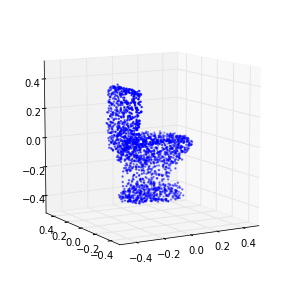

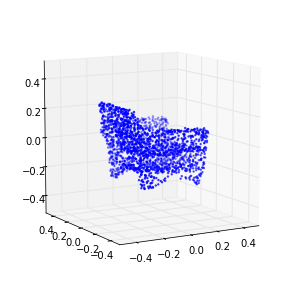

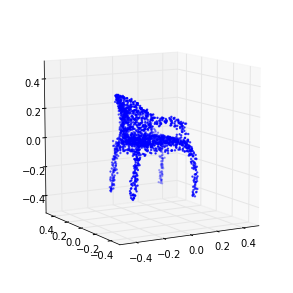

1031 (-0.17367848246185869, 0.13061883686869233)
1032 (-0.1746081550916036, 0.13188052701729316)
1033 (-0.17199214818301023, 0.12806595392801143)
1034 (-0.17386892669730716, 0.13083288073539734)
1035 (-0.17458736719908538, 0.13171715178975352)
1036 (-0.17339889020831498, 0.12661195242846454)
1037 (-0.17301839159594642, 0.12763805687427521)
1038 (-0.17396982621263574, 0.1306142114378788)
1039 (-0.17210411131381989, 0.12803464686429059)
1040 (-0.17272876843258186, 0.13375959683347632)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1040 is not in all_model_checkpoint_paths. Manually adding it.


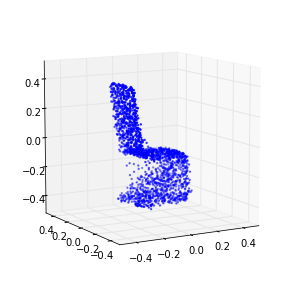

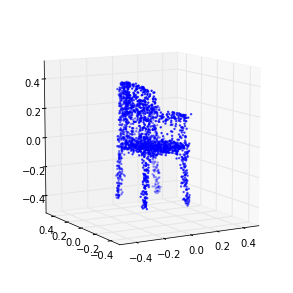

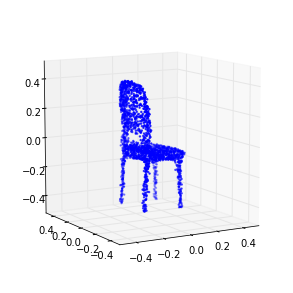

1041 (-0.17332181809125125, 0.12650024256220571)
1042 (-0.17305969264772203, 0.13192740717419871)
1043 (-0.1726745761654995, 0.12812385708093643)
1044 (-0.17377404007646774, 0.13134441166012376)
1045 (-0.17311471833123102, 0.13568574438492456)
1046 (-0.1732655312176104, 0.13175208342296105)
1047 (-0.17327785657511818, 0.13595195087017836)
1048 (-0.17429141203562418, 0.12985753350787693)
1049 (-0.17290476141152558, 0.11532132741477755)
1050 (-0.17391564614242977, 0.12538230557132651)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1050 is not in all_model_checkpoint_paths. Manually adding it.


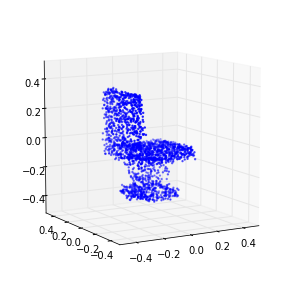

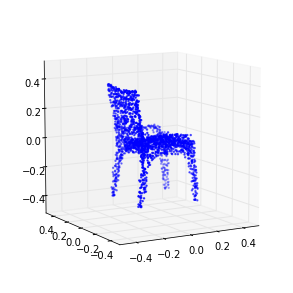

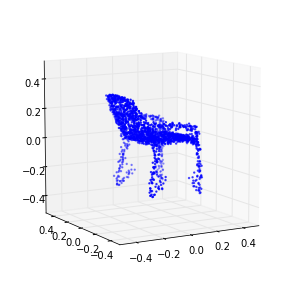

1051 (-0.17505349163655881, 0.13419816146294275)
1052 (-0.17317862102278955, 0.12937985691759321)
1053 (-0.17398110904075481, 0.13403941911679726)
1054 (-0.17110853382834681, 0.12746600447981446)
1055 (-0.17332392555695994, 0.12688431530087083)
1056 (-0.17262287040551502, 0.12850759481942212)
1057 (-0.17390934935322513, 0.12684966844541054)
1058 (-0.17307531601852841, 0.12788731135703899)
1059 (-0.1748342661945908, 0.12969184777250997)
1060 (-0.17391798540397926, 0.13098064561684927)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1060 is not in all_model_checkpoint_paths. Manually adding it.


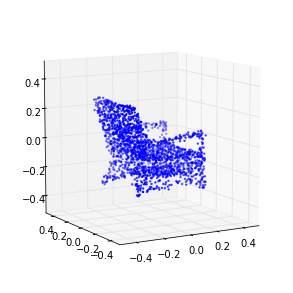

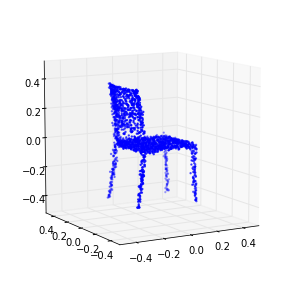

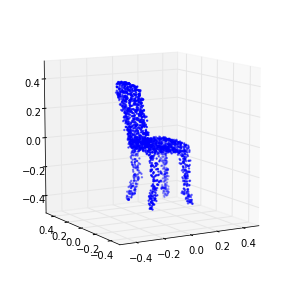

1061 (-0.1738624953561359, 0.1272607978295397)
1062 (-0.17315771701159299, 0.12883478044359772)
1063 (-0.17301844225989449, 0.12438850159998294)
1064 (-0.17415582316893119, 0.12492139140764873)
1065 (-0.17473506000306871, 0.13272491152639743)
1066 (-0.17338985690364131, 0.12324474117270222)
1067 (-0.17442759187133225, 0.1239228908110548)
1068 (-0.17407041434888487, 0.12950732862507855)
1069 (-0.17345378277478396, 0.12714499566290113)
1070 (-0.17412813736332788, 0.11870643689676567)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1070 is not in all_model_checkpoint_paths. Manually adding it.


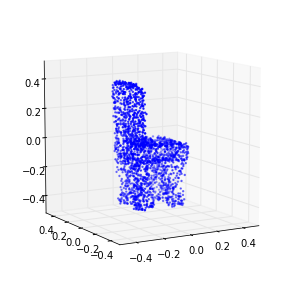

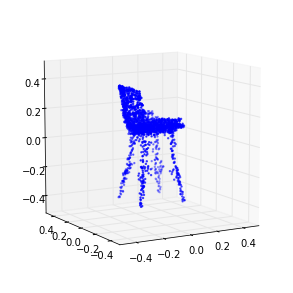

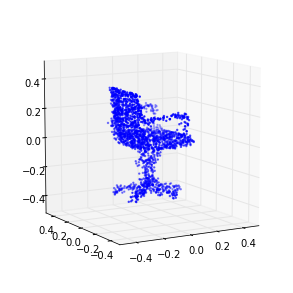

1071 (-0.17371196272196593, 0.13560723154633134)
1072 (-0.17450402047899033, 0.13371303429206213)
1073 (-0.17291307118203905, 0.13206841713852352)
1074 (-0.17417221179714909, 0.12970544315046734)
1075 (-0.17296531708152205, 0.12552861786550945)
1076 (-0.17403715131459413, 0.1327118550737699)
1077 (-0.17447640244607573, 0.13362192141788978)
1078 (-0.17485112514760759, 0.12227513641119003)
1079 (-0.17371074093712702, 0.12417280066896368)
1080 (-0.17419046649226436, 0.13314776591680669)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1080 is not in all_model_checkpoint_paths. Manually adding it.


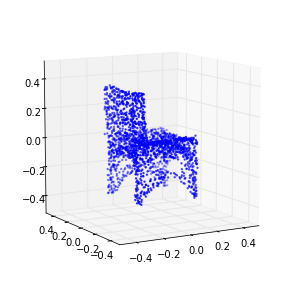

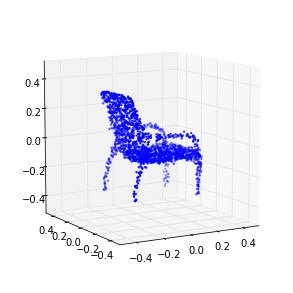

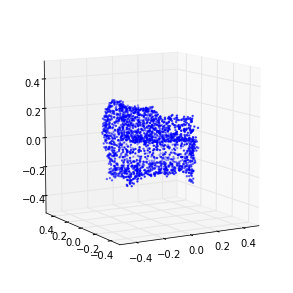

1081 (-0.1732439618419718, 0.13394753414171715)
1082 (-0.17362377787077868, 0.12451581932880261)
1083 (-0.17405463699941282, 0.12473950783411662)
1084 (-0.17264307924994715, 0.12984669594853013)
1085 (-0.175147780224129, 0.13191596528998129)
1086 (-0.17499817157233202, 0.12943195579228578)
1087 (-0.17199865535453515, 0.11984133196097833)
1088 (-0.17403080711762112, 0.12952959758264046)
1089 (-0.1744628686595846, 0.13297503772709104)
1090 (-0.17340701796390393, 0.12416037199673829)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1090 is not in all_model_checkpoint_paths. Manually adding it.


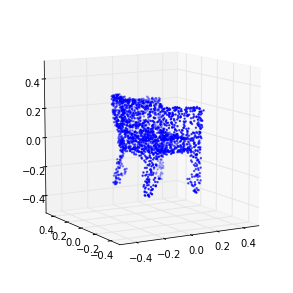

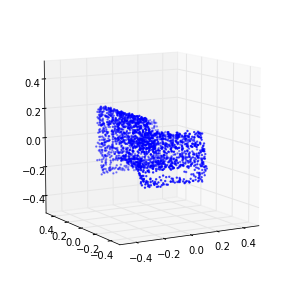

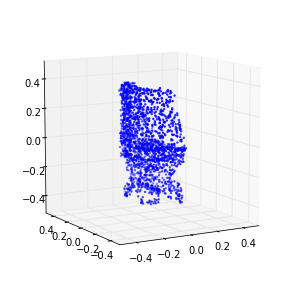

1091 (-0.17319403599809718, 0.12991167963654907)
1092 (-0.1731227222416136, 0.13021704775315743)
1093 (-0.17457716608489002, 0.12472920230141392)
1094 (-0.17375326609169994, 0.13024151573578516)
1095 (-0.17308422216662653, 0.13067114242800959)
1096 (-0.1730551118100131, 0.12824781625359147)
1097 (-0.17481571910557925, 0.12678888550511114)
1098 (-0.17393069741902528, 0.13049581122619133)
1099 (-0.17435942270137644, 0.13182054349669703)
1100 (-0.17395765505455157, 0.12377758738067415)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1100 is not in all_model_checkpoint_paths. Manually adding it.


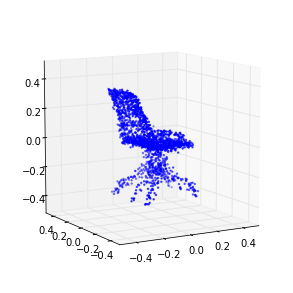

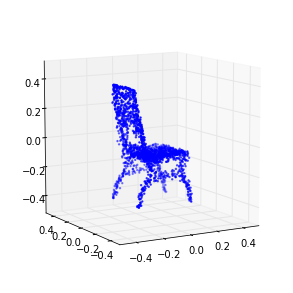

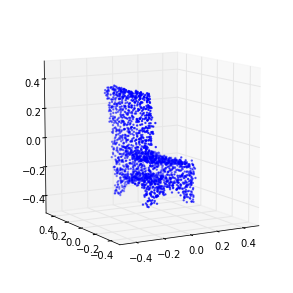

1101 (-0.17414387983304483, 0.12642385341503001)
1102 (-0.17278877237328777, 0.1297407434494407)
1103 (-0.17379238097755997, 0.13088868006511969)
1104 (-0.1740167738110931, 0.13344569890587418)
1105 (-0.17337503477379126, 0.13119269052037486)
1106 (-0.17346961448589962, 0.13643386628892687)
1107 (-0.17256461017661626, 0.13456850305751519)
1108 (-0.17368652081048047, 0.13061786912105702)
1109 (-0.17477564061129536, 0.13025037971911607)
1110 (-0.17304960246439333, 0.13830050688098977)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1110 is not in all_model_checkpoint_paths. Manually adding it.


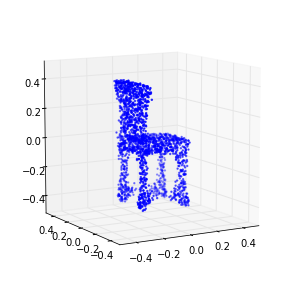

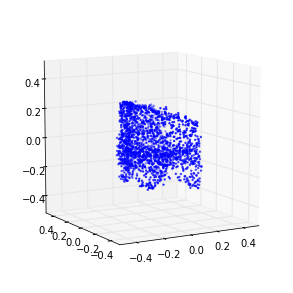

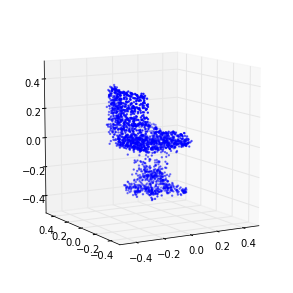

1111 (-0.17416809466150071, 0.13051252205062797)
1112 (-0.17365632918145921, 0.13474675543882228)
1113 (-0.17302984473881899, 0.12236149719467869)
1114 (-0.17470834012384767, 0.13768473764260611)
1115 (-0.17368416322602165, 0.13194130830190801)
1116 (-0.17396602597501543, 0.12864446170904018)
1117 (-0.17369871581042254, 0.13264173324461337)
1118 (-0.17280443564609246, 0.12827987003105659)
1119 (-0.17455694818938219, 0.13099987887673908)
1120 (-0.17464307535577703, 0.13177315449273144)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1120 is not in all_model_checkpoint_paths. Manually adding it.


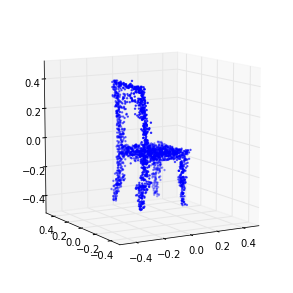

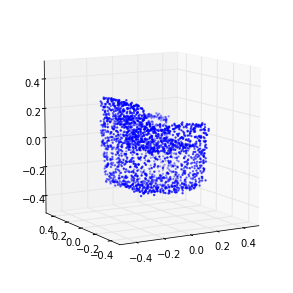

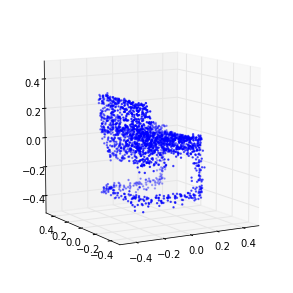

1121 (-0.17292571189226927, 0.13609156536835212)
1122 (-0.17282428498621341, 0.13513965711549478)
1123 (-0.1724038150575426, 0.13168615019983715)
1124 (-0.17340475420157114, 0.13218096560902065)
1125 (-0.17484336694081623, 0.13607390059365165)
1126 (-0.17386297263480999, 0.12730921942878654)
1127 (-0.1735233634710312, 0.13629797901268359)
1128 (-0.17236410854039369, 0.13239360462736199)
1129 (-0.17412188318040636, 0.13583118910038913)
1130 (-0.1753966493739022, 0.13655217240254083)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1130 is not in all_model_checkpoint_paths. Manually adding it.


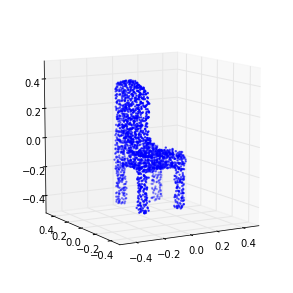

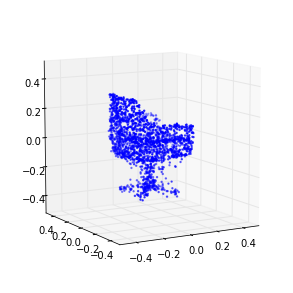

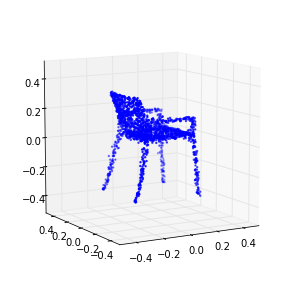

1131 (-0.17404531715092836, 0.12592201403997563)
1132 (-0.17631218874896015, 0.1336513995020478)
1133 (-0.17466446867695562, 0.1308300439958219)
1134 (-0.17313134317044859, 0.13538352841580356)
1135 (-0.17405335229855998, 0.13086663434902826)
1136 (-0.17486281770247, 0.13895960621259831)
1137 (-0.17298884060647751, 0.12869366092814338)
1138 (-0.17451739465748822, 0.13830423962186883)
1139 (-0.17331678812150603, 0.12269955293999778)
1140 (-0.17402209672662947, 0.12965360394230596)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1140 is not in all_model_checkpoint_paths. Manually adding it.


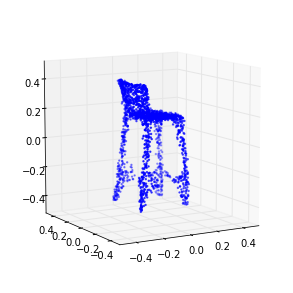

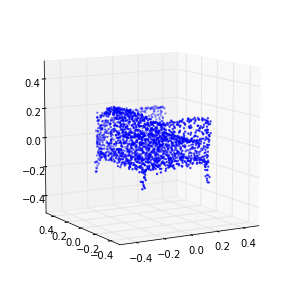

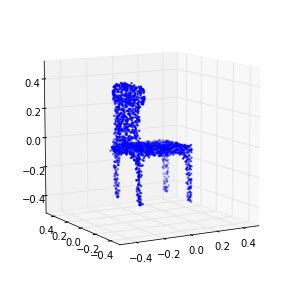

1141 (-0.17350663763505442, 0.13472683672551755)
1142 (-0.17383043103747897, 0.1322765322747054)
1143 (-0.17389975223276349, 0.12833024699378898)
1144 (-0.17428112151446165, 0.12979852132223271)
1145 (-0.17314895082403112, 0.12489473267837807)
1146 (-0.17413954227058975, 0.12300535788138707)
1147 (-0.17209077201507711, 0.13651731168782269)
1148 (-0.1740423278124244, 0.11797932259462497)
1149 (-0.17408573108690756, 0.12911738924406194)
1150 (-0.17320198350482516, 0.13270322564575407)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1150 is not in all_model_checkpoint_paths. Manually adding it.


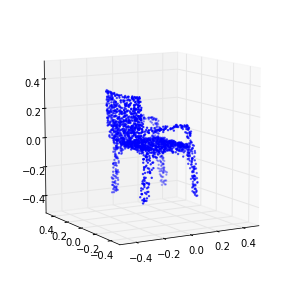

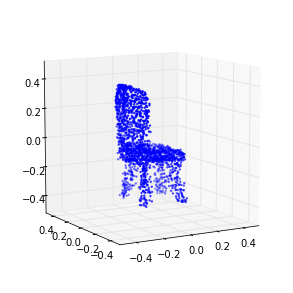

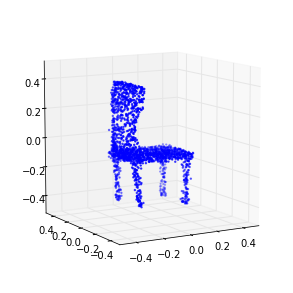

1151 (-0.17640471160411836, 0.12861418889628518)
1152 (-0.17403604454464383, 0.12892874909771812)
1153 (-0.17331526478131612, 0.12884079168240228)
1154 (-0.17318458248067786, 0.13179278097770833)
1155 (-0.17271645896964602, 0.13276497247042479)
1156 (-0.17361107325112379, 0.12797799844432761)
1157 (-0.17262159431422197, 0.13115003125535118)
1158 (-0.17384437157048119, 0.12269278781281577)
1159 (-0.17418092224333021, 0.13538441751842145)
1160 (-0.17441392044226328, 0.12715694225496715)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1160 is not in all_model_checkpoint_paths. Manually adding it.


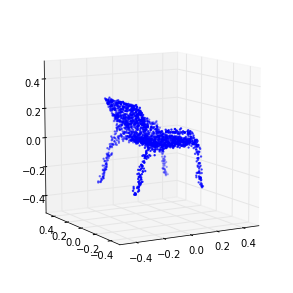

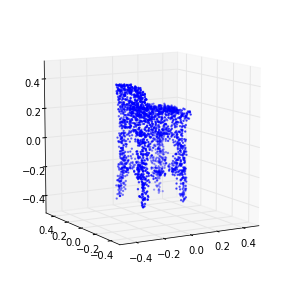

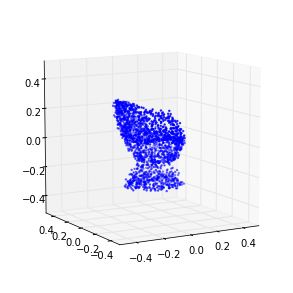

1161 (-0.17623010288786006, 0.13145526195013965)
1162 (-0.17287675186439797, 0.12090037514766057)
1163 (-0.17291263960025929, 0.13491375440800632)
1164 (-0.17331227318004325, 0.12785497666509063)
1165 (-0.17436022626029121, 0.13395739843448004)
1166 (-0.17331063857784978, 0.12405909653063174)
1167 (-0.17474957704544067, 0.12995274778869417)
1168 (-0.1737271069376557, 0.12872365061883573)
1169 (-0.17461410904372179, 0.11755322471812919)
1170 (-0.17442864157535412, 0.13670627634834359)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1170 is not in all_model_checkpoint_paths. Manually adding it.


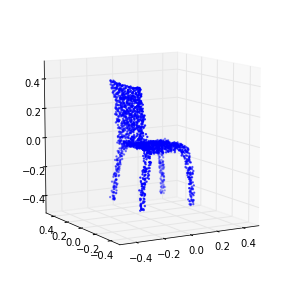

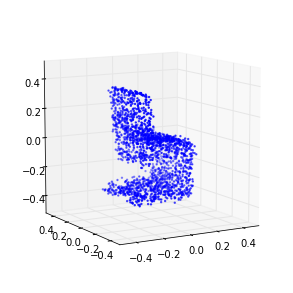

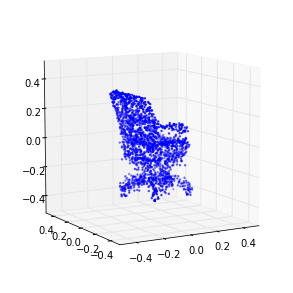

1171 (-0.17338635347507619, 0.12599566026970191)
1172 (-0.1741829389775241, 0.12445738994412953)
1173 (-0.17331875816539483, 0.12584003861303683)
1174 (-0.17480347244827835, 0.12422444505823983)
1175 (-0.1738509902247676, 0.12385541007474617)
1176 (-0.17379374713809401, 0.13201870686478084)
1177 (-0.17520042613700584, 0.1280258924320892)
1178 (-0.17441430820359125, 0.12308824862594958)
1179 (-0.17404765718513066, 0.123661360806889)
1180 (-0.17609403939158827, 0.11954906251695421)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1180 is not in all_model_checkpoint_paths. Manually adding it.


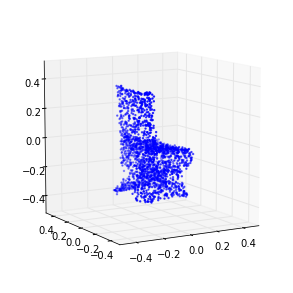

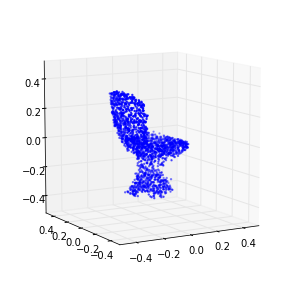

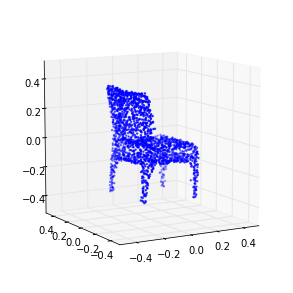

1181 (-0.17324436616014552, 0.12828815093746893)
1182 (-0.17371917907838469, 0.12580607886667605)
1183 (-0.1745702044831382, 0.12432091076064992)
1184 (-0.17420014253369084, 0.1229063606372586)
1185 (-0.17475478737442582, 0.11932272684794885)
1186 (-0.17551924718750847, 0.12170296438314297)
1187 (-0.17407096028327942, 0.12036412154082898)
1188 (-0.17449585210393975, 0.13067199565746165)
1189 (-0.17407684403437154, 0.12337418066130744)
1190 (-0.17468903406902594, 0.12069384339782926)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1190 is not in all_model_checkpoint_paths. Manually adding it.


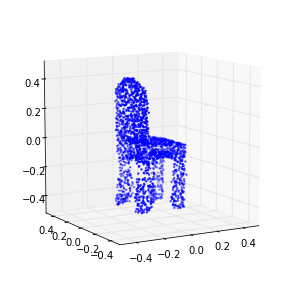

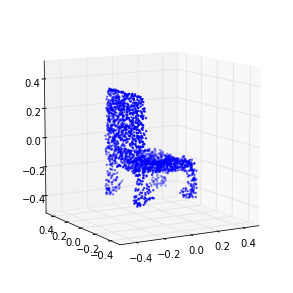

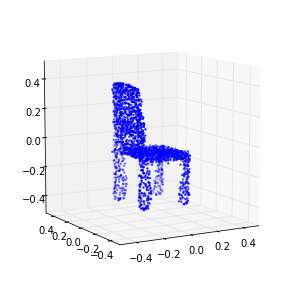

1191 (-0.17391984197828506, 0.12267922030554877)
1192 (-0.17479516433344947, 0.12259342935350206)
1193 (-0.17441558164578896, 0.11852585248373172)
1194 (-0.17404857851840833, 0.12649382512878488)
1195 (-0.17371229065789118, 0.12622219517275138)
1196 (-0.17392131906968575, 0.12589748396917624)
1197 (-0.17462028044241446, 0.12436315417289734)
1198 (-0.17421198067841706, 0.12001314510901769)
1199 (-0.17392818475211108, 0.12630303424817543)
1200 (-0.17364377721592231, 0.1133208437650292)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1200 is not in all_model_checkpoint_paths. Manually adding it.


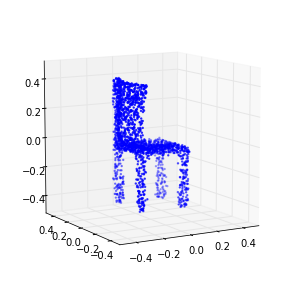

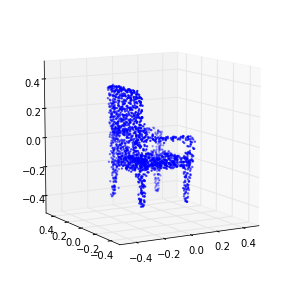

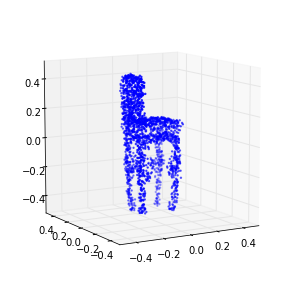

1201 (-0.17412787852463898, 0.1235539107410996)
1202 (-0.17518099480205113, 0.11896033391908363)
1203 (-0.17499996147773883, 0.12647490976033388)
1204 (-0.17358020356407872, 0.1240689707575021)
1205 (-0.17508983998386948, 0.1167745926865825)
1206 (-0.17375159506444579, 0.12444978096970806)
1207 (-0.17333534878713114, 0.13346027638073321)
1208 (-0.17562189124248645, 0.12682547089126375)
1209 (-0.1724194300395471, 0.11950030067452679)
1210 (-0.17483749676633764, 0.12813118210545293)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1210 is not in all_model_checkpoint_paths. Manually adding it.


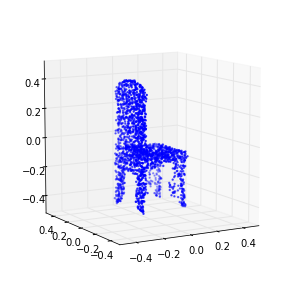

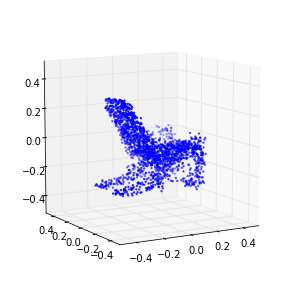

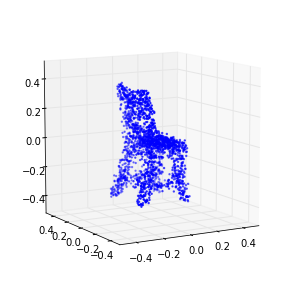

1211 (-0.17383370918256266, 0.12360275978291477)
1212 (-0.17275444887302541, 0.1205374562629947)
1213 (-0.17333831323517693, 0.11928298821051915)
1214 (-0.17474880803514409, 0.12599699199199677)
1215 (-0.17387560473548042, 0.11415946731964748)
1216 (-0.17436252545427394, 0.12473386884839446)
1217 (-0.17164975862812112, 0.12407928153320595)
1218 (-0.17322803371482426, 0.12811670452356339)
1219 (-0.17309677976149099, 0.12289057837592231)
1220 (-0.17438386480013529, 0.12492093278302087)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1220 is not in all_model_checkpoint_paths. Manually adding it.


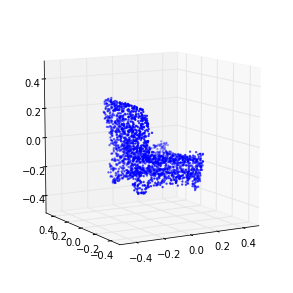

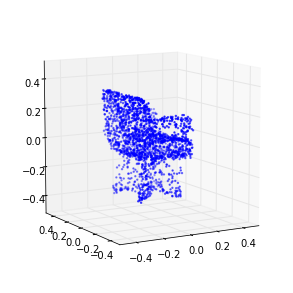

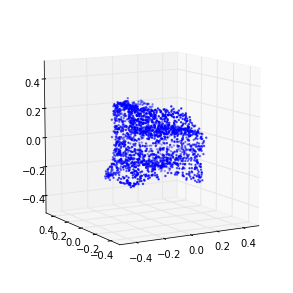

1221 (-0.17319692130442019, 0.12388756622870763)
1222 (-0.17457305579273788, 0.11828278363854797)
1223 (-0.1733756704462899, 0.11910003699638226)
1224 (-0.1742145155315046, 0.1237551834848192)
1225 (-0.17458854306627203, 0.11583703066463824)
1226 (-0.17517713330410145, 0.12398877243200938)
1227 (-0.17224521515546021, 0.12390591618087557)
1228 (-0.17400789580963277, 0.11824343408699389)
1229 (-0.17335057799462919, 0.11807722018824683)
1230 (-0.17488156557083129, 0.12858520172260426)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1230 is not in all_model_checkpoint_paths. Manually adding it.


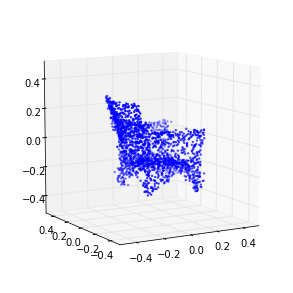

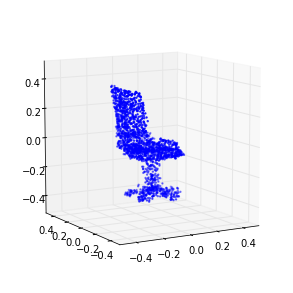

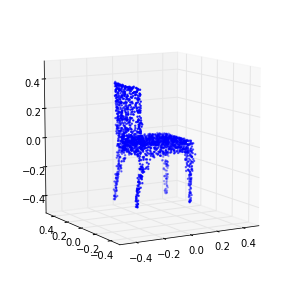

1231 (-0.17381653399379166, 0.12788673297122674)
1232 (-0.17551904762232745, 0.11512711975309584)
1233 (-0.17423962895516995, 0.13214225184034417)
1234 (-0.17530050178368886, 0.11964592392797824)
1235 (-0.17445144598130827, 0.11778862526019414)
1236 (-0.17555423654891827, 0.13035897855405454)
1237 (-0.1735217477436419, 0.12958885563744438)
1238 (-0.17302011869571826, 0.13036045790822418)
1239 (-0.175315660238266, 0.1256798784489985)
1240 (-0.17368631042816021, 0.12850708624830953)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1240 is not in all_model_checkpoint_paths. Manually adding it.


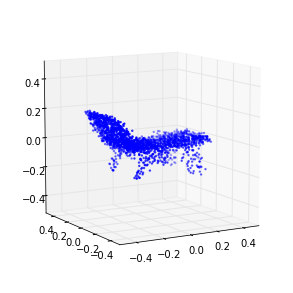

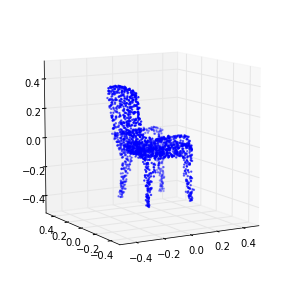

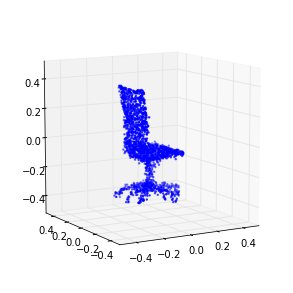

1241 (-0.17402008220001502, 0.11653827213578755)
1242 (-0.17342635680128027, 0.1219687150032432)
1243 (-0.17488425616864806, 0.12115796710605975)
1244 (-0.1745445125632816, 0.13054679582516351)
1245 (-0.17295874566943556, 0.12277169166891663)
1246 (-0.17391581027596084, 0.12546486269544671)
1247 (-0.17450777623388503, 0.1162954709596104)
1248 (-0.17478904017695673, 0.12266688407571227)
1249 (-0.17435864982781588, 0.11941522415037509)
1250 (-0.17559730940394933, 0.1223037510558411)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1250 is not in all_model_checkpoint_paths. Manually adding it.


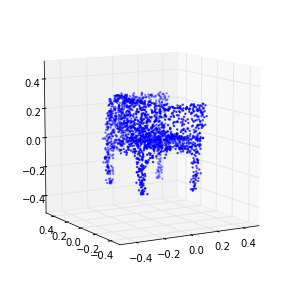

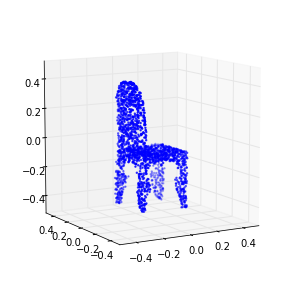

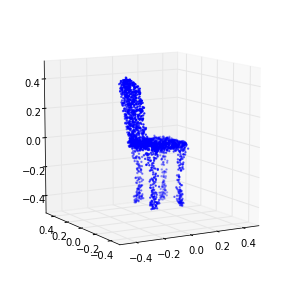

1251 (-0.17327261534002092, 0.12105244232548608)
1252 (-0.17459816667768691, 0.1189817479915089)
1253 (-0.17412094197891376, 0.11988096297891052)
1254 (-0.17389136806682304, 0.12302396805198104)
1255 (-0.17388779863163276, 0.12029236886236402)
1256 (-0.17339104447099898, 0.12234711012354603)
1257 (-0.17402962374466438, 0.12288847814003627)
1258 (-0.17424177008646505, 0.11541520224677192)
1259 (-0.17398762195198625, 0.12529951941083978)
1260 (-0.17440967217639641, 0.11583770094094453)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1260 is not in all_model_checkpoint_paths. Manually adding it.


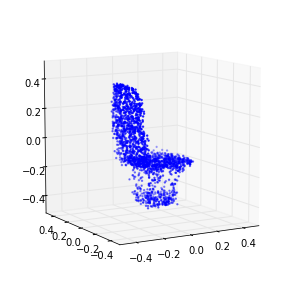

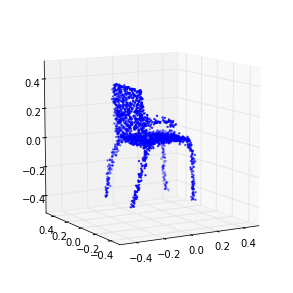

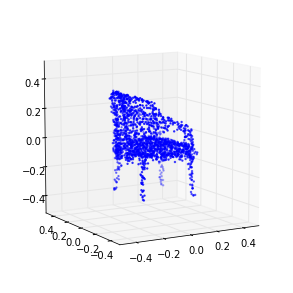

1261 (-0.17447310410164021, 0.11716688286375117)
1262 (-0.17383336259259119, 0.12211371268387194)
1263 (-0.17576071399229545, 0.128995714088281)
1264 (-0.17454827140878748, 0.11790427372411445)
1265 (-0.17521906958685982, 0.12573388550016615)
1266 (-0.17494847951111969, 0.1136980707998629)
1267 (-0.17342293372860662, 0.12311876096107342)
1268 (-0.17702962987952761, 0.11427272138772188)
1269 (-0.17457333516191553, 0.1168671327608603)
1270 (-0.17441308752254203, 0.11949021120866139)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1270 is not in all_model_checkpoint_paths. Manually adding it.


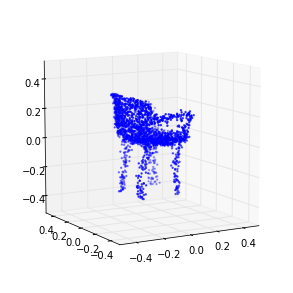

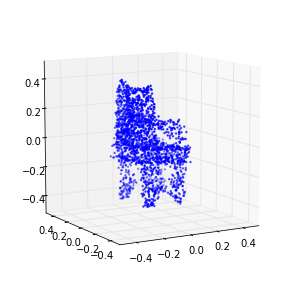

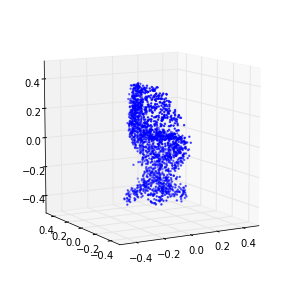

1271 (-0.17498396590903953, 0.1189356882263113)
1272 (-0.17468427673534112, 0.11995712170998256)
1273 (-0.1728879052731726, 0.11609680233178316)
1274 (-0.17367319442607737, 0.11778673750382883)
1275 (-0.1737753967444102, 0.11703133721042562)
1276 (-0.17391341814288386, 0.11495506321942364)
1277 (-0.17527437375651467, 0.11803738303758481)
1278 (-0.17486010381469019, 0.11335563245746824)
1279 (-0.17480461476025758, 0.11667047634168907)
1280 (-0.17327186266581218, 0.11062156188267248)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1280 is not in all_model_checkpoint_paths. Manually adding it.


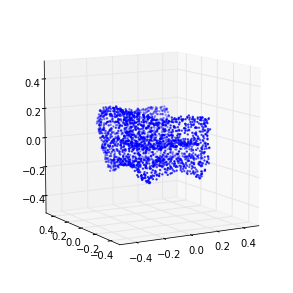

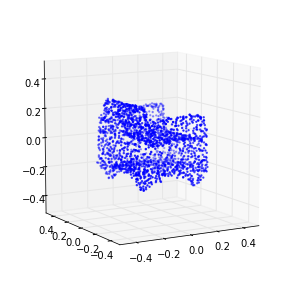

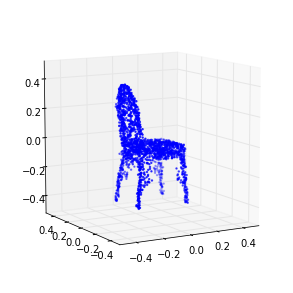

1281 (-0.17596515946918065, 0.11670958802655891)
1282 (-0.17494007415241666, 0.12098259092481048)
1283 (-0.17438383577046571, 0.11587028343368459)
1284 (-0.17362035943402185, 0.11336507510255885)
1285 (-0.17431802407458977, 0.11388047646593165)
1286 (-0.17429712547196283, 0.11823597853934323)
1287 (-0.17505375047524771, 0.11208919214981573)
1288 (-0.17490624818536971, 0.12095970715637561)
1289 (-0.17359600983284137, 0.11132179780138864)
1290 (-0.17408620207398026, 0.11214777413341734)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1290 is not in all_model_checkpoint_paths. Manually adding it.


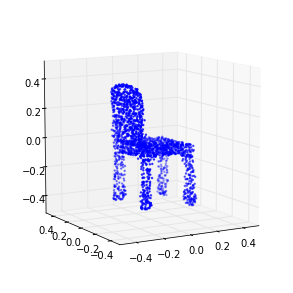

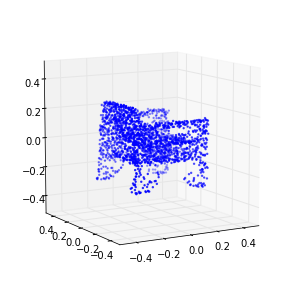

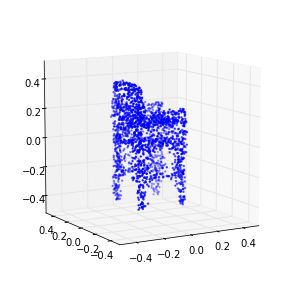

1291 (-0.17484598766874385, 0.11696673432985942)
1292 (-0.17452007681131362, 0.11594869279199177)
1293 (-0.17306579218970405, 0.11813858675735968)
1294 (-0.17405724459224278, 0.1083318676661562)
1295 (-0.17561371911455084, 0.11851654450098674)
1296 (-0.17322917646831937, 0.11350817426487252)
1297 (-0.17503446395750399, 0.10991605840347431)
1298 (-0.17501873197378937, 0.11753804954113783)
1299 (-0.17522746777092968, 0.11142436746093962)
1300 (-0.17383797985536081, 0.11752515948481029)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1300 is not in all_model_checkpoint_paths. Manually adding it.


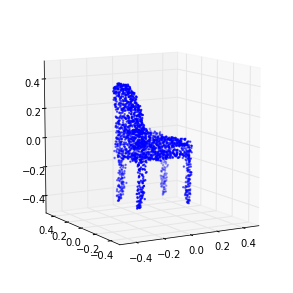

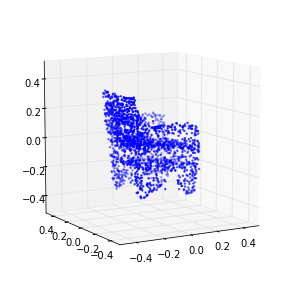

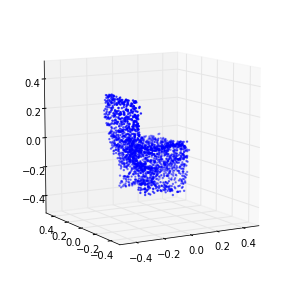

1301 (-0.17355766715826812, 0.11289318016281834)
1302 (-0.17358066108491685, 0.11817472179730733)
1303 (-0.17530016744578325, 0.11299437312064348)
1304 (-0.1733974755914123, 0.11985175090807455)
1305 (-0.17485685039449622, 0.1113036470832648)
1306 (-0.17553678331551728, 0.11524706030333484)
1307 (-0.17379964678375809, 0.11624394826315067)
1308 (-0.17321393578140823, 0.11800814751121733)
1309 (-0.1748692885041237, 0.12081519072806393)
1310 (-0.17411163846651714, 0.1174761865425993)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1310 is not in all_model_checkpoint_paths. Manually adding it.


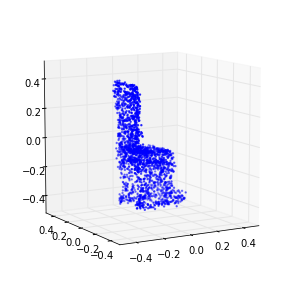

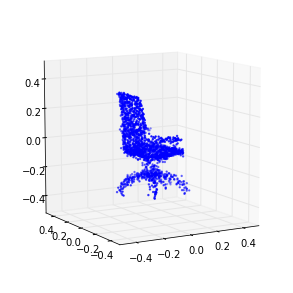

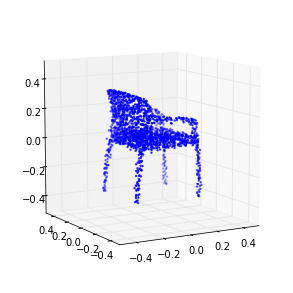

1311 (-0.17500108894374636, 0.11851182828346889)
1312 (-0.17283597389856975, 0.11579379853275087)
1313 (-0.173574925020889, 0.1187898055822761)
1314 (-0.17452402655725127, 0.11773170034090678)
1315 (-0.17454359387909923, 0.11346683071719275)
1316 (-0.17402138445112442, 0.12025901482061103)
1317 (-0.17260298475071237, 0.12324319724683408)
1318 (-0.17519095131644496, 0.11989725132783254)
1319 (-0.17458404733075036, 0.11612879926407779)
1320 (-0.17449899967069979, 0.11858720829089482)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1320 is not in all_model_checkpoint_paths. Manually adding it.


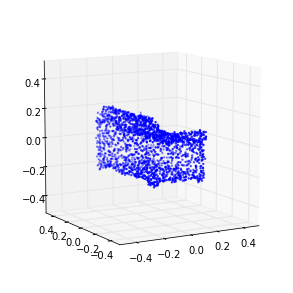

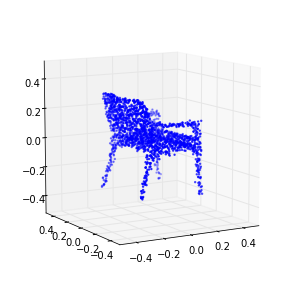

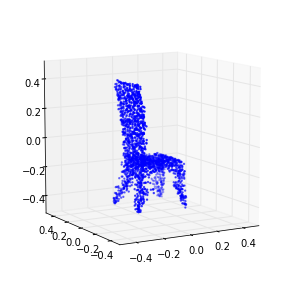

1321 (-0.17457147516586163, 0.11057249539428288)
1322 (-0.17386818958653344, 0.11354036353252552)
1323 (-0.17606866293483311, 0.11921217209762996)
1324 (-0.1743232082437586, 0.12364364912112553)
1325 (-0.17446676029099359, 0.11925906577595959)
1326 (-0.17400225886592158, 0.11530433098475139)
1327 (-0.17321595980061424, 0.11299742289163449)
1328 (-0.17454041441281637, 0.11041635909566173)
1329 (-0.175485348922235, 0.10789252900414997)
1330 (-0.17514274043065531, 0.1138023402955797)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1330 is not in all_model_checkpoint_paths. Manually adding it.


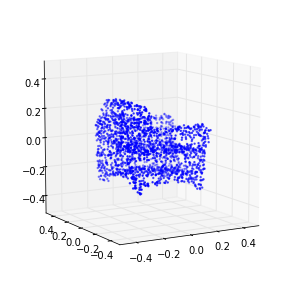

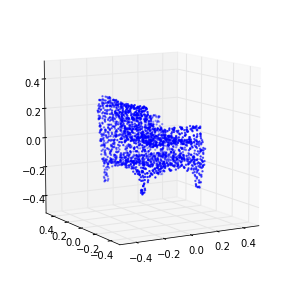

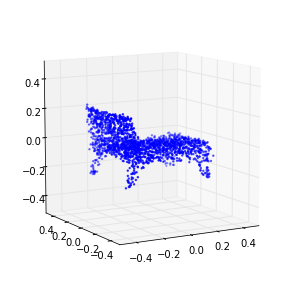

1331 (-0.17465840666382401, 0.11960697063693294)
1332 (-0.17417433019037601, 0.11317786132847821)
1333 (-0.17494420475429959, 0.1122184450979586)
1334 (-0.1735255170751501, 0.11317051809143137)
1335 (-0.17508471420517674, 0.11326039748059379)
1336 (-0.17351528052930479, 0.11392631574913308)
1337 (-0.17454685116255725, 0.11716774299188897)
1338 (-0.17590362738679957, 0.11049248305735765)
1339 (-0.17577515785340911, 0.11354561067289776)
1340 (-0.17357438410873766, 0.11630323860380384)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1340 is not in all_model_checkpoint_paths. Manually adding it.


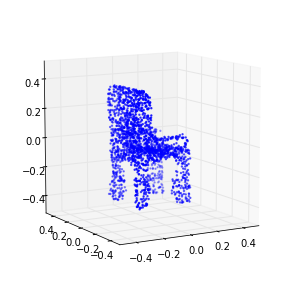

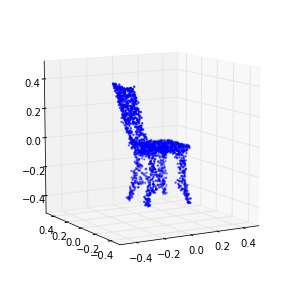

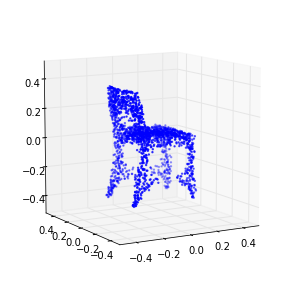

1341 (-0.17417667419822128, 0.11614001790682475)
1342 (-0.17546520144851119, 0.117179358722987)
1343 (-0.17509962949487898, 0.10783525445946941)
1344 (-0.17471553065158701, 0.11428414588725125)
1345 (-0.17413388667283236, 0.11238618029488458)
1346 (-0.17468583749400246, 0.11454711026615566)
1347 (-0.17389900253878698, 0.1172145191166136)
1348 (-0.17463672150064397, 0.11517856987538161)
1349 (-0.17544356187184651, 0.11282239799146299)
1350 (-0.17411147952079772, 0.11465179809817562)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1350 is not in all_model_checkpoint_paths. Manually adding it.


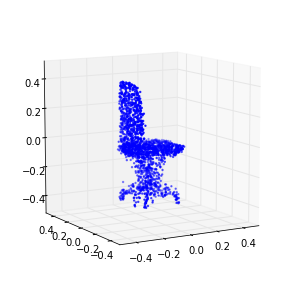

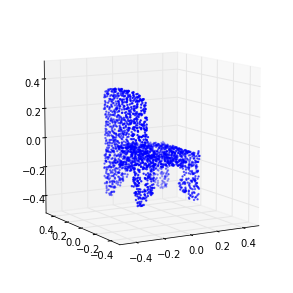

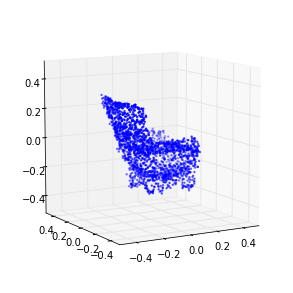

1351 (-0.17481553504864375, 0.11163173064037606)
1352 (-0.17360488518520636, 0.11474558103967596)
1353 (-0.17502207789156171, 0.11082594814123931)
1354 (-0.1748217009835773, 0.11368851529227363)
1355 (-0.17515568269623649, 0.1156803783443239)
1356 (-0.17437082330385845, 0.11469649192359713)
1357 (-0.17327704595194923, 0.11160265240404341)
1358 (-0.17390261557367112, 0.12293955683708191)
1359 (-0.17385181663212954, 0.11455523388253318)
1360 (-0.17457385802710498, 0.11420178330606884)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1360 is not in all_model_checkpoint_paths. Manually adding it.


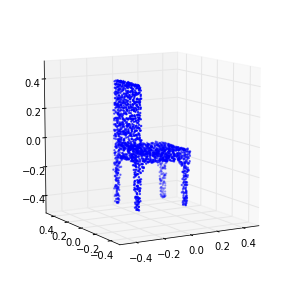

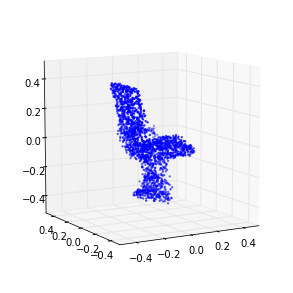

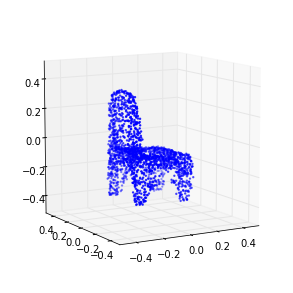

1361 (-0.17462504947627033, 0.10903538101249272)
1362 (-0.17595336205429501, 0.1161767194668452)
1363 (-0.17389844898824339, 0.12326935071636129)
1364 (-0.17593800922234853, 0.12497590040719067)
1365 (-0.17498602149663148, 0.11576411597154758)
1366 (-0.17469098258901525, 0.11370763568966477)
1367 (-0.17495587733056811, 0.11970122241311604)
1368 (-0.17550887150896921, 0.11820630342872054)
1369 (-0.1753067394097646, 0.11082392461873868)
1370 (-0.17496604345462941, 0.11291679988304774)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1370 is not in all_model_checkpoint_paths. Manually adding it.


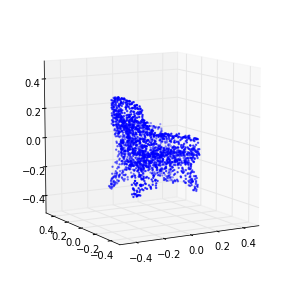

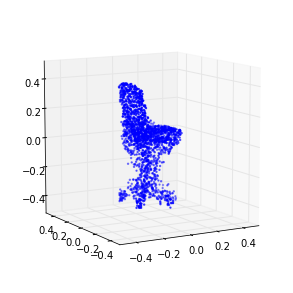

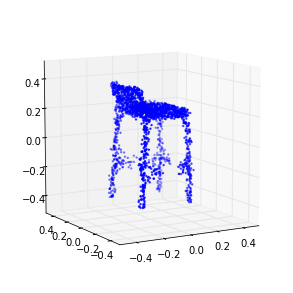

1371 (-0.17573115582819337, 0.11335094824985222)
1372 (-0.1755399935775333, 0.11040142868404035)
1373 (-0.17523026731279162, 0.108566973220419)
1374 (-0.17531043732607807, 0.11061124448423032)
1375 (-0.17565999936174465, 0.11654338047460273)
1376 (-0.17600995578147746, 0.112797269390689)
1377 (-0.17564264822889258, 0.11645773329116681)
1378 (-0.17473280672673827, 0.1161448687866882)
1379 (-0.17553522752390968, 0.11260361886686748)
1380 (-0.1748764913391184, 0.11258717819496437)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1380 is not in all_model_checkpoint_paths. Manually adding it.


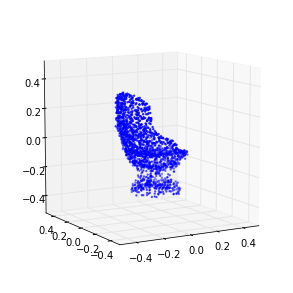

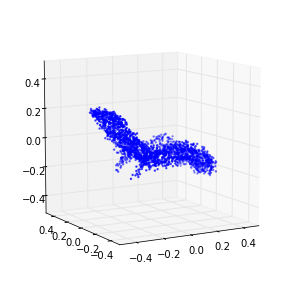

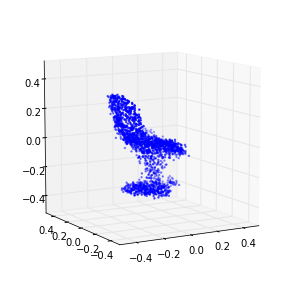

1381 (-0.17564703579302188, 0.11163237911683542)
1382 (-0.17509287899291073, 0.12027624608189971)
1383 (-0.17420424024264017, 0.11685071499259383)
1384 (-0.17374019148173156, 0.11301805879230853)
1385 (-0.17494219585701271, 0.11783101796000092)
1386 (-0.17529972559875912, 0.11516374542757317)
1387 (-0.17488508533548425, 0.11346589911867071)
1388 (-0.17325082001862702, 0.11423509292028568)
1389 (-0.17516163742100752, 0.11080986509720485)
1390 (-0.17386342717541589, 0.11130709201097488)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1390 is not in all_model_checkpoint_paths. Manually adding it.


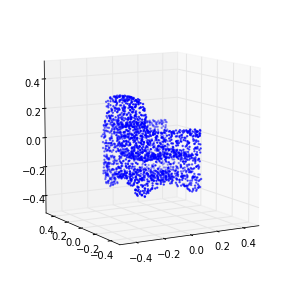

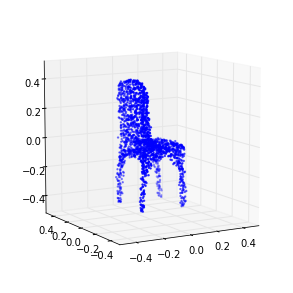

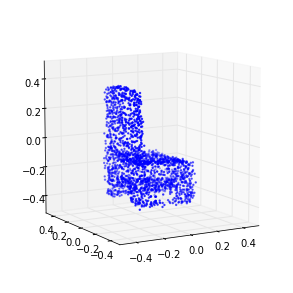

1391 (-0.17414556620297608, 0.10357747475306193)
1392 (-0.17362480925189125, 0.1109789866540167)
1393 (-0.17516094335803278, 0.10602069756499043)
1394 (-0.17483030105078662, 0.11707928473198856)
1395 (-0.17553226925708629, 0.1103999959649863)
1396 (-0.1747018877002928, 0.10878531303670672)
1397 (-0.17616114384598203, 0.11943451397948796)
1398 (-0.17647327582041422, 0.11451111182018563)
1399 (-0.17578657159098873, 0.10275328076548046)
1400 (-0.1756181138533133, 0.11111242158545388)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1400 is not in all_model_checkpoint_paths. Manually adding it.


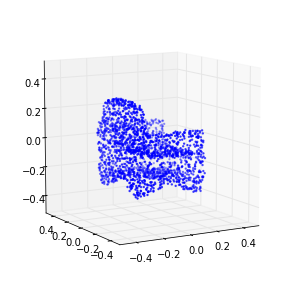

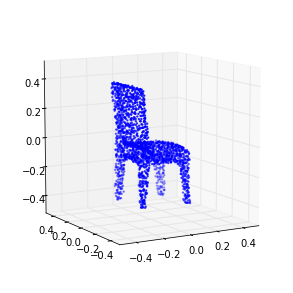

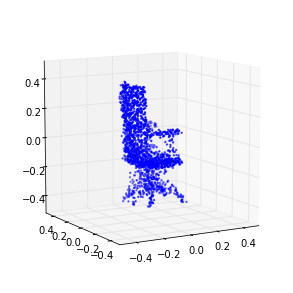

1401 (-0.17474537822935315, 0.115202479340412)
1402 (-0.17523504020991149, 0.10620061142577066)
1403 (-0.17553422307526623, 0.10952549317368755)
1404 (-0.17452469412927274, 0.11219295390226224)
1405 (-0.17508527018405773, 0.11871208774822729)
1406 (-0.17383477886517842, 0.10933588252023414)
1407 (-0.17546197683722883, 0.11150636192825106)
1408 (-0.17534392122869139, 0.11500975931132282)
1409 (-0.17606709687798111, 0.10989078824166898)
1410 (-0.17427209968920107, 0.11034153098309482)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1410 is not in all_model_checkpoint_paths. Manually adding it.


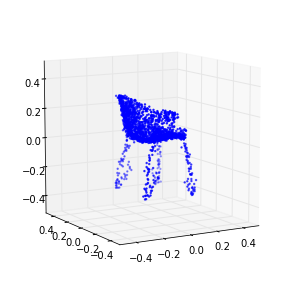

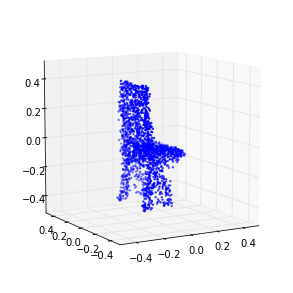

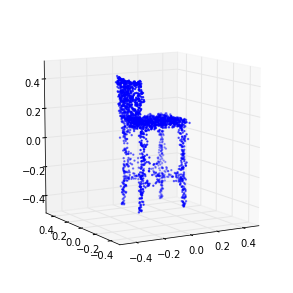

1411 (-0.17403099923222154, 0.11611994990596065)
1412 (-0.17375929035522319, 0.11028022622620617)
1413 (-0.17690846014905859, 0.11574196484353808)
1414 (-0.17465832884664889, 0.10956940524004123)
1415 (-0.17419578289544141, 0.10697471433215672)
1416 (-0.1742897746739564, 0.10874969015518825)
1417 (-0.17588547159124304, 0.10345774475071165)
1418 (-0.17502166463269128, 0.11131359664378343)
1419 (-0.1753053210399769, 0.10726139694452286)
1420 (-0.17530781505284487, 0.11838878498033241)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1420 is not in all_model_checkpoint_paths. Manually adding it.


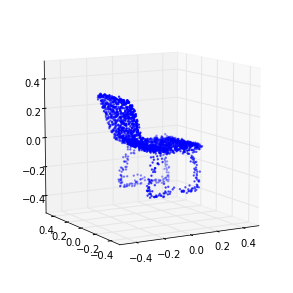

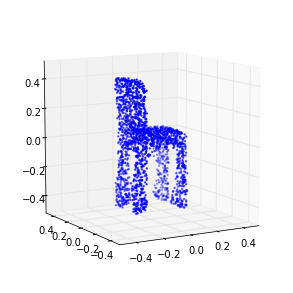

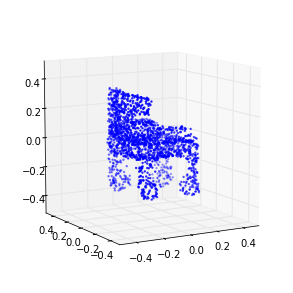

1421 (-0.1738331264919705, 0.10189120554261738)
1422 (-0.17467231518692442, 0.10774556243861164)
1423 (-0.17422116133901808, 0.10714844614267349)
1424 (-0.17551783665462775, 0.10774916106903995)
1425 (-0.1745398579924195, 0.10751298870201464)
1426 (-0.17442871552926523, 0.10557903735725968)
1427 (-0.17566684970149288, 0.11102381569367868)
1428 (-0.17418521145979562, 0.10616258200671938)
1429 (-0.17539339617446617, 0.10651136189699173)
1430 (-0.17600852648417156, 0.10881417106699061)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1430 is not in all_model_checkpoint_paths. Manually adding it.


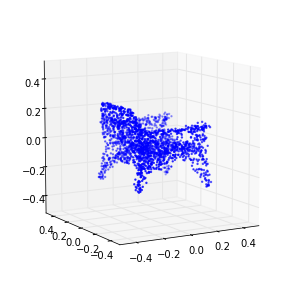

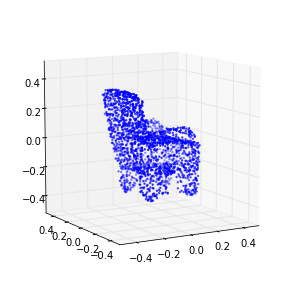

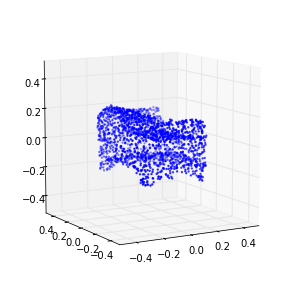

1431 (-0.17570165815176786, 0.10731363765619419)
1432 (-0.17510337708172974, 0.10628040769585857)
1433 (-0.17549086135846598, 0.10181852788836868)
1434 (-0.17768593949300271, 0.10479489520744041)
1435 (-0.1745789713329739, 0.10585065572350114)
1436 (-0.1755745154839975, 0.10290765127650013)
1437 (-0.17648077739609613, 0.10721320107027336)
1438 (-0.17503819863001505, 0.10112773130337398)
1439 (-0.17453346517350937, 0.10666611625088586)
1440 (-0.17524534861246746, 0.10854419100063818)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1440 is not in all_model_checkpoint_paths. Manually adding it.


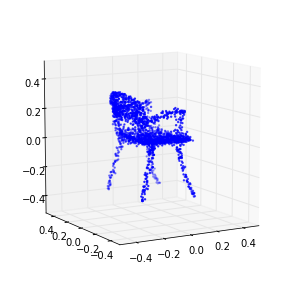

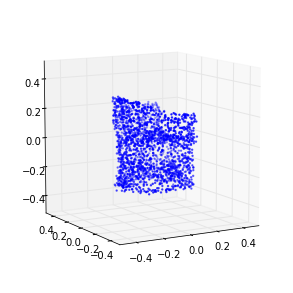

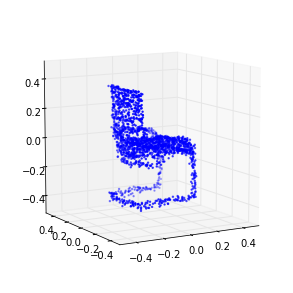

1441 (-0.17537244028515286, 0.097516921107415805)
1442 (-0.17416795161035326, 0.10999720709191428)
1443 (-0.17492940006432711, 0.1130455544701329)
1444 (-0.17602064068670625, 0.10885371185011333)
1445 (-0.17547187109788259, 0.10437954796685113)
1446 (-0.17563591533237033, 0.10661134565318073)
1447 (-0.17415274492016544, 0.10147964512860333)
1448 (-0.17669921451144749, 0.10274717736023443)
1449 (-0.17576823444278153, 0.10189737793472078)
1450 (-0.17399227619171143, 0.10173238813877106)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1450 is not in all_model_checkpoint_paths. Manually adding it.


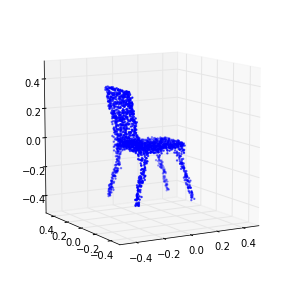

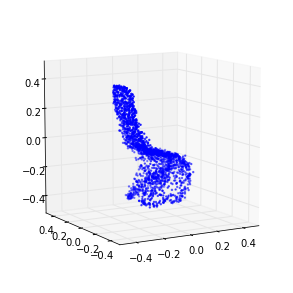

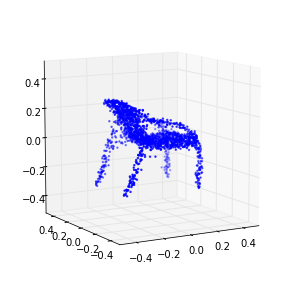

1451 (-0.17750454556058953, 0.096729767819245652)
1452 (-0.174421187793767, 0.10505667549592478)
1453 (-0.17507067819436392, 0.10819661948415968)
1454 (-0.17533178329467775, 0.10458533300293817)
1455 (-0.17399994576418842, 0.10391493500382812)
1456 (-0.17455007157943866, 0.11271735694673327)
1457 (-0.17447465260823566, 0.10016931758986579)
1458 (-0.17392410735289257, 0.10924704014151185)
1459 (-0.17507825129561955, 0.11035252666031872)
1460 (-0.1740094272074876, 0.099384320830857312)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1460 is not in all_model_checkpoint_paths. Manually adding it.


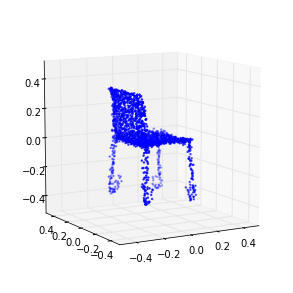

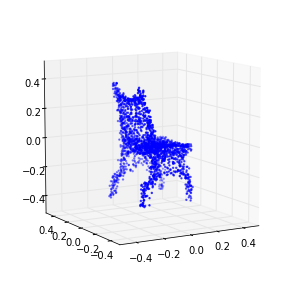

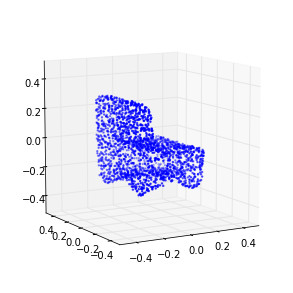

1461 (-0.17672560391602693, 0.10222982477258753)
1462 (-0.17488819084785603, 0.10131614213740384)
1463 (-0.17515753706296286, 0.10279784544750496)
1464 (-0.17539209436487269, 0.10146864503622055)
1465 (-0.17499545183446671, 0.10227431881207007)
1466 (-0.17478925618860458, 0.10211683340646603)
1467 (-0.17434684810815035, 0.10151033269034491)
1468 (-0.17445115171096942, 0.10366592804590861)
1469 (-0.17605413176395274, 0.10905671036905712)
1470 (-0.17672423902485107, 0.10797005615852497)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1470 is not in all_model_checkpoint_paths. Manually adding it.


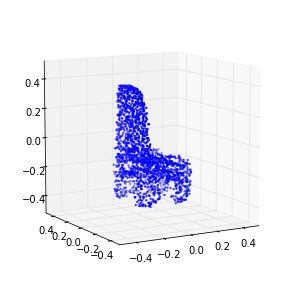

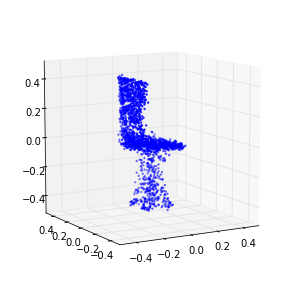

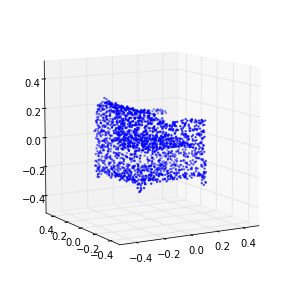

1471 (-0.17453866512687119, 0.1082027546233601)
1472 (-0.17495775796748975, 0.10251813050773409)
1473 (-0.17594305652159231, 0.10052455713351567)
1474 (-0.17421339650948842, 0.10186982761930537)
1475 (-0.17550963439323283, 0.10248010108868282)
1476 (-0.17424480374212617, 0.096313973543820555)
1477 (-0.17344043850898744, 0.10557088255882263)
1478 (-0.17461592985524071, 0.09938797023561266)
1479 (-0.17490870908454612, 0.1003075451762588)
1480 (-0.17645048190046239, 0.095450067685710058)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1480 is not in all_model_checkpoint_paths. Manually adding it.


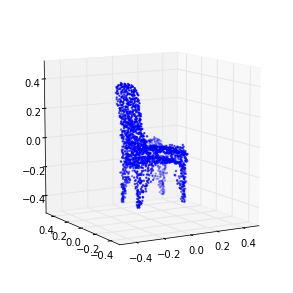

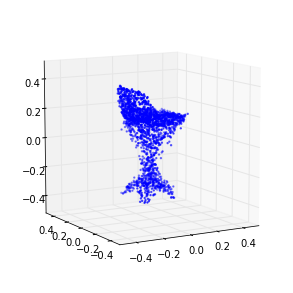

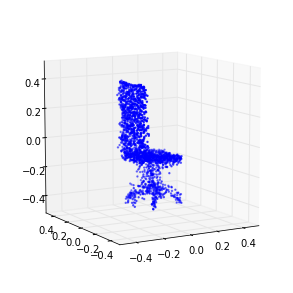

1481 (-0.17500375663792644, 0.10386923148676201)
1482 (-0.17556949136433778, 0.11130276957043896)
1483 (-0.17328217813262234, 0.11064700340783154)
1484 (-0.17590620606033891, 0.10769026643700069)
1485 (-0.17403978153511329, 0.10367686356659289)
1486 (-0.17540116850976592, 0.10695824854903752)
1487 (-0.17424616901962844, 0.09563904835118188)
1488 (-0.17471195569744816, 0.10741592557341964)
1489 (-0.17526961498790317, 0.10449256996313731)
1490 (-0.1751473788861875, 0.099719005878324857)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1490 is not in all_model_checkpoint_paths. Manually adding it.


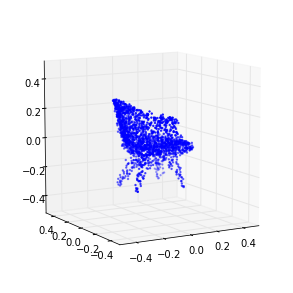

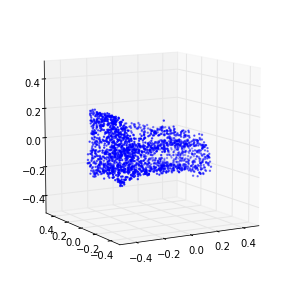

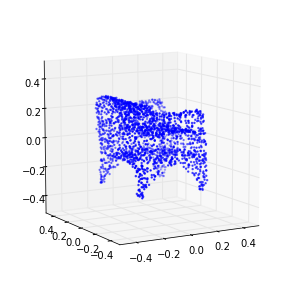

1491 (-0.17541314473858585, 0.10695441619113639)
1492 (-0.17444255274754983, 0.10124917631899868)
1493 (-0.17398377623822953, 0.10405195918348101)
1494 (-0.17545644431202501, 0.10152387315476383)
1495 (-0.17490086732087312, 0.10393248939955677)
1496 (-0.17463954477398483, 0.099164864807217215)
1497 (-0.17429531028977147, 0.094315071900685624)
1498 (-0.1754975547393163, 0.098936749829186335)
1499 (-0.17625616225931379, 0.096163408347853904)
1500 (-0.17448205804383313, 0.094868540211960117)
INFO:tensorflow:/orions4-zfs/projects/lins2/Panos_Space/DATA/OUT/icml/nn_models/gan/nb_gan/nb_wgan_gp_ae_15_emd_chair_2048_best_epoch/models.ckpt-1500 is not in all_model_checkpoint_paths. Manually adding it.


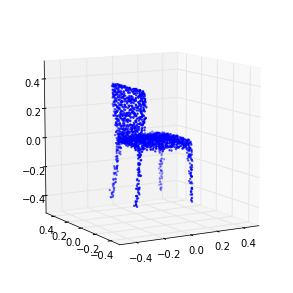

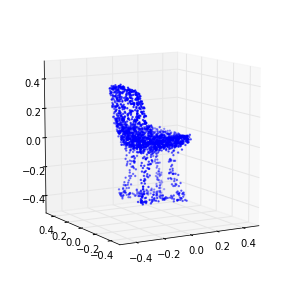

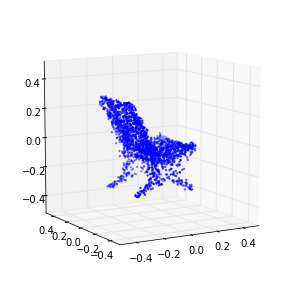

In [10]:
save_dir = osp.join(synthetic_data_out_dir, experiment_name)
save_dir = create_dir(save_dir)

buf_size = 1 # flush each line
if do_training:    
    train_stats = []
    log_file = open(osp.join(train_dir, 'train_stats.txt'), 'a', buf_size)
    for _ in range(max_epochs):        
        loss, duration = gan._single_epoch_train(training_data, batch_size, noise_params)
        epoch = int(gan.sess.run(gan.epoch.assign_add(tf.constant(1.0))))
        print epoch, loss                
        log_file.write('%04d\t%.9f\t%.9f\t%.4f\n' % (epoch, loss[0], loss[1], duration / 60.0))        

        if save_model and (epoch % saver_step == 0 or epoch <= 5):
            checkpoint_path = osp.join(train_dir, model_saver_id)
            gan.saver.save(gan.sess, checkpoint_path, global_step=gan.epoch)
            syn_latent_data = gan.generate(n_syn_samples, noise_params)
            syn_data = ae.decode(syn_latent_data)
            np.savez(osp.join(save_dir, 'epoch_' + str(epoch)), syn_data)
            for k in range(3):
                Point_Cloud(syn_data[k]).plot(in_u_sphere=True)
                        
        train_stats.append((epoch,) + loss)
    log_file.close()

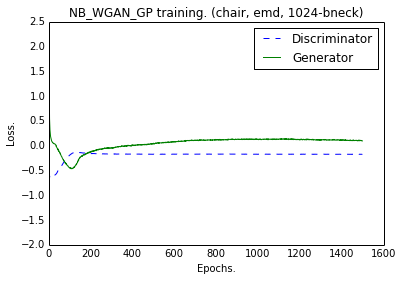

In [11]:
if do_plotting:
    x = range(len(train_stats))
    d_loss = [t[1] for t in train_stats]
    g_loss = [t[2] for t in train_stats]
    plt.plot(x, d_loss, '--')
    plt.plot(x, g_loss)
    plt.title('NB_WGAN_GP training. (%s, %s, %s-bneck)' %(class_name, ae_loss, ae.bottleneck_size))
    plt.legend(['Discriminator', 'Generator'], loc=0)
    
    plt.tick_params(axis='x', which='both', bottom='off', top='off')
    plt.tick_params(axis='y', which='both', left='off', right='off')
    
    plt.xlabel('Epochs.') 
    plt.ylabel('Loss.')
    
    plt.savefig(osp.join(train_dir, 'training_curve.png'))